## *Import Librairies, Define Variables, Test Connexion*

In [1]:
import urllib
from sqlalchemy import create_engine

import pandas as pd
import matplotlib.pyplot as plt
from datetime import date, timedelta
from time import time
from dateutil.relativedelta import relativedelta
import math

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

import pmdarima.arima as pm
from scipy.signal import butter,filtfilt

from dateutil.easter import easter

import numpy as np

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM, Flatten
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from keras.layers import ConvLSTM2D

Very_Start = time()

### DEFINITION DE TOUS LES PARAMETRES

In [2]:
# @param Save Figure
save_fig    = False      # If True : Save the figure that are plot ; If show_fig == False, figure won't be save 
save_folder = 'UC1_fig'  # Folder where the figure is saved

# All stuffs for the connection to the DB AZURE
driver= '{ODBC Driver 17 for SQL Server}'
server = 'dlt-bi.database.windows.net'
username = 'WVN-TEST'
database = 'DelitraiteurBI_Prod'
password = 'jYei0u22cGZiE9F4VFER'
login = ('DRIVER=' + driver + 
         ';SERVER=' + server + 
         ';PORT=1433;DATABASE=' + database + 
         ';UID=' + username + 
         ';PWD=' + password)

# Connexion DB LOCAL 
database = 'Export Data Prod'
driver   = '{ODBC Driver 17 for SQL Server}'
server   = 'E5591-9S6YMV2'
username = 'WVN\k.dubrulle'
login    = ('DRIVER=' + driver + 
         ';SERVER='   + server + 
         ';Trusted_Connection=yes;')


# @param DB / Table / Column Name   -> Should be changed if you change DB
"""
    Il faut ici récupérer toutes les recettes des tickets.
    Les recettes sont contenues dans la table DETAIL_TICKET et dans la table ENTETE_TICKET.
    Cette dernière prend moins de data mais ne permet pas de travailler sur les univers.
    
    Les données sont split à certains moment entre univers et magasin.
    Des prédictions sur les deux sont fait.
    
    Une autre possibilité est de récupérer le chiffre d'affaire de certains article/marque.
    Pour filtrer ces articles, un libellé type est requis (ex: starbucks)
    On pourra alors faire des prédiction uniquement sur les article contenant ce libellé.
"""

DB             = database

schema_fact    = "DWH"
schema_dim     = "PML"

TABLE_ENTETE   = "Recette_entete_ticket_agrege"
TEMPS_ENTETE   = TABLE_ENTETE               + ".TEMPS.KEY"
RECETTE_ENTETE = TABLE_ENTETE               + ".Total_net_ticket_ttc"
MAGASIN        = "MAGASIN"


TABLE_DETAIL   = "Recette_detail_ticket_agrege"
TABLE_ARTICLE  = "ARTICLE_METI"
TABLE_HIST     = TABLE_ARTICLE + "_HIST"
RECETTE_DETAIL = TABLE_DETAIL  + ".Total_net_ttc_ligne"
TEMPS_DETAIL   = TABLE_DETAIL  + ".TEMPS.KEY"

TABLE_UNIVERS  = "Univers"

# CEATE engine for connexion 
params = urllib.parse.quote_plus(login)
engine = create_engine("mssql+pyodbc:///?odbc_connect=%s" % params)

In [3]:
# TEST Connexion
conn = engine.connect()

print(pd.read_sql("SELECT TOP(10) ["+TABLE_UNIVERS+".KEY] FROM ["+DB+"].["+schema_dim+"].[Dim_"+TABLE_UNIVERS+"]", conn))

conn.close()

   Univers.KEY
0           -1
1            1
2            2
3            3
4            4
5            5
6            6
7            7
8            8
9            9


## Chargement et Prétraitement des Données 

In [4]:
"""
    Convert date from date format to the format YYYYMMDD
    
        @ input :
            - d [datetime.date]
        
        @ output :
            - YYYYMMDD [int]
                key used in the DB in the table TEMPS
"""
def date_to_key(d):
    return d.year*10000 + d.month*100 + d.day

In [5]:
"""
    Les Articles sont regroupés en univers.
    Les Univers possèdent 4 niveau de profondeur/précision.
    Plus la profondeur est élevés, plus il y a d'univers et plus c'est précis.
        Univers_Depth = 1 => #Univers = 16
        Univers_Depth = 4 => #Univers = 490
    
    Deux univers sont commun à N niveau près si leur N premier libellé sont commun.
    Pour obtenir les univers d'une ceraines profondeurs, on regarde alors les libellés distincts.
    
    
        @ Input : 
            - Univers_Depth [int] = [1;4]
                Niveau de profondeur jusqu'où aller
        
        @ Ouput : 
            - Univers Correspondance [dict] = {(Univers_Key : Univers_Key_Correspondance)}
                Dictionnaire permettant de savoir quel univers correspond à un autre pour un certain degré de profondeur.
                L'univers Univers_Key devient Univers_Key_Correspondance pour une profondeur Univers_Depth
        
"""
def get_univers_correspondance(Univers_Depth):
    #SQL Request to select Key + 4 level of libelle of the table Dim_Univers
    sql_command = '''SELECT 
        [''' + TABLE_UNIVERS + '''.KEY],
        [''' + TABLE_UNIVERS + '''.Libelle_univers1_FR], 
        [''' + TABLE_UNIVERS + '''.Libelle_univers2_FR], 
        [''' + TABLE_UNIVERS + '''.Libelle_univers3_FR], 
        [''' + TABLE_UNIVERS + '''.Libelle_univers4_FR]
        FROM [''' + DB + '''].[''' + schema_dim + '''].[Dim_''' + TABLE_UNIVERS + ''']'''

    #Connexion to DB and load DataFrame
    conn = engine.connect()
    df_univers = pd.read_sql(sql_command, conn)
    conn.close()
    
    # If Univers_Depth == -1 then no correspondance are made
    if Univers_Depth == -1:
        return {i:i for i in range(-1,max(df_univers.values[:,0]+1))}
    
    #Variable to return
    univers_correspondance = {}
    #Stocks Univers key which is deleted.
    deleted = set()
    
    """
        Double boucle, on vérifie pour l'univers 1 si il existe des univers commun,
        puis sur l'univers 2 si il n'est pas supprimé, 
        puis sur le 3, etc.
    """
    for item in df_univers.values:
        if item[0] in univers_correspondance.keys():
            continue
        univers_correspondance[item[0]] = item[0]
        for cor in df_univers.values: 
            # If libelle 1 to Univers_Depth of both univers are the same, they are the same
            if item[0] != cor[0] and (
                item[1] == cor[1] and
                (item[2] == cor[2] or Univers_Depth < 2) and
                (item[3] == cor[3] or Univers_Depth < 3) and
                (item[4] == cor[4] or Univers_Depth < 4)
            ):
                univers_correspondance[cor[0]] = item[0]
        
    return univers_correspondance

In [6]:
"""
    Convert a DataFrame that contain all CA in all ticket in a timeserie.
    Dataframe has to have 2 column :
        - Time Column : time when the CA were made. Format to YYYYMMDD.
        - CA Column   : CA that were made (float)
    
    Timeseries will be a panda.Series with date as index and CA (float) as value.
    
        @ input :
            - dataframe [pd.DataFrame]
                DataFrame which contain time and CA 
            - COL_TEMPS [str]
                Name of the time column
            - COL_RECETTE [str]
                Name of the CA column
            - show_plot [boolean]
                if True, plot the timeseries after generate it
            - do_log [boolean]
                if True, apply a logartithm filter on the timeseries
                
        @ output
            - timeseries [pd.Series]
                Series with date as index and total CA as value
"""
def get_timeseries(dataframe, COL_TEMPS, COL_RECETTE, show_plot = False, do_log = False):
    # if dataframe is empty, return empty Series
    if len(dataframe) == 0:
        return pd.Series(data = [], index = [])
    
    Tot_recette_day = {}

    # Fill the Tot_recette_day with all the date in dataframe. Convert date from key YYYYMMDD to datetime.date
    for i in range(len(dataframe)):
        d = int(dataframe[COL_TEMPS][i])
        # convert d YYYYMMDD to date
        year  = d//10000
        month = d//100   - year *100
        day   = d        - month*100 - year*10000
        d = date(year,month,day)

        if not d in Tot_recette_day.keys():
            Tot_recette_day[d] = 0
        Tot_recette_day[d] += dataframe[COL_RECETTE][i]

    # Apply a loofarithm on all value if do_log == True
    if do_log:
        for key in Tot_recette_day.keys():
            Tot_recette_day[key] = math.log(Tot_recette_day[key])/math.log(10)
    
    # If some value weren't in the dataframe for some date, put it at '0'
    max_d    = max(Tot_recette_day.keys())
    actual_d = min(Tot_recette_day.keys())
    counter = 0
    while actual_d < max_d:
        actual_d += timedelta(days = 1)
        if not actual_d in Tot_recette_day.keys():
            Tot_recette_day[actual_d] = 0
            counter += 1
            
    # If series contains lot's of '0' or ended long before today, we assume Series is null
    if max_d < date.today() + timedelta(days = -60) or counter > 0.2*len(Tot_recette_day):
        return pd.Series()
    
    #Sort the items by date is necessary, sometimes it isn't sorted ! ~30 items/month so it's fast
    Tot_recette_day = dict(sorted(Tot_recette_day.items()))

    # convert tot_recette_day to a pd.Series
    timeseries = pd.Series(Tot_recette_day)
    
    if show_plot:
        timeseries.plot(label="Data",legend=True, figsize=(15,7))
        plt.title("Timeserie")
        plt.show()
    
    return timeseries

In [7]:
"""
    Decompose la timeseries en deux morceau :
        - La moyenne de chaque mois
        - La différence de la série par rapport au moyenne du mois
    Cette décomposition permettra de créer certain modèle qui pourront faire des prédictions si il y a de fortes variations sur le mois.
    
        @ input : 
            - timeseries [pd.Series]
                series temporelle à décomposer
            - show_plot [booleand]
                if True, plot the timeseries after generate it
        
        @ output :
            - ts_month [pd.Series]
                series ayant la moyenne de chaque mois
            - ts_monthless
                serie contenant la différence de la série principale par rapport au moyenne du mois - ts_month
"""
def decompose_series(timeseries, show_plot = False):
    Mean_recette_month = {}
    number_day_month   = {}
    
    # Calculate total CA in the month
    for k in timeseries.index:
        if not date(k.year, k.month, 1) in Mean_recette_month.keys():
            Mean_recette_month[date(k.year, k.month, 1)] = 0
            number_day_month[date(k.year, k.month, 1)]   = 0
        Mean_recette_month[date(k.year, k.month, 1)] += timeseries[k]
        number_day_month[date(k.year, k.month, 1)]   += 1

    # Divide total CA in the month by the number of day in the month to ghet the mean
    for k in Mean_recette_month.keys():
        Mean_recette_month[k] /= number_day_month[k]

    
    ts_month = pd.Series(Mean_recette_month)
    
    # calculate for all value in timeserie the differance with the mean of the motnh
    ts_monthless = timeseries.copy()
    for k in ts_monthless.index:
        ts_monthless[k] -= Mean_recette_month[date(k.year, k.month, 1)]
    
    # plot both of timeseries
    if show_plot:
        ts_month.plot(label="Data",legend=True, figsize=(15,7))
        plt.title("Timeserie month mean")
        plt.show()

        ts_monthless.plot(label="Data",legend=True, figsize=(15,7))
        plt.title("Timeserie monthless")
        plt.show()
    
    
    return ts_month, ts_monthless

In [8]:
"""
    Applique un filtre passe-bas sur la série. 
    Fs représente la fréquence de Nyquist ou fréquence d'échantillonage. Dans notre cas, je la mets à 365, soit le nombre de jours par an.
    
    Cutoff sera le nombre de saison présente dans la fréquence de niquist.
    Elle vaut fs/(taille de saisonnalité) (365/7 ~= 52 pour les semaines).
    L'idéal est de prendre une valeur de cutoff légèrement plus élevée, je prends cutoff = cutoff*1.5
    L'ordre peut varier entre 1 et 2 en général. Les deux fonctionnent bien, l'idéal c'est de faire des test pour voir le mieux.
    
    Les deux fonctions vont ensemble dans le cas de filtrer une série temporelle.
    
        @ input :
            - timeseries [pd.Series]
                serie temporelle à filtrer
            - freq [float]
                Fréquence à laquelle une saison apparait dans une période de nyquist
            - freq_nyq [float]
                "fréquence d'échantillonage", purement subjectif dans notre cas, je la met à 1 an.
                
        @ output :
            - ts_filtred
                série temporelle filtrée
"""
def butter_lowpass_filter(data, cutoff, fs, order):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, data)
    return y

def get_filtred(timeserie, freq = 365/7, freq_nyq = 365):
    ts_filtred       = pd.Series(data  = butter_lowpass_filter(timeserie.values, int(freq*1.5), freq_nyq, 1), 
                                 index = timeserie.index)
    return ts_filtred

In [9]:
"""
    Transforme la série en fenêtre utilisé pour le réseaux de neuronnes.
    La fonction transforme un vecteur de dimension 1 de taille N en vecteur de dimension 2, une matrice (N x seq_size).
    Chaque valeur d'une ligne sera seq_size élément futures.
    
    La valeur qui suit sera stockée dans un vecteur 1D pour permettre de train le modèle.
    
        @ input : 
            - dataset [list()]
                vecteur 1D à transformer en fenêtre
            - seq_size [int]
                taille de la fenêtre
                
        @ output : 
            - x [np.array]
                matrice N x seq_size
            - y [np.array]
                valeur suivante à chaque ligne de x
"""
def to_sequences(dataset, seq_size=1):
    x = []
    y = []

    for i in range(len(dataset)-seq_size-1):
        window = dataset[i:(i+seq_size), 0]
        x.append(window)
        y.append(dataset[i+seq_size, 0])
        
    return np.array(x),np.array(y)
    

## Analyse des données

In [10]:
"""
    Effectue un test de stationnarité sur une time serie
    
        @ input : 
            - ts [pd.Series]
                série sur laquelle effectuer le test
        
        @ output : 
            - df_output
                résultat du test de stationnarité, seul la p-value est intéressante
"""
def stationarity_test(ts):
    df_test = adfuller(ts, autolag='AIC')
    df_output = pd.Series(df_test[0:4], index=['Test Statistic','p-value','#Lags Used','Number of observations used'])
    for key,value in df_test[4].items():
        df_output['Critical Value (%s)'%key] = value
    return df_output

In [11]:
"""
    Effectue les analyses d'une série temporelle.
    Je n'entrerai pas dans les détails de chaque point, il faudrait un cours entier pour l'expliquer.
    
        @ input :
            - ts_main [pd.Series]
                timeserie à analyser
            - season [int]
                saisonnalitée estimée de la série. Si nécessaire, faire l'analyse sans saisonnalité pour déduire la saisonnalité
        
        @output:
            - None
"""
def Analysis(ts_main, season):
    print(ts_main)

    decomp = sm.tsa.seasonal_decompose(ts_main, period = season, model='additive')
    decomp.plot()
    plt.show()

    plot_acf(ts_main,lags = 30, title = "Auto-corrélation sur la série")
    plt.show()
    plot_pacf(ts_main, lags = 30, title = "Auto-corrélation  partielle sur la série")
    plt.show()

    print(stationarity_test(ts_main))

    ts_d1 = pd.Series(data=ts_main - ts_main.shift(1), index=ts_main.index).dropna()       

    plt.figure(figsize=(15,7))
    plt.plot(ts_d1.index, ts_d1.values)
    plt.title("Différence of CA")
    plt.show()

    print(stationarity_test(ts_d1))

    decomp_d1 = sm.tsa.seasonal_decompose(ts_d1,period = season, model='additive')
    decomp_d1.plot()
    plt.show()

    plot_acf(ts_d1,lags = 30, title = "Auto-corrélation sur la différenciation première")
    plt.show()
    plot_pacf(ts_d1, lags = 30, title = "Auto-corrélation partielle sur la différenciation première")
    plt.show()

    ts_d1ds = pd.Series(data=ts_d1 - ts_d1.shift(season), index=ts_d1.index).dropna()  

    plot_acf(ts_d1ds,lags = 30, title = "Auto-corrélation sur la différenciation saisonière")
    plt.show()
    plot_pacf(ts_d1ds, lags = 30, title = "Auto-corrélation partielle sur la différenciation saisonière")
    plt.show()

## Modèle SARIMA sur la série principale

In [12]:
"""
    Calcul la moyenne d'erreur quadratique normalisée entre les données de prédiction et de validations.
    
        @ input  :
            - prediction [pd.Series]
                Données prédites par un modèles
            - validation [pd.Series]
                Données réelles observée
        
        @ output :
            - NRSMD [float]
                 moyenne d'erreur quadratique normalisée entre les données de prédiction et de validations
"""
def cal_error(prediction, validation):
    # ERREURS QUADRATIQUES --- Metrics pour comparer les modèles 
    prediction = list(prediction.values)
    validation = list(validation.values)
    
    N = len(validation)
    
    erreurs_quad = [(prediction[i] - validation[i])**2 for i in range(N)]
    
    MSE = (sum(erreurs_quad)/N)
    RMSE = MSE**0.5
    NRMSD = RMSE/(max(validation)-min(validation))
    
    return NRMSD

In [13]:
"""
    Recalcule les prédictions en prenant en compte les jours fériés, imprévisible pour le modèle. 
    La valeur des CA pour un jour fériés sera mises à la valeur maximale enregistrée 1 semaine autour de la date du fériés.
    
        @ input : 
            - prediction [pd.Series]
                Données prédites par un modèles
                
        @ output: 
            - prediction [pd.Series]
                Données prédites par un modèles recalculées avec les jours fériés
"""
def Recalc_with_feries(prediction):
    jours_feries = []

    d = min(prediction.index)
    while d <= max(prediction.index):
        if d.day == 1 and d.month == 1:
            jours_feries.append(d)
        elif d.day == 1 and d.month == 5:
            jours_feries.append(d)
        elif d.day == 21 and d.month == 7:
            jours_feries.append(d)
        elif d.day == 15 and d.month == 8:
            jours_feries.append(d)
        elif d.day == 1 and d.month == 11:
            jours_feries.append(d)
        elif d.day == 11 and d.month == 11:
            jours_feries.append(d)
        elif d.day == 25 and d.month == 12:
            jours_feries.append(d)
            
        paques = easter(d.year)
        lundi_paques = paques + timedelta(days=1)
        ascension    = paques + timedelta(days=39)
        pentecote    = paques + timedelta(days=50)
        
        if d==lundi_paques or d==ascension or d==pentecote:
            jours_feries.append(d)
        d+=timedelta(days=1)

    for jf in jours_feries:
        maximum = 0
        for i in range(-10,10):
            if jf + timedelta(days=i) in prediction.index:
                maximum = max(prediction[jf + timedelta(days=i)], maximum)
        prediction[jf] = maximum
    return prediction

In [14]:
"""
    Crée un modèle SARIMA permettant de prédire la série. 
    Le coefficient du modèle sont calculé automatiquement par la fonction pm.autoarima.
    Cette fonction va tester différents paramètre de modèle et garder le meilleur modèle sur base d'une metrics.
    
    Le modèle va ensuite calculer les prédictions sur les données de validation et va return l'erreur en plus du modèle.
    
        @ input : 
            - timeseries [pd.Series]
                série temporelle à prédire
            - alpha [float] = ]0;1[
                coefficient de split de série de train et de validation. 
                La validation sera de taille (1-alpha)*len(timeserie)
                Le test sera de taille alpha*len(timeserie)
            - method [str] = [newton, nm, bfgs, powell, lbfgs, cg, ncg, basinhopping] 
                méthode à utiliser dans le modèle SARIMA. Les meilleurs sont 'nm' et 'lbfgs'
            - show_plot [boolean]
                si True, plot les validation et prédiction
            - val [pd.Series]
                données de validation, si vide, générera les données de validation à partir d'alpha
                
        @ output :
            - auto_model [model]
                modèle SARIMA prédictif
            - pred [pd.Series]
                prédiction générée par le modèle
            - err 
                erreur des prédictions
"""
def base_SARIMA(timeseries, alpha, season, method, show_plot = False, val = []):
    try:
        # Generate test_data and validation_data
        train_main, val_main = train_test_split(timeseries,test_size = 1-alpha, shuffle = False)

        # Generate SARIMA model
        auto_model = pm.auto_arima(train_main,seasonal=True, D=1, m=season, method = method).fit(train_main)

        val_main = val if len(val) else val_main
    
        # Generate prediction
        pred = auto_model.predict(n_periods = len(val_main))
        pred = pd.Series(data  = [p for p in pred], 
                         index = val_main.index)
    except :
        return None, None, 1
    
    # Predict feries days in predict
    if season == 7:
        pred = Recalc_with_feries(pred)
    
    # Calculate error
    err = cal_error(pred, val_main)
    
    # Plot prediction and validation
    if show_plot:
        val_main.plot(label="Data",legend=True, figsize=(15,7))
        pred.plot(label="Prédiction" ,legend=True)
        plt.title("Prédiction with SARIMA")
        plt.show()
    
    return auto_model, pred, err


In [15]:
"""
    Crée deux modèles SARIMA, un prédissant la moyenne des mois sur la série, l'autre la différence de la série et de cette moyenne.
    Les deux modèles sont générés à partir de la fonction base_SARIMA ci-dessus.
    
    Le modèle va ensuite calculer les prédictions sur les données de validation et va return l'erreur, les modèles et prédictions.
    
        @ input : 
            - val_main [pd.Series]:
                données de validation sur la série principale
            - ts_month [pd.Series]
                moyenne des mois de la série temporelle à prédire
            - ts_monthless [pd.Series]
                différence entre la série principale et la moyenne des mois de la série temporelle à prédire
            - alpha [float] = ]0;1[
                coefficient de split de série de train et de validation. 
                La validation sera de taille (1-alpha)*len(timeserie)
                Le test sera de taille alpha*len(timeserie)
            - method [str] = [newton, nm, bfgs, powell, lbfgs, cg, ncg, basinhopping] 
                méthode à utiliser dans le modèle SARIMA. Les meilleurs sont 'nm' et 'lbfgs'
            - show_plot [boolean]
                si True, plot les validation et prédiction
                
        @ output :
            - model_monthless [model]
                modèle SARIMA prédictif de la différence de la série et la moyenne des mois
            - model_month [model]
                modèle SARIMA prédictif de la moyenne des mois
            - new_pred [pd.Series]
                prédiction générée par les modèles
            - err 
                erreur des prédictions
"""
def decomp_SARIMA(val_main, ts_month, ts_monthless, alpha, season, method, show_plot):
    #Création des deux modèles SARIMA 
    model_monthless, pred_monthless, _ = base_SARIMA(ts_monthless,      alpha, season, method, False)
    # Pour ce modèle: alpha légèrement inférieur afin d'etre sur de prédire tous les mois de prédictions
    model_month,     pred_month    , _ = base_SARIMA(ts_month    , alpha-0.05,     12, method, False) 
    
    if (pred_monthless is None) or (pred_month is None):
        return None, None, [], 1
    
    # concatenation des prédictions pour obtenir les prédictions finales
    new_pred  = pred_monthless.copy()
    mean_pred = sum(pred_monthless.values)/len(pred_monthless)
    for k in new_pred.index:
        if not date(k.year, k.month, 1) in pred_month.index:
            return None, None, [], 1
        new_pred[k] += pred_month[date(k.year, k.month, 1)] - mean_pred
    
    #calcul d'erreur
    err = cal_error(new_pred, val_main)
    
    # plot des prediction et données de validation
    if show_plot:
        val_main.plot(label="Data",legend=True, figsize=(15,7))
        new_pred.plot(label="Prédiction" ,legend=True)
        plt.title("Prédiction with Decomposed SARIMA")
        plt.show()
    
    return model_monthless, model_month, new_pred, err

In [16]:
"""
    Réseaux de neuronnes avec mémoire à long terme. 
    Le modèle n'est pas de moi :
    https://www.youtube.com/watch?v=97bZKO6cJfg
    J'ai juste modifier un peu pour que la validation ne se retrouve pas dans le modèle, pour pas qu'il y ait trop de print, ...
"""
# Stacked LSTM with 1 hidden dense layer
# reshape input to be [samples, time steps, features]
def stackedLSTM(trainX, trainY, seq_size):
    trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))

    model = Sequential()
    model.add(LSTM(128, activation='relu', return_sequences=True, input_shape=(None, seq_size)))
    model.add(LSTM(64, activation='relu'))
    model.add(Dense(32))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    
    model.fit(trainX, trainY,
          verbose=0, epochs=100)
    
    return model

In [17]:
"""
    Génére des prédictions sur une série temporelle à l'aide d'un réseaux de neuronnes LSTM.
    
    La fonction va d'abord normaliser la série en minmax afin de ne pas biaiser le réseaux de neuronnes.
    Elle split ensuite la série temporelle et la décompose en fenêtre afin de train la mémoire du LSTM.
    Elle trian le modèle et génère les prédictions à partir de la dernière fenêtre des données de train.
    
        @ input : 
            - ts_main [pd.Series]
                série temporelle à prédire
            - window [int] >= 1
                Taille de la fenêtre de mémoire du modèle
            - alpha [float] = ]0;1[
                coefficient de split de série de train et de validation. 
                La validation sera de taille (1-alpha)*len(timeserie)
                Le test sera de taille alpha*len(timeserie)
            - method [str] = [newton, nm, bfgs, powell, lbfgs, cg, ncg, basinhopping] 
                méthode à utiliser dans le modèle SARIMA. Les meilleurs sont 'nm' et 'lbfgs'
            - show_plot [boolean]
                si True, plot les validation et prédiction
            
        @output : 
            - model [model]
                modèle SARIMA prédictif de la moyenne des mois
            - val_ts_predict [pd.Series]
                prédiction générée par les modèles
            - err 
                erreur des prédictions
"""
def neural(ts_main, window, alpha, show_plot):
    #Pretraitement des données de base
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset = scaler.fit_transform([[v] for v in ts_main.values])

    train, test = train_test_split(dataset,test_size = 1-alpha, shuffle = False)
    
    trainX, trainY = to_sequences(train, window)

    # Création du modele
    model = stackedLSTM(trainX, trainY, window)
    
    # Création des prédiction
    pred = []
    start = trainX[-1]

    N_val = len(ts_main)-len(trainX)
    for i in range(N_val):
        p = model.predict(np.array([[start]]), verbose = 0)[0]

        start = np.append(start[1:],p)
        pred  = np.append(pred, [p])

        
    pred = scaler.inverse_transform([[v] for v in pred])
    val_ts_predict = pd.Series(data = pred[:,0], index = ts_main.index[-N_val:])

    err = cal_error(val_ts_predict,  ts_main[-N_val:])
    
    if show_plot:
        plt.figure(figsize=(15,7))
        val_ts_predict.plot()
        ts_main.plot()
        plt.show()
    
    return model, val_ts_predict ,err

In [18]:
"""
    Similaire à la fonction 'base_decomp', elle utilsiera ici la fonction neural pour générer le prédictions de la moyenne du mois.
    
            @ input : 
            - val_main [pd.Series]:
                données de validation sur la série principale
            - ts_month [pd.Series]
                moyenne des mois de la série temporelle à prédire
            - ts_monthless [pd.Series]
                différence entre la série principale et la moyenne des mois de la série temporelle à prédire
            - alpha [float] = ]0;1[
                coefficient de split de série de train et de validation. 
                La validation sera de taille (1-alpha)*len(timeserie)
                Le test sera de taille alpha*len(timeserie)
            - method [str] = [newton, nm, bfgs, powell, lbfgs, cg, ncg, basinhopping] 
                méthode à utiliser dans le modèle SARIMA. Les meilleurs sont 'nm' et 'lbfgs'
            - show_plot [boolean]
                si True, plot les validation et prédiction
                
        @ output :
            - model_monthless [model]
                modèle SARIMA prédictif de la différence de la série et la moyenne des mois
            - model_month [model]
                modèle neural prédictif de la moyenne des mois
            - new_pred [pd.Series]
                prédiction générée par les modèles
            - err 
                erreur des prédictions
    
"""
def neural_decomp(val_main, ts_month, ts_monthless, alpha, season, method, show_plot, WINDOW = 6):
    model_monthless, pred_monthless, _ = base_SARIMA(ts_monthless,         alpha, season, method, False)
    model_month,     pred_month    , _ = neural(ts_month         , WINDOW, alpha, False)
    
    new_pred  = pred_monthless.copy()
    mean_pred = sum(pred_monthless.values)/len(pred_monthless)
    for k in new_pred.index:
        new_pred[k] += pred_month[date(k.year, k.month, 1)] - mean_pred
    
    err = cal_error(new_pred, val_main)
    
    if show_plot:
        val_main.plot(label="Data",legend=True, figsize=(15,7))
        new_pred.plot(label="Prédiction" ,legend=True)
        plt.title("Prédiction with Decomposed SARIMA")
        plt.show()
    
    return model_monthless, model_month, new_pred, err

In [19]:
"""
    Test les différents modèles expliquées ci-dessus.
    return les temps et erreurs de chaque modèles.
    
        @ input : 
            - voir ci-dessus
            
        @ output : 
            - DF_stats [pd.DataFrame]
                Dataframe contenant les metrics de temps et d'erreur poru tous les modèle.
"""
def test_models(ts_main, COL_TEMPS, COL_RECETTE, alpha = 0, season = 7, method = 'lbfgs', WINDOW = 6, show_plot = False):
    start = time()

    if alpha == 0:
        alpha = max(1-100/len(ts_main), 0.8)
    
    ts_month, ts_monthless = decompose_series(ts_main, False)
    time_decomp = time()-start
    
    _, val_main = train_test_split(ts_main,test_size = 1-alpha, shuffle = False)
    print("Decomposition loaded ...", int(time_decomp), "s")
    
    err_base           = 1
    err_base_decomp    = 1
    err_filtred        = 1
    err_filtred_decomp = 1
    err_neural_decomp  = 1
    
    
    _, _, err_base = base_SARIMA(ts_main, alpha, season, method, show_plot)
    print(err_base)
    time_base = time()-start
    print("Base Model loaded ...", int(time_base-time_decomp), "s")
    
#     if len(ts_month) > 24/alpha:
#         _, _, _, err_base_decomp = decomp_SARIMA(val_main, ts_month, ts_monthless, alpha, season, method, show_plot)
#         print(err_base_decomp)
    time_base_decomp = time()-start
    print("Base Decomp Model loaded ...", int(time_base_decomp-time_base), "s")

    ts_filtred       = get_filtred(ts_main)
    ts_day_filtred   = get_filtred(ts_monthless)
    time_filtring = time()-start
    print("Filtring time ...", int(time_filtring-time_base_decomp), "s")
        
    _, _, err_filtred = base_SARIMA(ts_filtred, alpha, season, method, show_plot, val_main)
    print(err_filtred)
    time_filtred = time()-start
    print("Filtred Model loaded ...", int(time_filtred-time_filtring), "s")
        
#     if len(ts_month) > 24/alpha:
#         _, _, _, err_filtred_decomp = decomp_SARIMA(val_main, ts_month, ts_day_filtred, alpha, season, method, show_plot)
#         print(err_filtred_decomp)
    time_filtred_decomp = time()-start
    print("Filtred Decomp Model loaded ...", int(time_filtred_decomp-time_filtred), "s")
        
    if len(ts_month) > 24/alpha:
        _, _, _, err_neural_decomp = neural_decomp(val_main, ts_month, ts_monthless, alpha, season, method, show_plot)
        print(err_neural_decomp)
    time_neural = time()-start
    print("Neural Decomp Model loaded ...", int(time_neural-time_filtred_decomp), "s")
    
    return pd.DataFrame(data = [[time_base-time_decomp           , err_base], 
                                [time_base_decomp-time_base      , err_base_decomp],
                                [time_filtred-time_base_decomp   , err_filtred],
                                [time_filtred_decomp-time_filtred, err_filtred_decomp],
                                [time_neural-time_filtred_decomp , err_neural_decomp]],
                        index = ["Base", "Base Decomp", "Filtred", "Filtred Decomp", "Neural Decomp"],
                        columns = ["Time", "Error"]
                       )

In [20]:
"""
    Test les différents modèles et sélectionne le meilleur modèle sur base de l'erreur.
    
        @ input : 
            - voir ci-dessus
        
        @ output: 
            - best_model [list()]
                metrics et nom du meilleur modèle
"""
def get_best_model(timeserie, TEMPS_DETAIL, RECETTE_DETAIL, alpha, season, method = 'lbfgs', WINDOW = 6, show_plot=False):
    DF_stats = test_models(timeserie, TEMPS_DETAIL, RECETTE_DETAIL,
                              alpha, season, method, WINDOW, show_plot = show_plot)
    
    min_errors = min(DF_stats.values[:,1])
    
    if DF_stats.values[0][1] == min_errors:
        best_model = ['base'    , DF_stats.values[0][1], DF_stats.values[0][0]]
    elif DF_stats.values[1][1] == min_errors:
        best_model = ['baseD'   , DF_stats.values[1][1], DF_stats.values[1][0]]  
    elif DF_stats.values[2][1] == min_errors:
        best_model = ['filtred' , DF_stats.values[2][1], DF_stats.values[2][0]]
    elif DF_stats.values[3][1] == min_errors:
        best_model = ['filtredD', DF_stats.values[3][1], DF_stats.values[3][0]]
    elif DF_stats.values[4][1] == min_errors:
        best_model = ['neural'  , DF_stats.values[4][1], DF_stats.values[4][0]]
        
    return best_model

In [21]:
"""
    Génère les prédiction d'un modèle.
    
        @ input : 
            - ts_main [pd.Series]
                séries temporelle à prédire
            - model [str] = ['base', 'baseD' ,'filtred', 'filtredD', 'neural']
                type de modèle à utiliser pour prédire les données
            - day_predicted [int]
                Nombre de jours à prédire pour la timeserie
            - voir ci-dessus
        
        @ output: 
            - pred [pd.Series]
                prédiction généré par le modèle
"""
def get_prediction(ts_main, model, day_predicted, TEMPS_DETAIL, RECETTE_DETAIL, 
                   season = 7, method = 'lbfgs', WINDOW = 6, show_plot=True):
    start = time()
    
    alpha = 0.999
    
    ts_month, ts_monthless = decompose_series(ts_main, False)

    ts_filtred       = get_filtred(ts_main)
    ts_day_filtred   = get_filtred(ts_monthless)
    
    _, val_main = train_test_split(ts_main,test_size = 1-alpha, shuffle = False)
    
    
    if model == 'base':
        # ---- Création du modèle prédictif ---- # 
        (model_base, val_pred, _) = base_SARIMA(ts_main, alpha, season, method, False)
        time_base = time()-start
        print("Base Model loaded ...", int(time_base), "s")
        
        # ---- Génération de prédiction ---- #
        pred = model_base.predict(n_periods = day_predicted)
        pred = pd.Series(data  = pred, 
                         index = [val_pred.index[0] + timedelta(days = i) for i in range(day_predicted)])

    
    elif model == 'baseD':
        if len(ts_month) < 24:
            print("To less data sent, try to load more data")
            return
            
        # ---- Création du modèle prédictif ---- # 
        (model_base_monthless, 
         model_base_month, val_pred, _) = decomp_SARIMA(val_main, ts_month, ts_monthless, alpha, season, method, False)
        time_base_decomp = time()-start
        print("Base Decomp Model loaded ...", int(time_base_decomp), "s")
        
        # ---- Génération de prédiction ---- #
        pred_monthless = model_base_monthless.predict(n_periods = day_predicted)
        pred_monthless = pd.Series(data  = pred_monthless, 
                         index = [val_pred.index[0] + timedelta(days = i) for i in range(day_predicted)])
        
        N_month_predicted = int(day_predicted/28)+2
        pred_month = model_base_month.predict(n_periods = N_month_predicted)
        pred_month = pd.Series(data  = pred_month, 
                               index = [ts_month.index[-1] + relativedelta(months = i) for i in range(N_month_predicted)])
        
        pred  = pred_monthless.copy()
        mean_pred = sum(pred_monthless.values)/len(pred_monthless)
        for k in pred.index:
            if not date(k.year, k.month, 1) in pred_month.index:
                print("ERROR CHECK ALGO")
                return
            pred[k] += pred_month[date(k.year, k.month, 1)] - mean_pred

    
    
    elif model == 'filtred':
        # ---- Création du modèle prédictif ---- # 
        (model_filtred,  val_pred, _) = base_SARIMA(ts_filtred, alpha, season, method, False, val_main)
        time_filtred = time()-start
        print("Filtred Model loaded ...", int(time_filtred), "s")
        
        # ---- Génération de prédiction ---- #
        pred = model_filtred.predict(n_periods = day_predicted)
        pred = pd.Series(data  = pred, 
                         index = [val_pred.index[0] + timedelta(days = i) for i in range(day_predicted)])

    
    elif model == 'filtredD':
        if len(ts_month) < 24:
            print("To less data sent, try to load more data")
            return
            
        # ---- Création du modèle prédictif ---- # 
        (model_filtred_monthless, 
         model_filtred_month, val_pred, _) = decomp_SARIMA(val_main, ts_month, ts_day_filtred, alpha, season, method, False)
        time_filtred_decomp = time()-start
        print("Filtred Decomp Model loaded ...", int(time_filtred_decomp), "s")

        # ---- Génération de prédiction ---- #
        pred_monthless = model_filtred_monthless.predict(n_periods = day_predicted)
        pred_monthless = pd.Series(data  = pred_monthless, 
                         index = [val_pred.index[0] + timedelta(days = i) for i in range(day_predicted)])
        
        N_month_predicted = int(day_predicted/28)+2
        pred_month = model_filtred_month.predict(n_periods = N_month_predicted)
        pred_month = pd.Series(data  = pred_month, 
                               index = [ts_month.index[-1] + relativedelta(months = i) for i in range(N_month_predicted)])
        
        pred  = pred_monthless.copy()
        mean_pred = sum(pred_monthless.values)/len(pred_monthless)
        for k in pred.index:
            if not date(k.year, k.month, 1) in pred_month.index:
                print("ERROR CHECK ALGO")
                return
            pred[k] += pred_month[date(k.year, k.month, 1)] - mean_pred


        
    elif model == 'neural':
        if len(ts_month) < 24:
            print("To less data sent, try to load more data")
            return
            
        # ---- Création du modèle prédictif ---- # 
        (model_neural_monthless, 
         model_neural_month, val_pred, _) = neural_decomp(val_main, ts_month, ts_monthless, alpha, season, method, False)
        time_neural = time()-start
        print("Neural Decomp Model loaded ...", int(time_neural), "s")
                
        # ---- Génération de prédiction ---- #
        pred_monthless = model_neural_monthless.predict(n_periods = day_predicted)
        pred_monthless = pd.Series(data  = pred_monthless, 
                         index = [val_pred.index[0] + timedelta(days = i) for i in range(day_predicted)])
        
        N_month_predicted = int(day_predicted/28)+2
        
        scaler = MinMaxScaler(feature_range=(0, 1)) #Also try QuantileTransformer
        dataset = scaler.fit_transform([[v] for v in ts_month.values])
        train , _ = train_test_split(dataset,test_size = 1-alpha, shuffle = False)
        trainX, _ = to_sequences(train,  WINDOW)
        start = trainX[-1]
        pred_month = []

        N_val = N_month_predicted
        for i in range(N_val):
            p = model_neural_month.predict(np.array([[start]]), verbose = 0)[0]

            start = np.append(start[1:],p)
            pred_month  = np.append(pred_month, [p])

        pred_month = scaler.inverse_transform([[v] for v in pred_month])
        pred_month = pd.Series(data = pred_month[:,0], 
                               index = [ts_month.index[-1] + relativedelta(months = i) for i in range(N_month_predicted)])

        
        pred  = pred_monthless.copy()
        mean_pred = sum(pred_monthless.values)/len(pred_monthless)
        for k in pred.index:
            if not date(k.year, k.month, 1) in pred_month.index:
                print("ERROR CHECK ALGO")
                return
            pred[k] += pred_month[date(k.year, k.month, 1)] - mean_pred

    else:
        print("Model Name Error : Choose between 'base', 'baseD', 'filtred', 'filtredD' or 'neural'")
        return []
    
    
    pred = Recalc_with_feries(pred)
    print(pred.head(10))
    
    # Delete elements that already exist, put negative value to 0 
    max_ind = max(ts_main.index)
    for ind in pred.index:
        if ind <= max_ind:
            pred = pred.drop(ind)
            continue
        if pred[ind] < 0:
            pred[ind] = 0
            
            
    if show_plot:
        ts_main.tail(2*day_predicted).plot(label="Data",legend=True, figsize=(15,7))
        pred.plot(label="Prédiction" ,legend=True)
        plt.title("Prédiction with Decomposed SARIMA")
        plt.show()
    
    return pred

# SELECT et PRETRAITEMENT des données

In [26]:
Univers_Depth = 1

# @param Variable influançant la sélection des données
# number_data     = 40263177            # Nombre de données à sélectionner au maximum. MAX = 20263177 avec contraintes
start_date      = date(2018,1,1)      # Date de début des données à sélectionner
# end_date        = date(2020,1,1)     # Date de fin des données à sélectionner                          

# @param Input pour la créations du modèles prédictif
alpha = 0.85                # Proportion de la taille des données de test et de train
season = 7                  # Taille de saisonnalité des données (7 jours pour une saisons par semaines)
METHOD = 'lbfgs'            # Méthode utiliser pour fit le modèle SARIMA. Voir stats ci-dessous
#          Error Moyenne (%)  TEMPS_ENTETE Process (s)
# newton                 NaN               NaN
# nm               12.929560        108.056167   t=539s bad: 16   moyen: 14   good: 6  ---  E&G t=26s bad: 1   moyen: 0   good: 0
# bfgs             12.620287        556.962607 
# powell           12.670451        379.438504
# lbfgs            12.481309        419.550971   t=770s bad: 9   moyen: 16   good: 10  ---  E&G t=35s bad: 1   moyen: 0   good: 0
# cg               15.907566        217.617969   
# ncg                    NaN               NaN
# basinhopping           NaN               inf
WINDOW = 6

univers_correspondance = get_univers_correspondance(Univers_Depth)


### SELECT des données Brutes

In [23]:
COL_RECETTE = RECETTE_DETAIL
COL_TEMPS   = TEMPS_DETAIL
COL_UNIVERS = TABLE_HIST     + "." + TABLE_UNIVERS + ".KEY"
COL_MAGASIN = TABLE_DETAIL   + "." + MAGASIN       + ".KEY"

conn = engine.connect()


if DB == 'DelitraiteurBI_Prod':
    sql_command = '''SELECT MIN(''' + TABLE_DETAIL + ''') 
    FROM ['''       + DB + '''].[''' + schema_dim + '''].[Fact_''' + TABLE_DETAIL + ''']
    WHERE [''' + TEMPS_DETAIL + '''] >= ''' + str(date_to_key(start_date))
    
    table_key = int(pd.read_sql(sql_command, conn).values[0][0])
    
    sql_command = '''SELECT 
         [''' + COL_RECETTE  + ''']
        ,[''' + COL_TEMPS    + ''']
        ,[''' + COL_UNIVERS  + ''']
        ,[''' + COL_MAGASIN  + ''']
        FROM ['''       + DB + '''].[''' + schema_dim + '''].[Fact_''' + TABLE_DETAIL + ''']
        INNER JOIN [''' + DB + '''].[''' + schema_dim + '''].[Dim_'''  + TABLE_HIST   + ''']
        ON ['''    + TABLE_HIST   + '''.KEY] = ['''   + TABLE_DETAIL   + '''.'''      + TABLE_HIST + '''.KEY]  
        WHERE [''' + TABLE_DETAIL + '''.KEY] >= '''   + str(table_key)

if DB == 'Export Data Prod':
    sql_command = '''SELECT 
     [''' + COL_RECETTE  + ''']
    ,[''' + COL_TEMPS    + ''']
    ,[''' + COL_UNIVERS  + ''']
    ,[''' + COL_MAGASIN  + ''']
    FROM [''' + DB + '''].[PML].[Dim_ttc_detail_ticket_agrege]'''


    
    
print(sql_command)

start = time()

df_CA_all = pd.read_sql(sql_command, conn)
conn.close()

print("Time Taken to load DB: ~" + str(int(time() - start)) + "secondes") 
print(len(df_CA_all.values))

SELECT 
     [Recette_detail_ticket_agrege.Total_net_ttc_ligne]
    ,[Recette_detail_ticket_agrege.TEMPS.KEY]
    ,[ARTICLE_METI_HIST.Univers.KEY]
    ,[Recette_detail_ticket_agrege.MAGASIN.KEY]
    FROM [Export Data Prod].[PML].[Dim_ttc_detail_ticket_agrege]
Time Taken to load DB: ~1616secondes
48465000


### Conversion des données en Timeserie

In [24]:
# Transforme les données en timeseries et les groupes par univers.
start = time()

all_univ_df = {k:[] for k in set(univers_correspondance.values())}
all_univ_ts = {}
all_mag_df  = {k:[] for k in set(df_CA_all[COL_MAGASIN])}
all_mag_ts  = {}

for i in range(len(df_CA_all.values)):
    temps   = df_CA_all[COL_TEMPS  ][i]
    recette = df_CA_all[COL_RECETTE][i]
    univers = univers_correspondance[df_CA_all[COL_UNIVERS][i]]
    magasin = df_CA_all[COL_MAGASIN][i] 
    
    all_univ_df[univers].append([temps,recette])
    all_mag_df [magasin].append([temps,recette])
# environ 5 min 
print("Time Taken to load (univers & mag)'s dictionnary: ~" + str(int(time() - start)) + "secondes") 

Time Taken to load (univers & mag)'s dictionnary: ~1162secondes


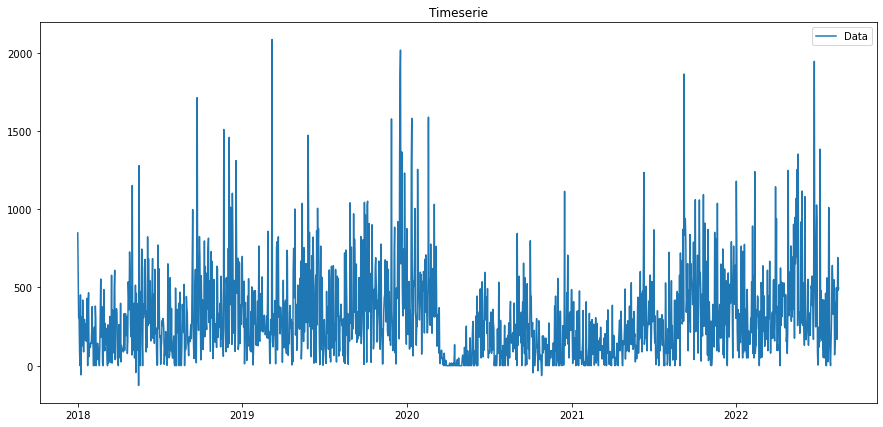

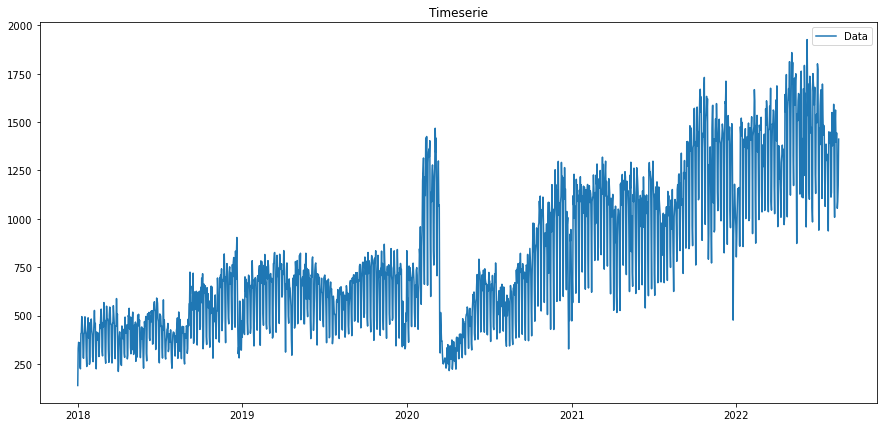

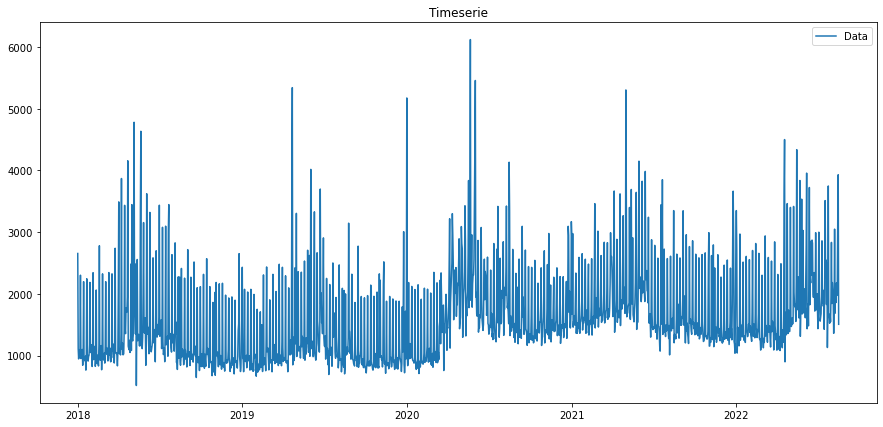

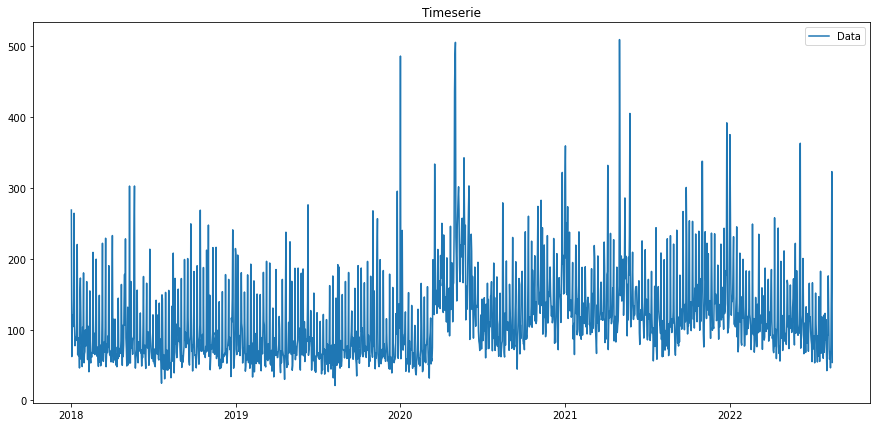

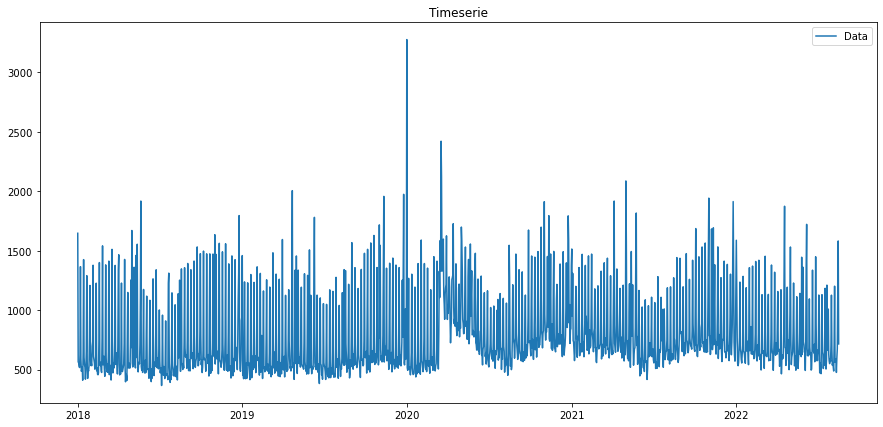

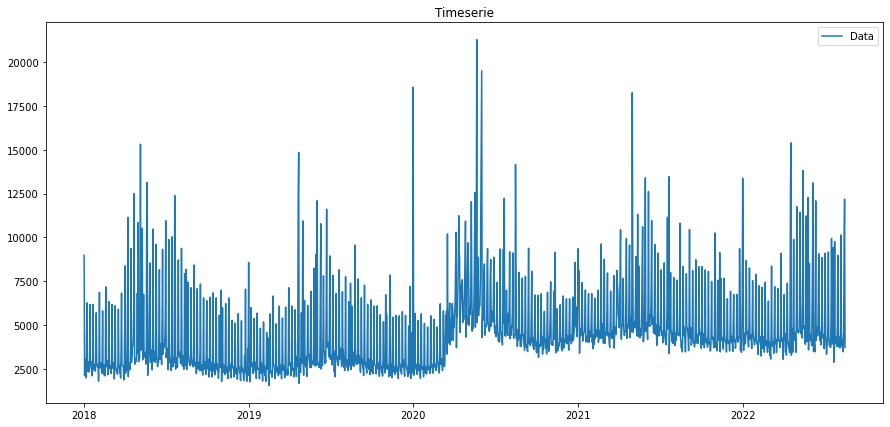

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:28: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series(data = [], index = [])


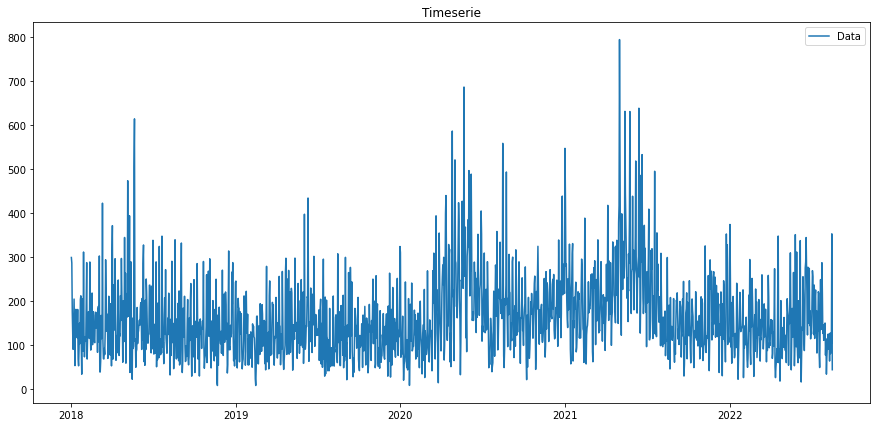

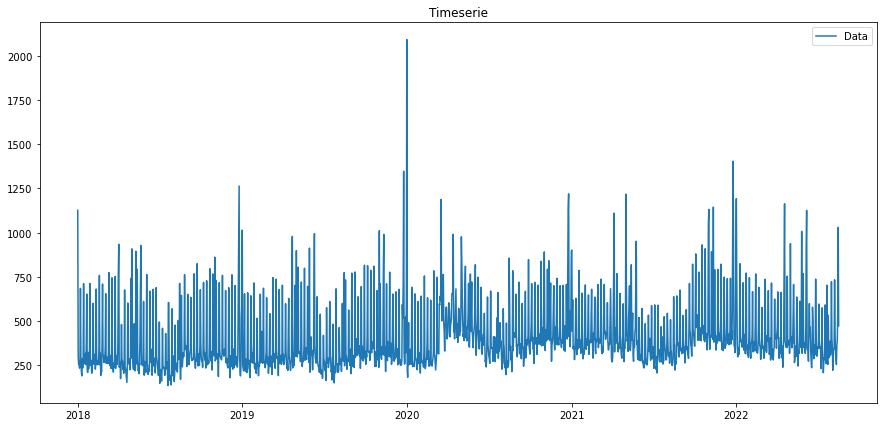

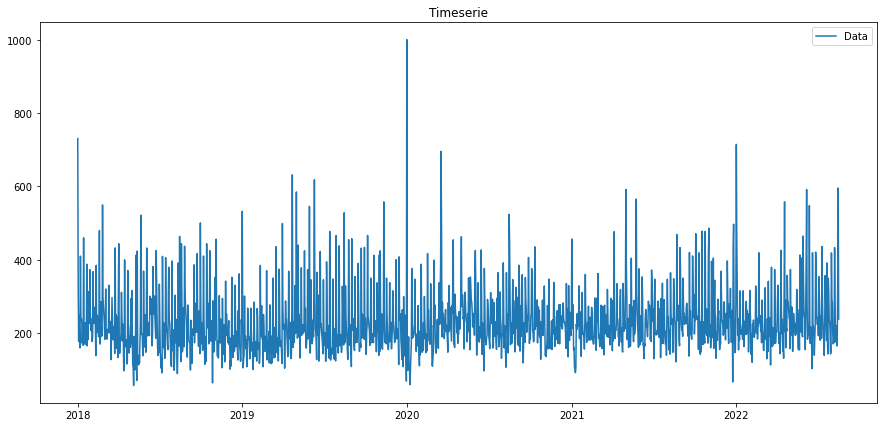

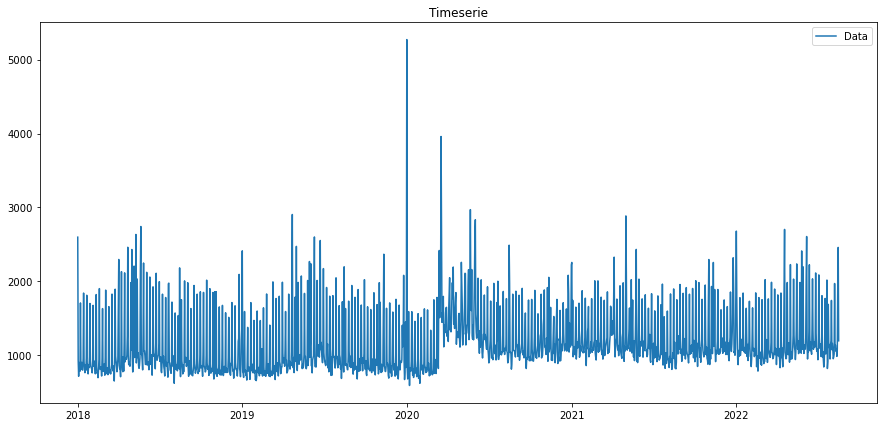

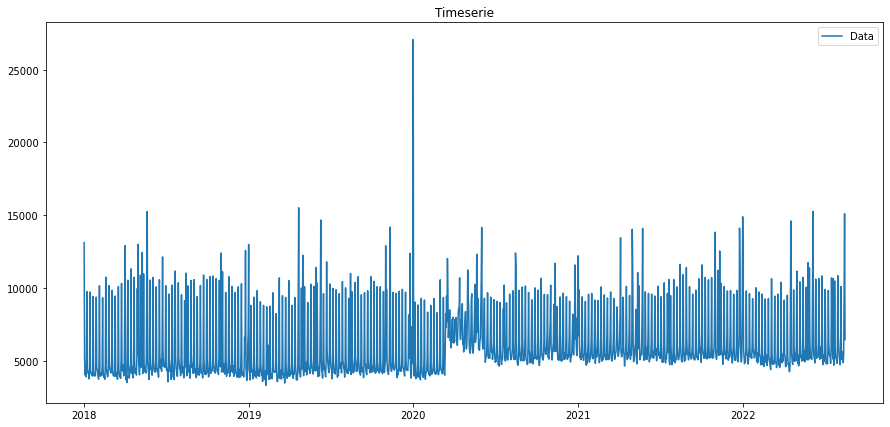

...

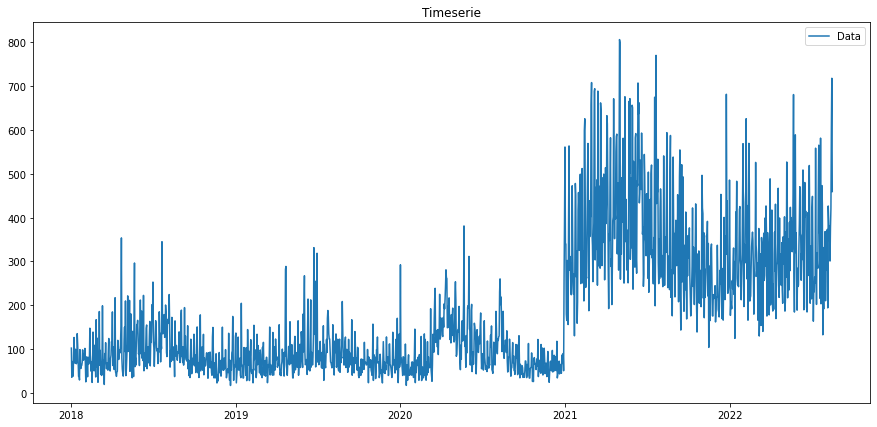

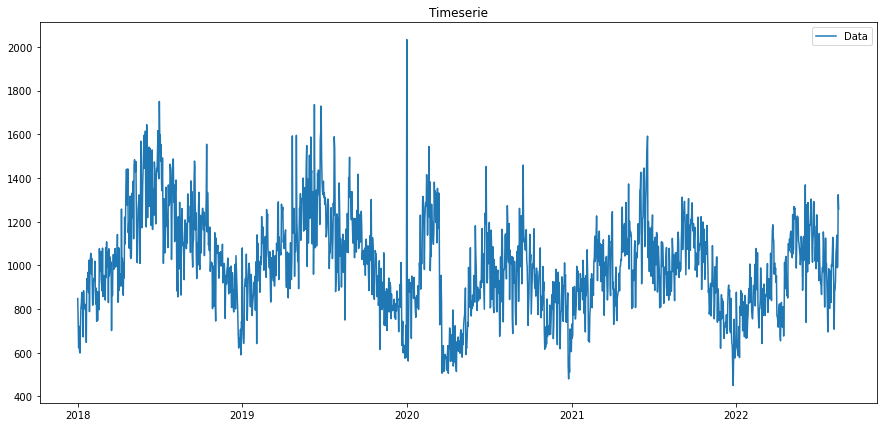

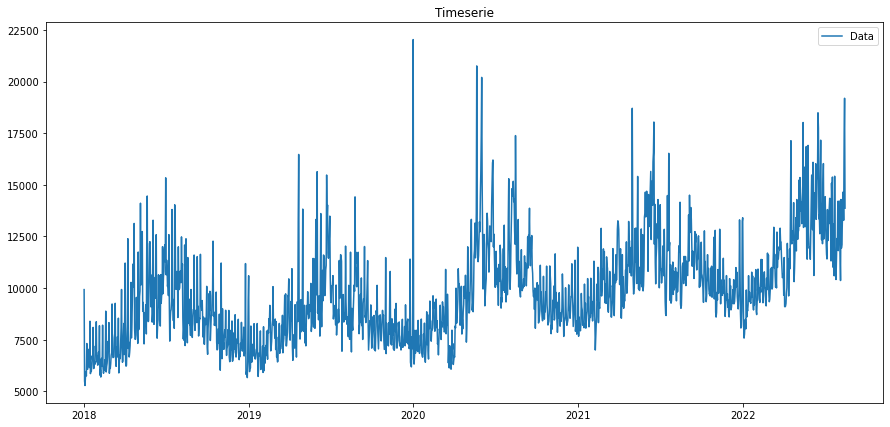

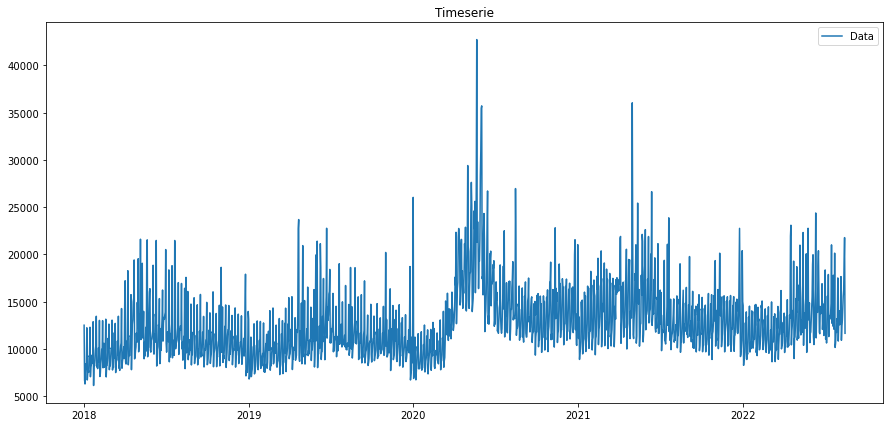

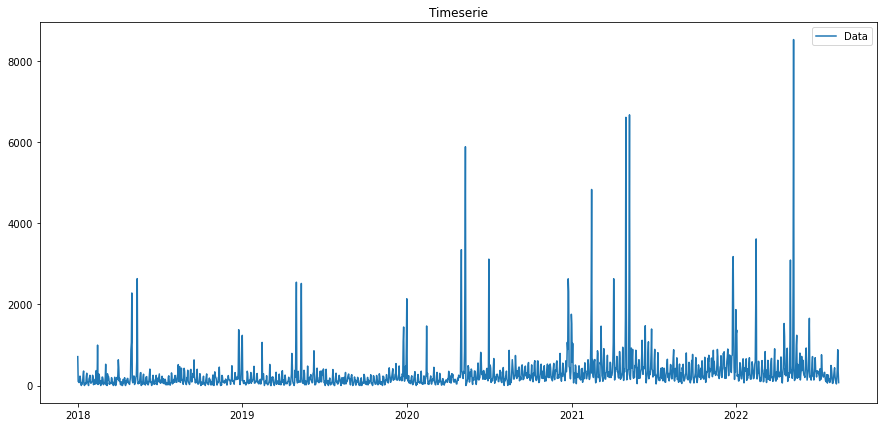

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


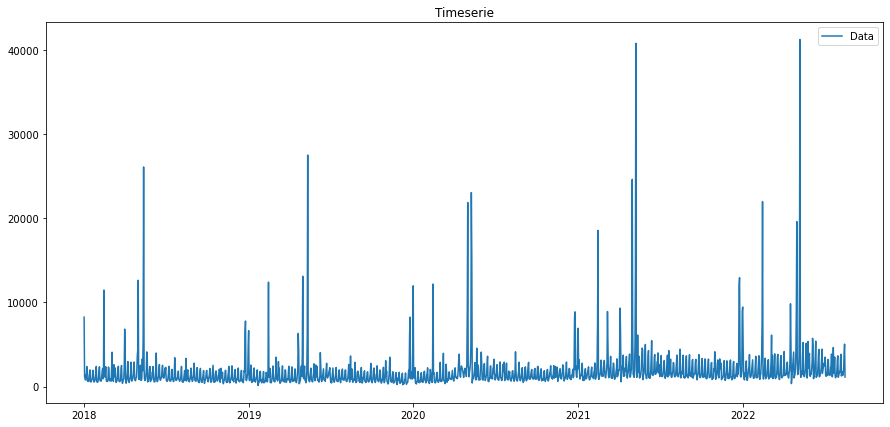

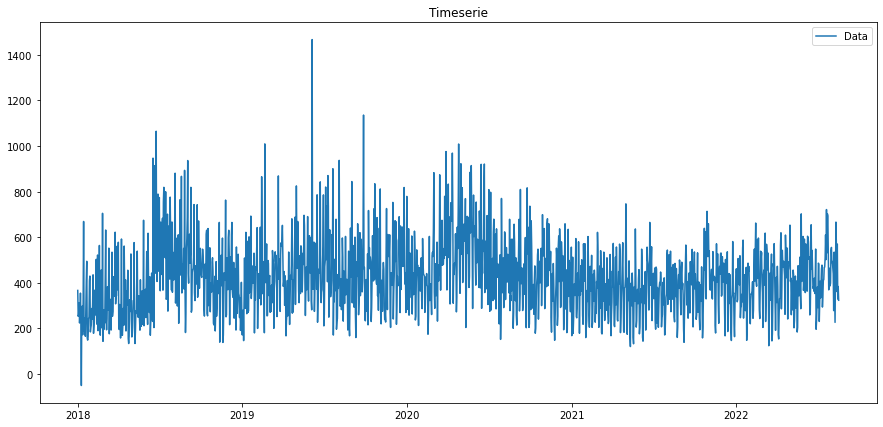

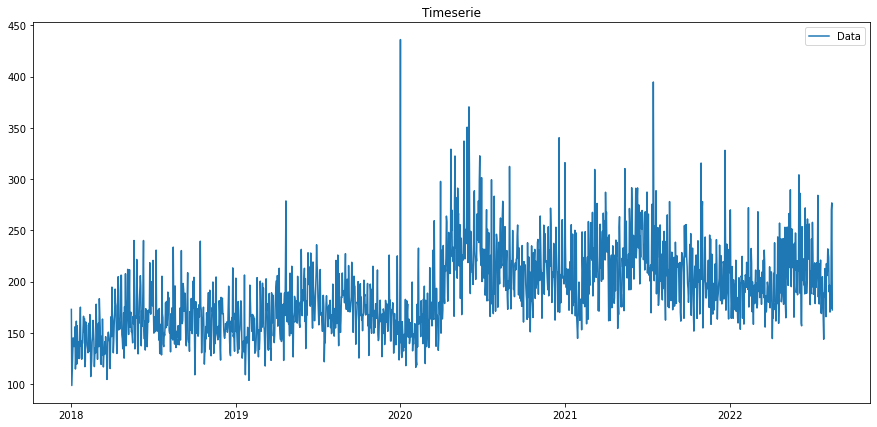

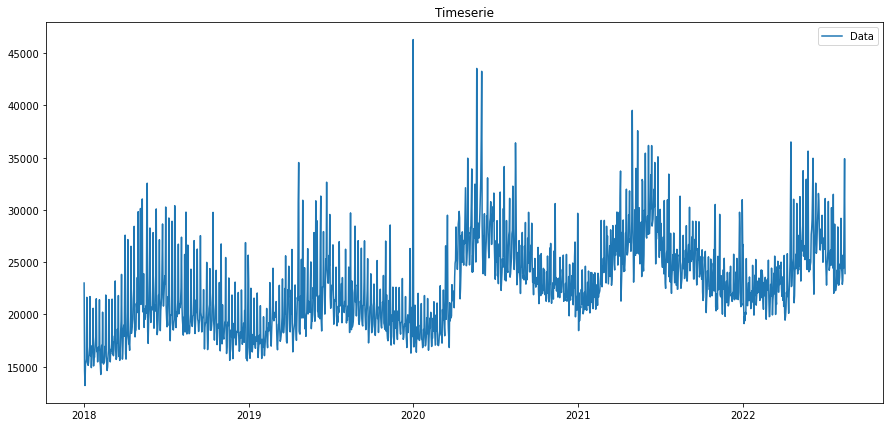

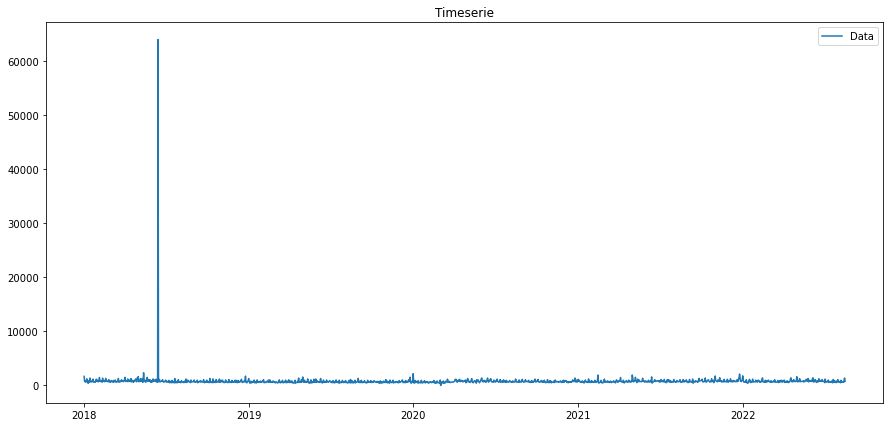

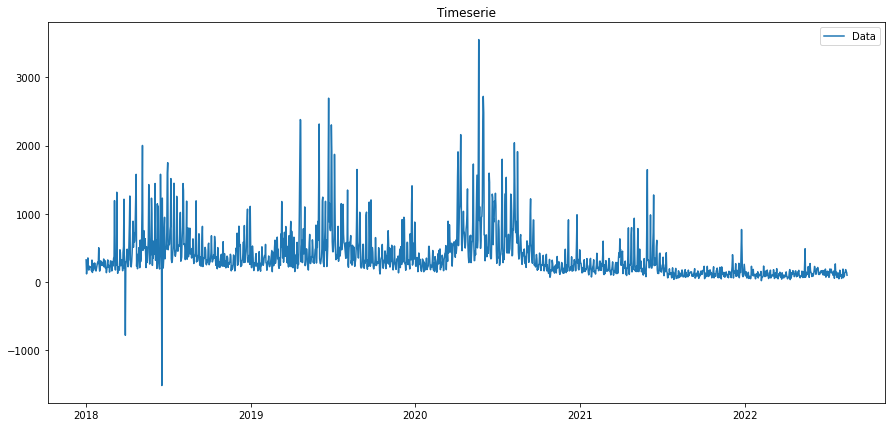

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:28: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series(data = [], index = [])


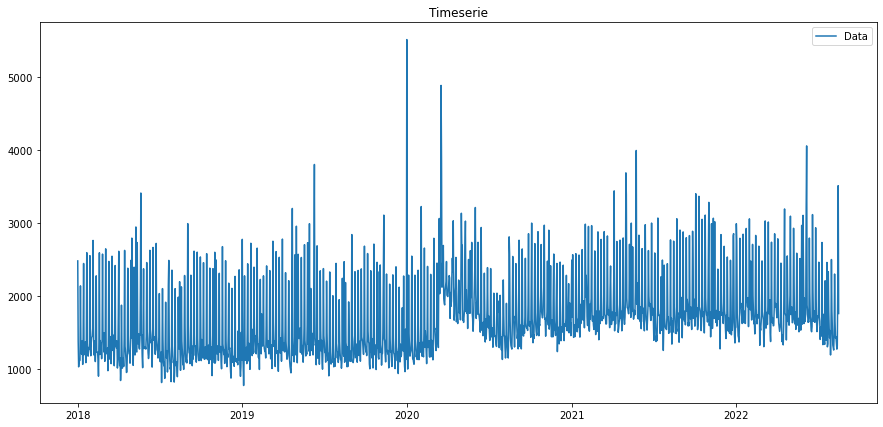

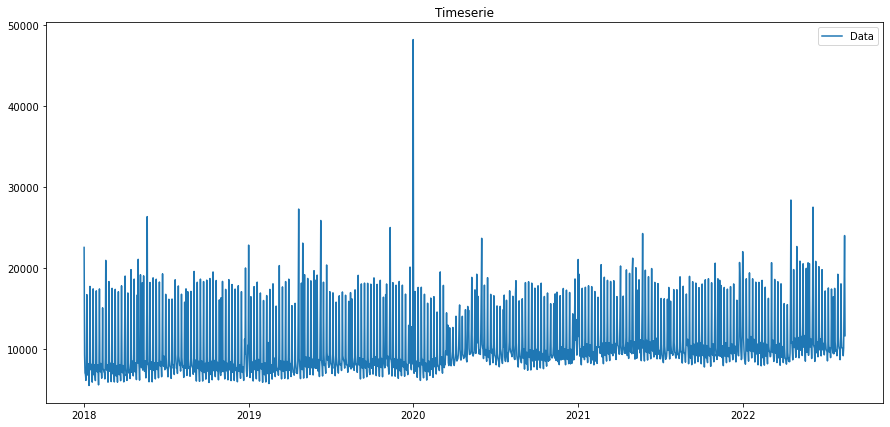

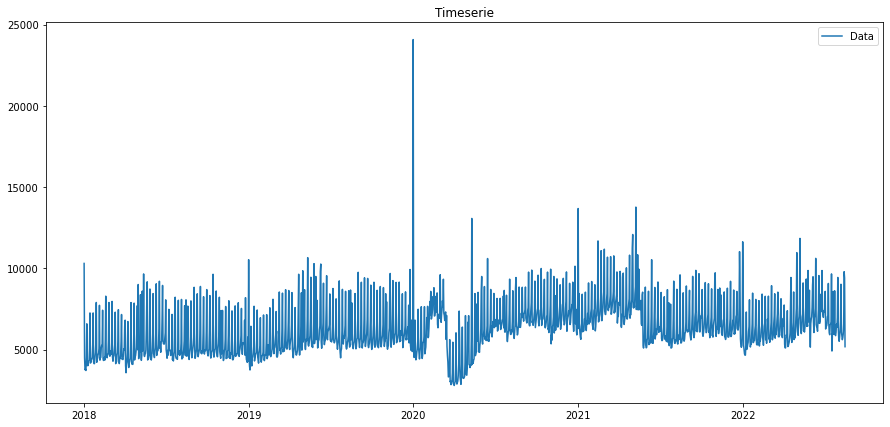

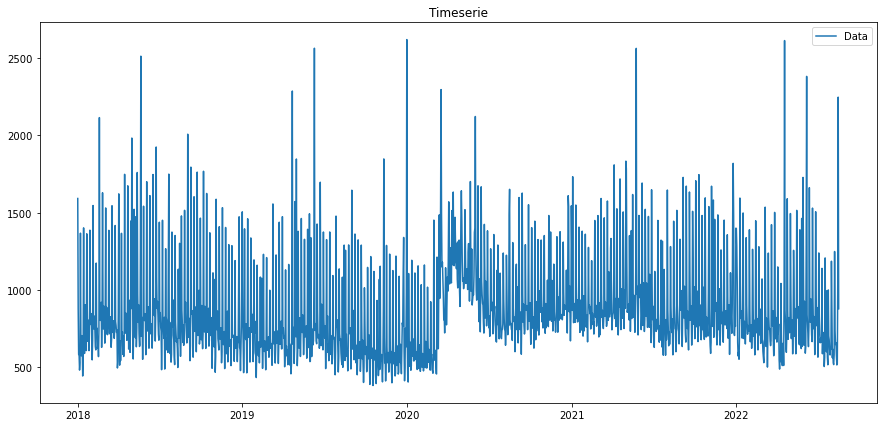

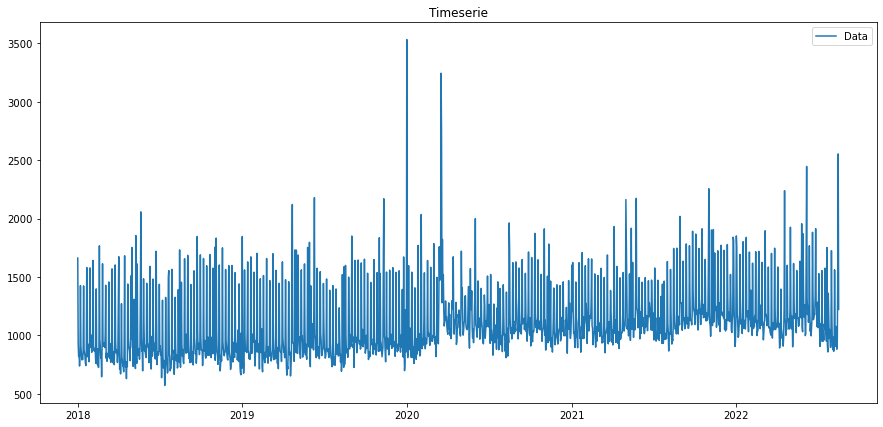

...

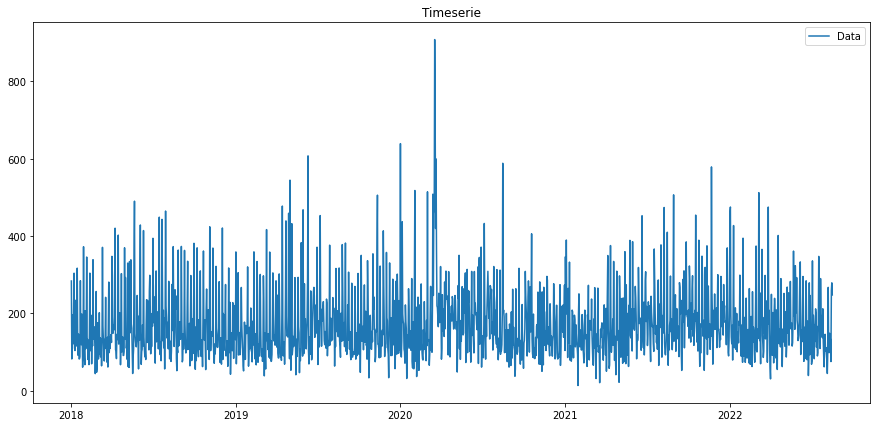

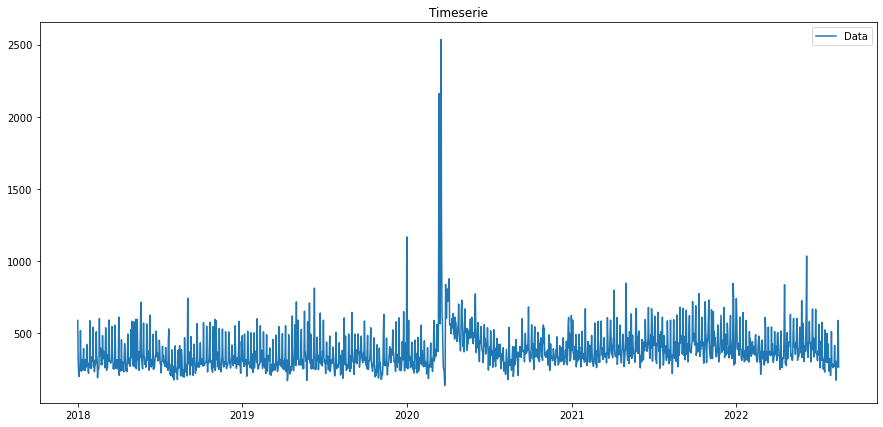

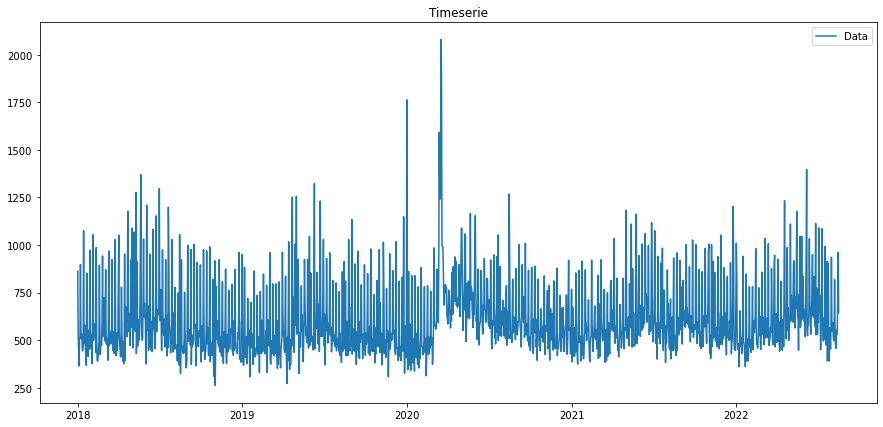

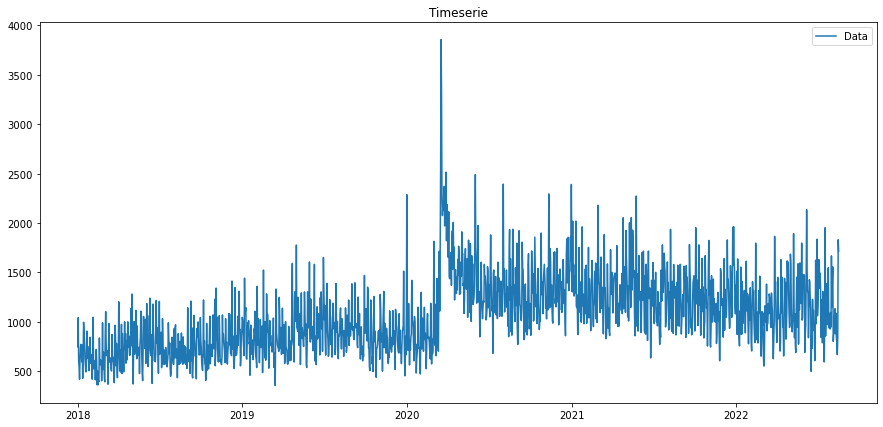

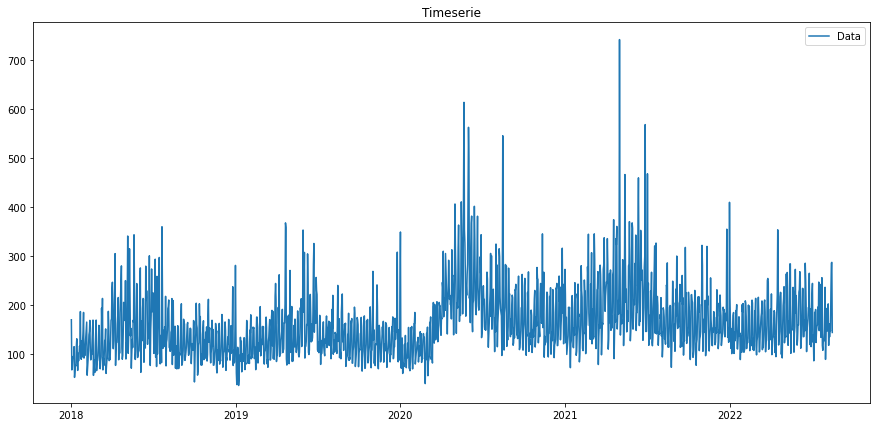

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:28: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series(data = [], index = [])


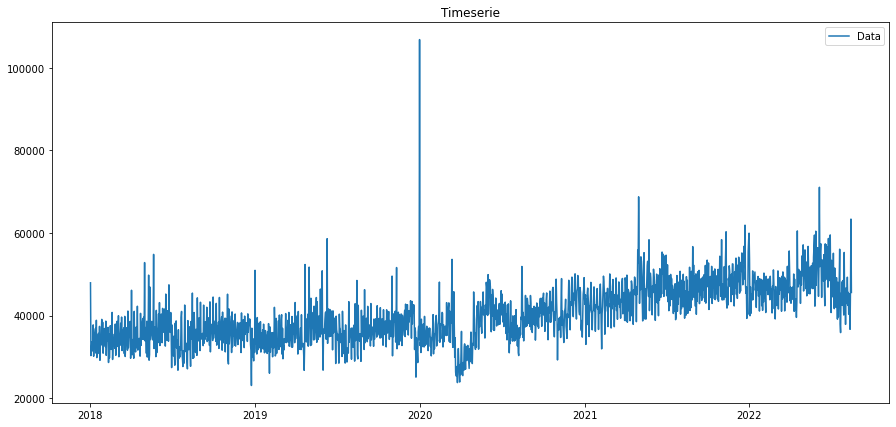

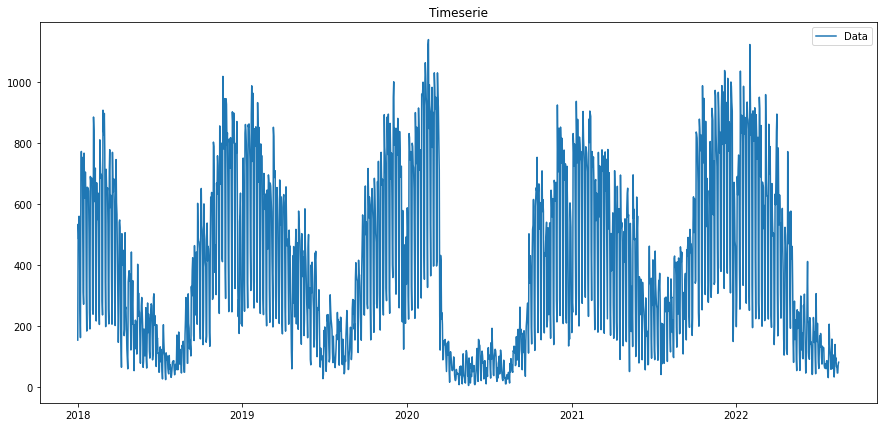

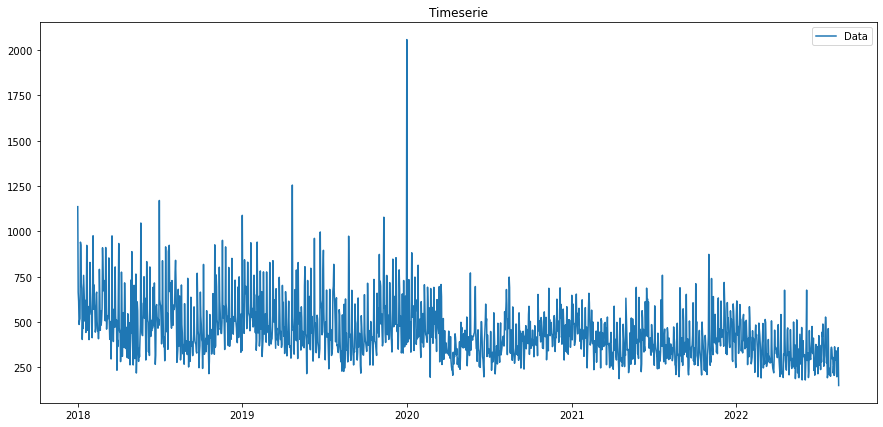

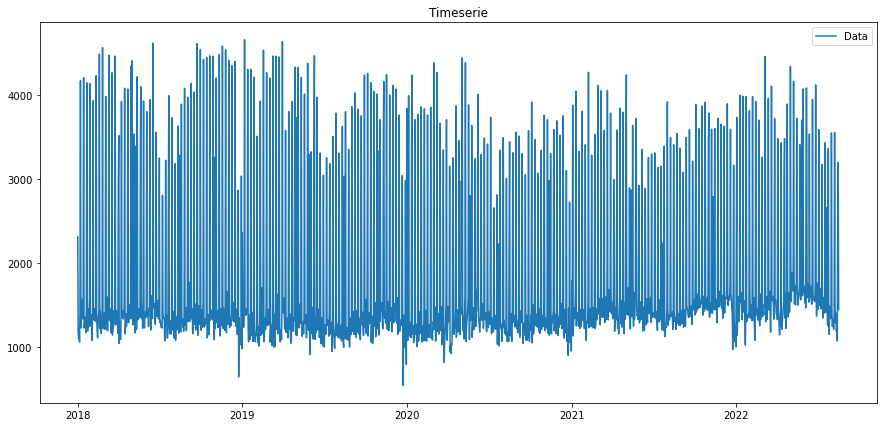

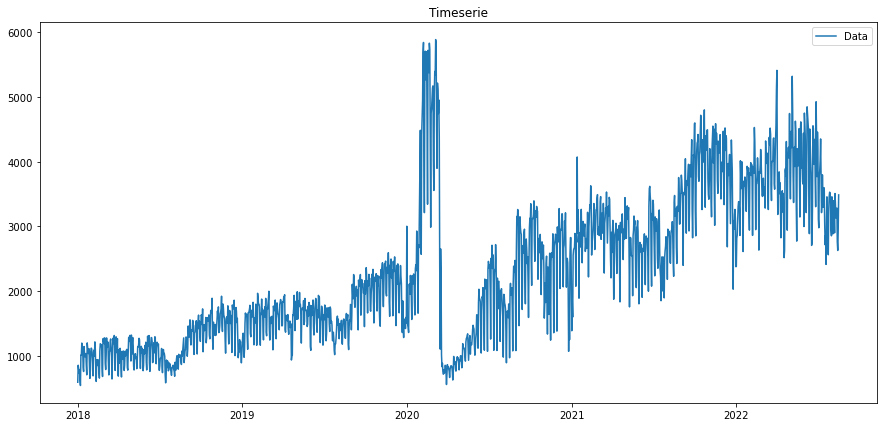

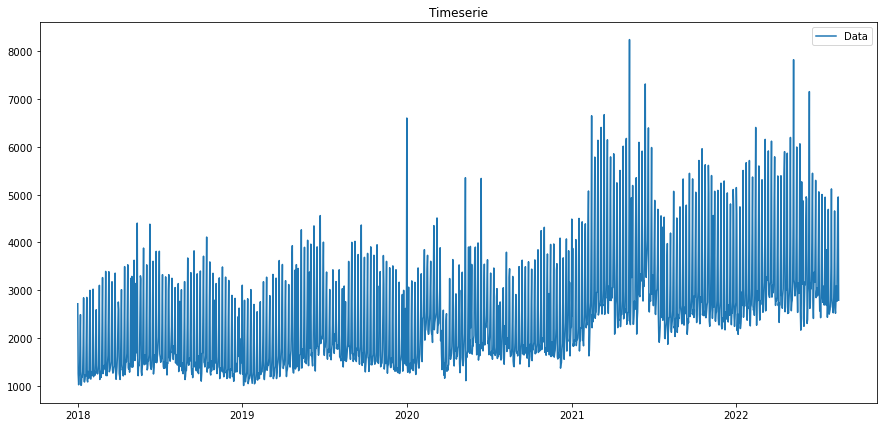

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


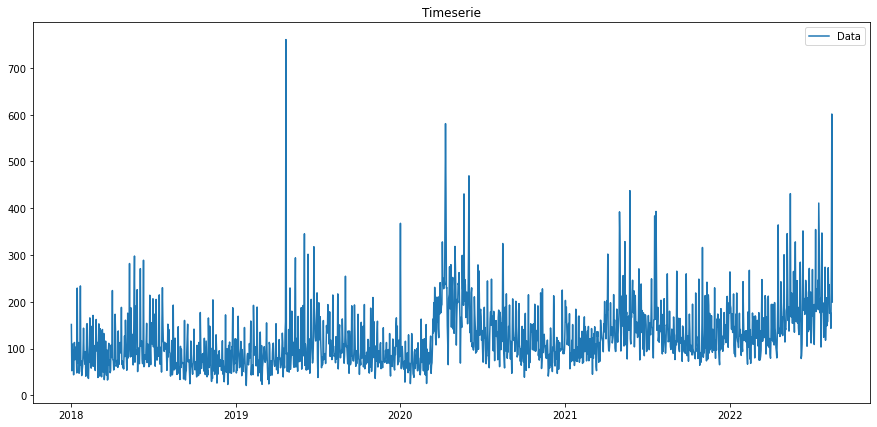

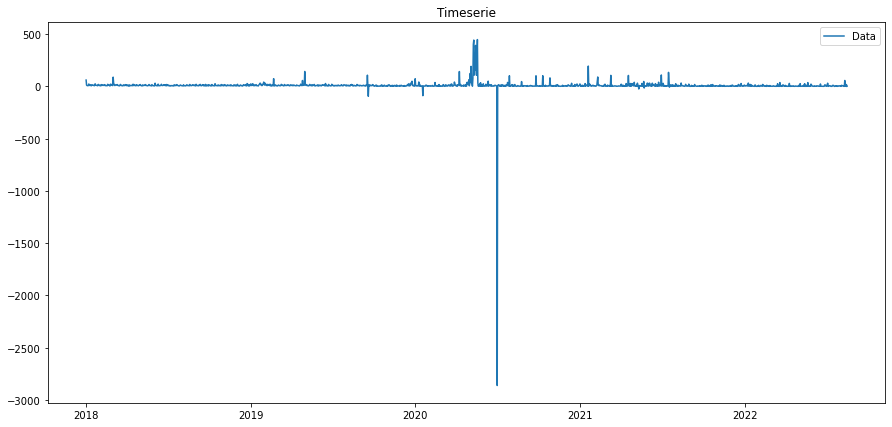

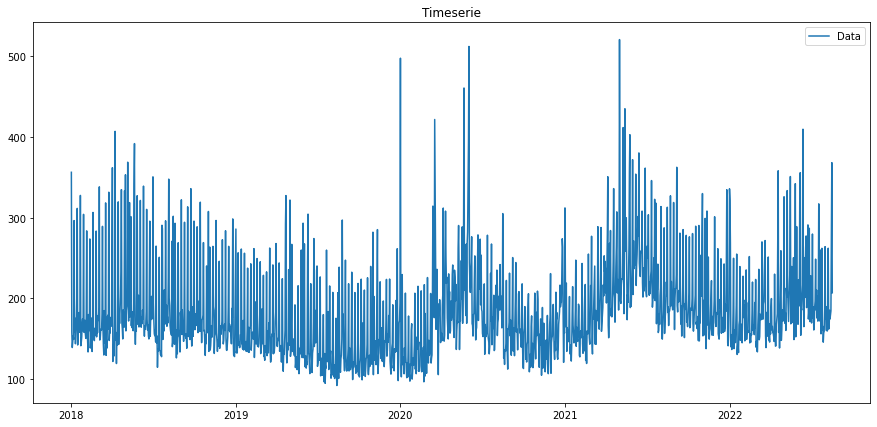

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


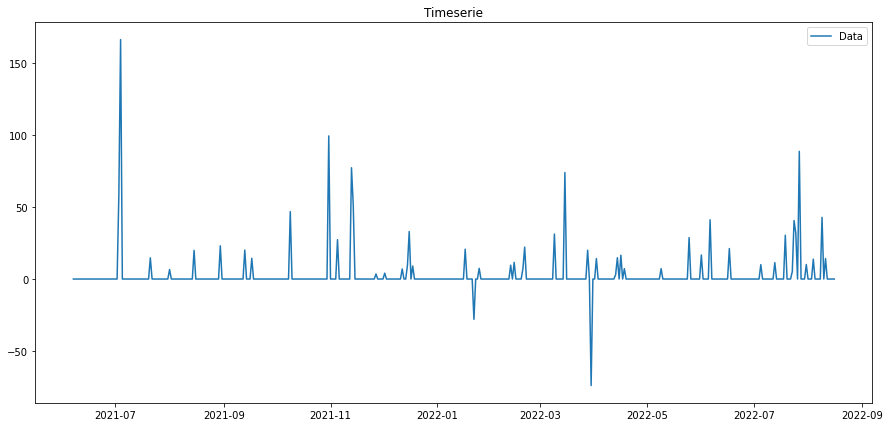

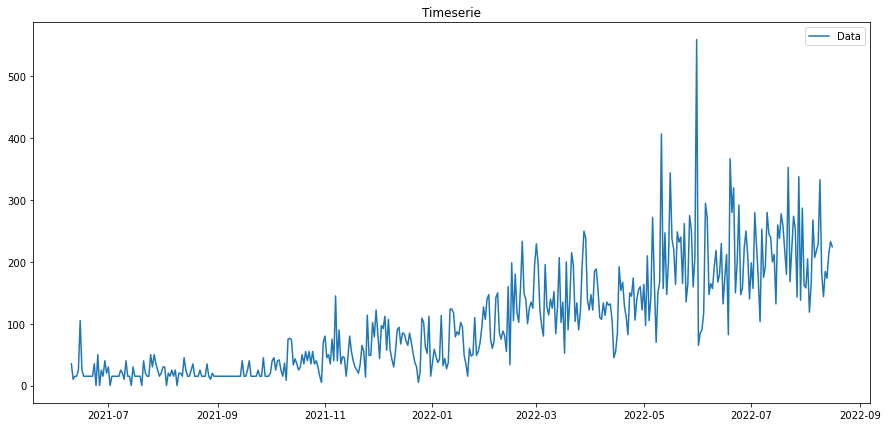

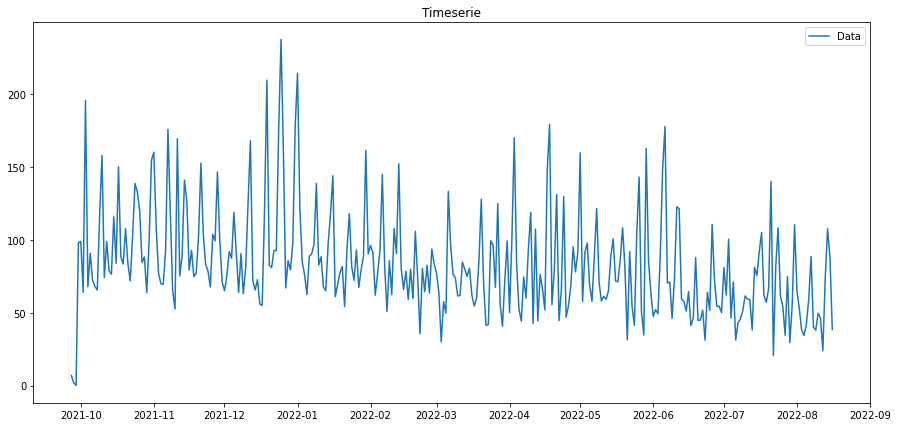

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


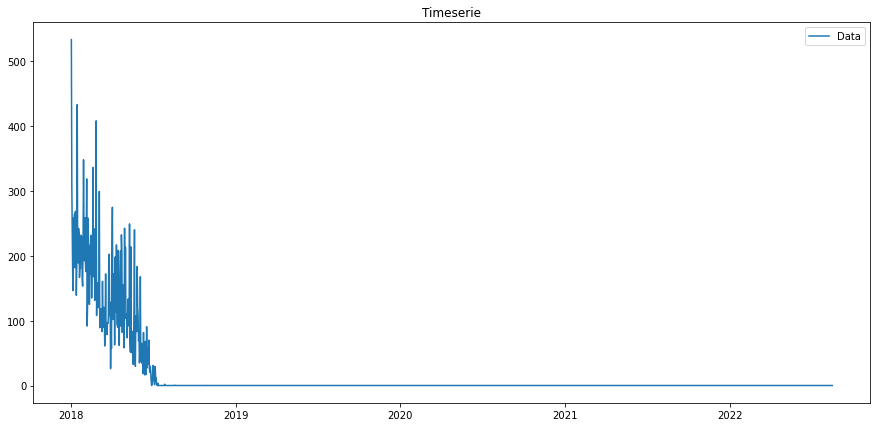

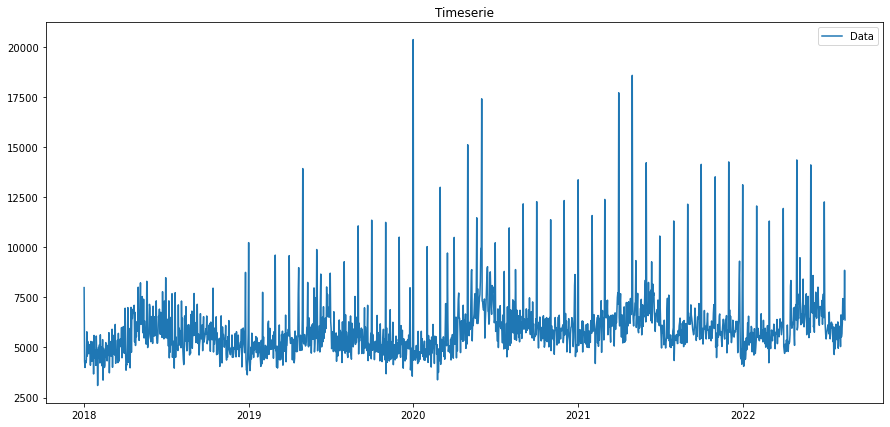

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


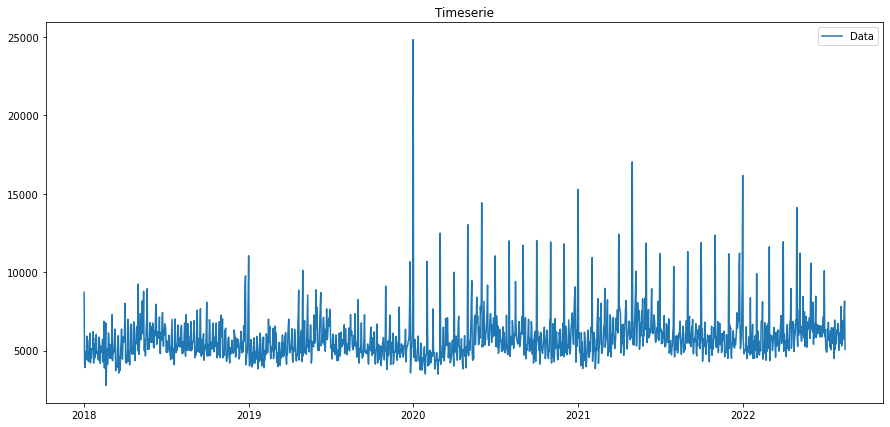

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


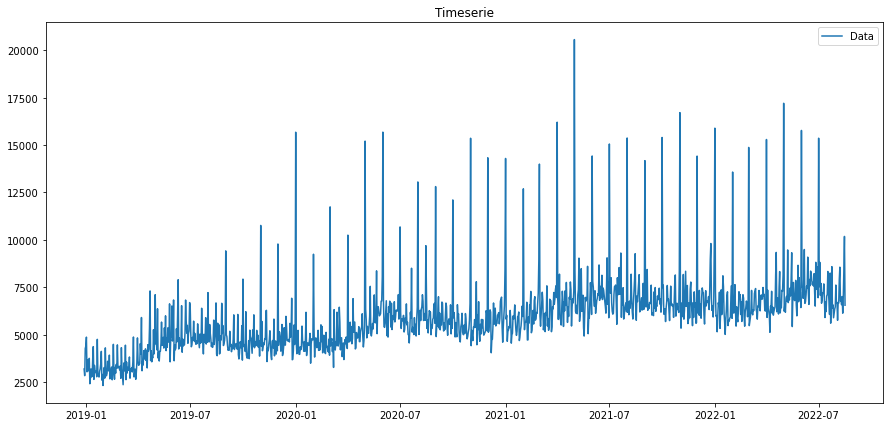

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
 

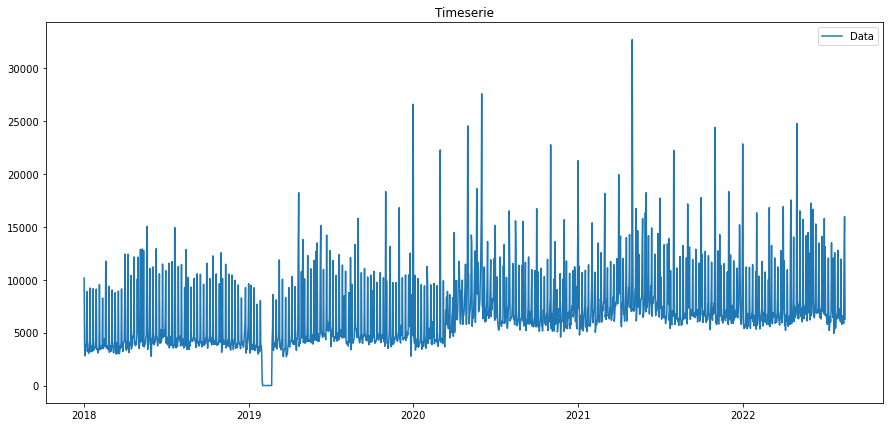

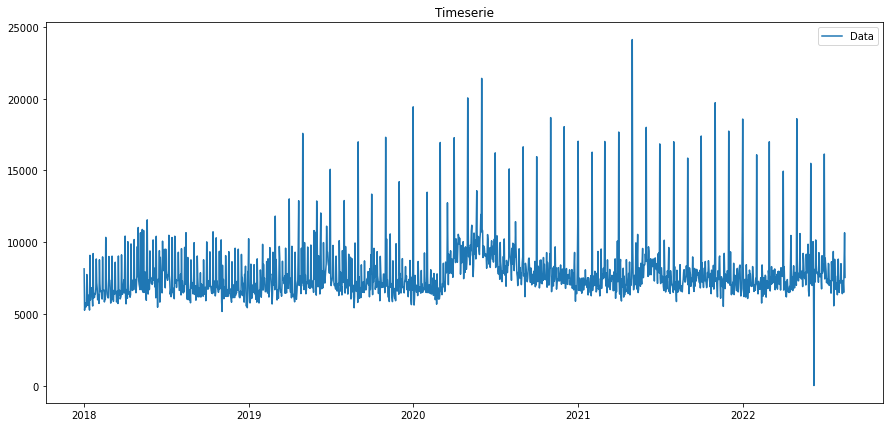

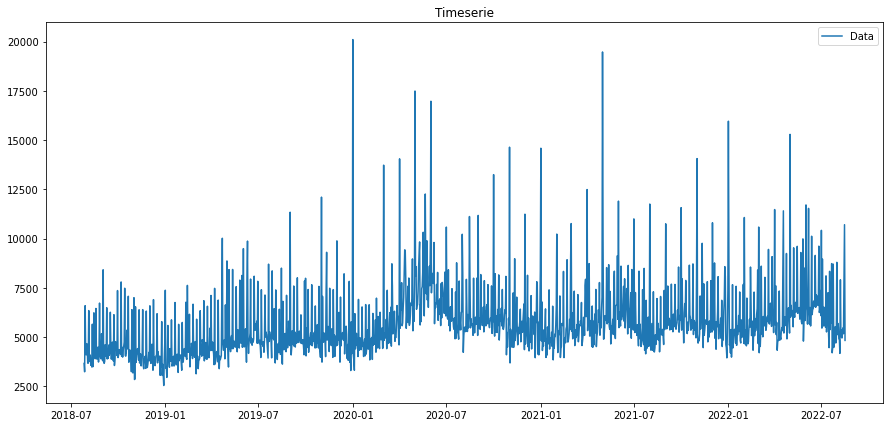

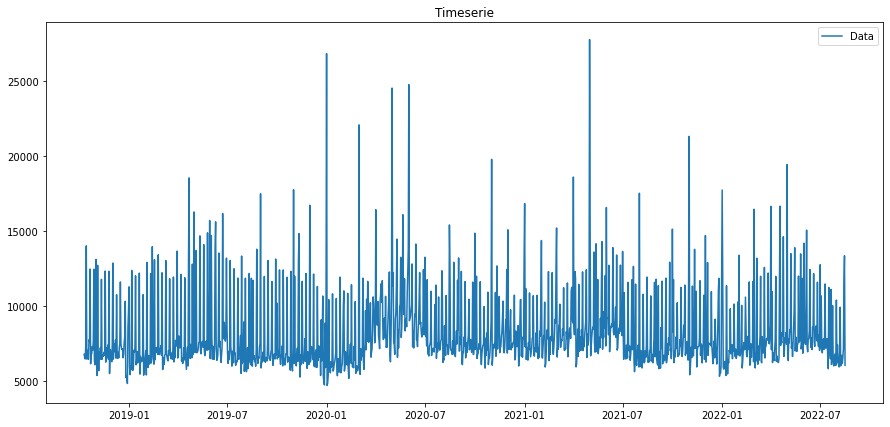

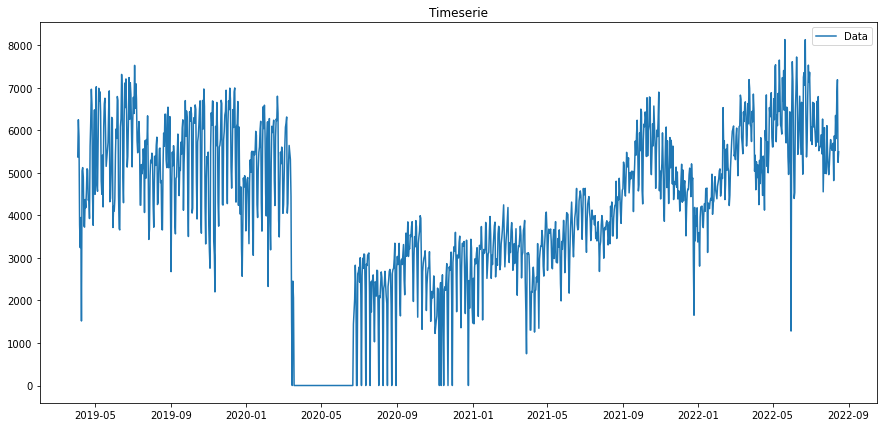

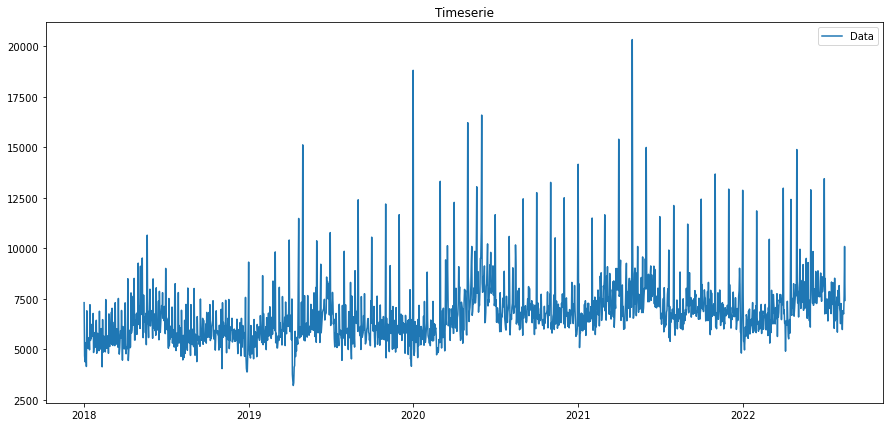

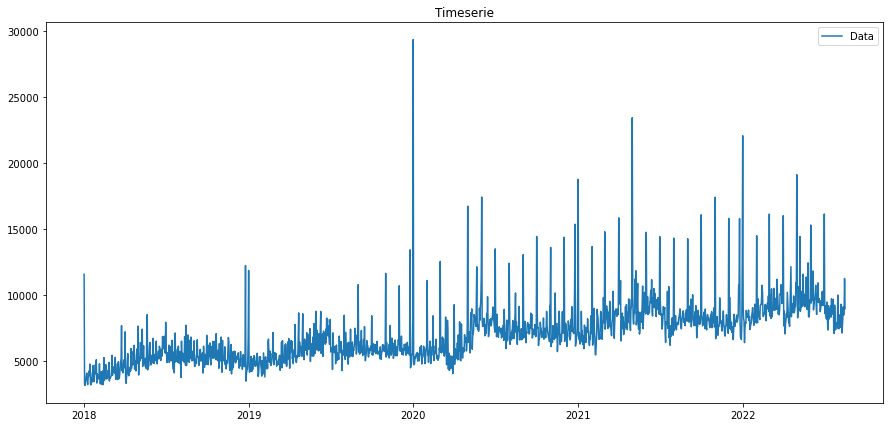

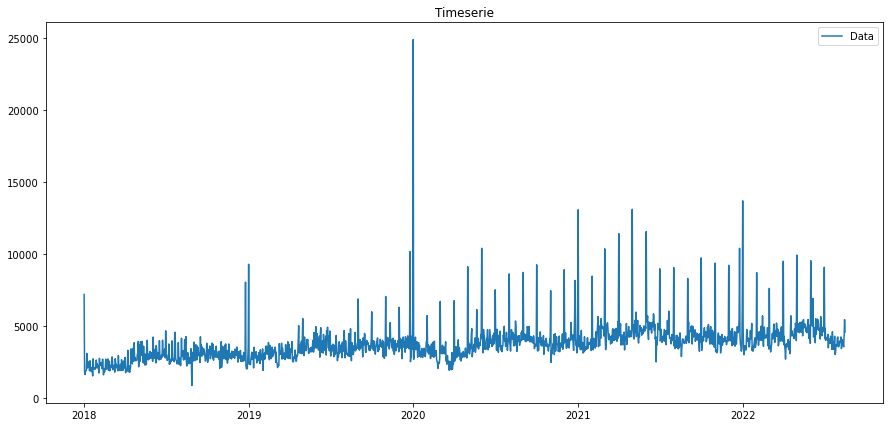

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


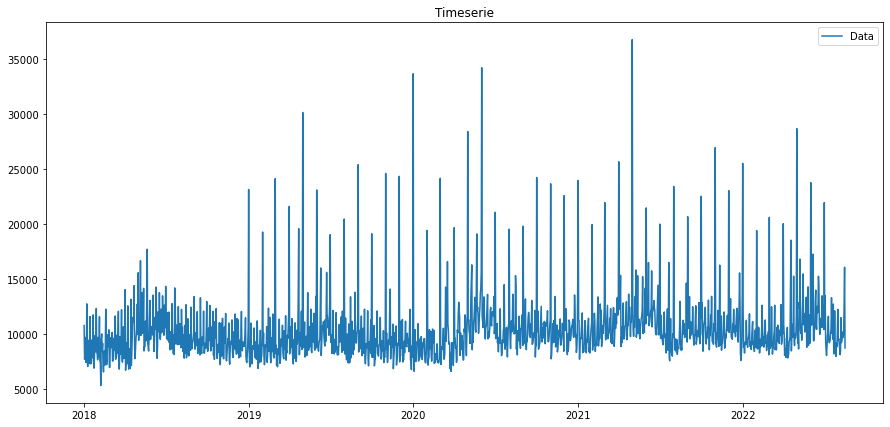

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


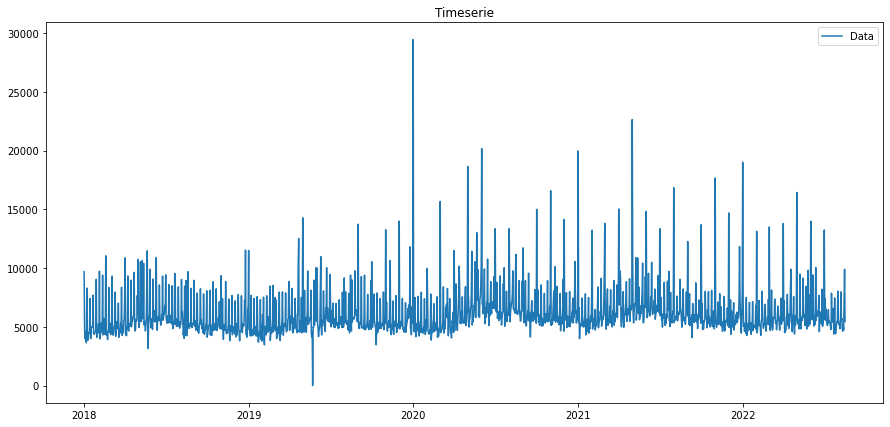

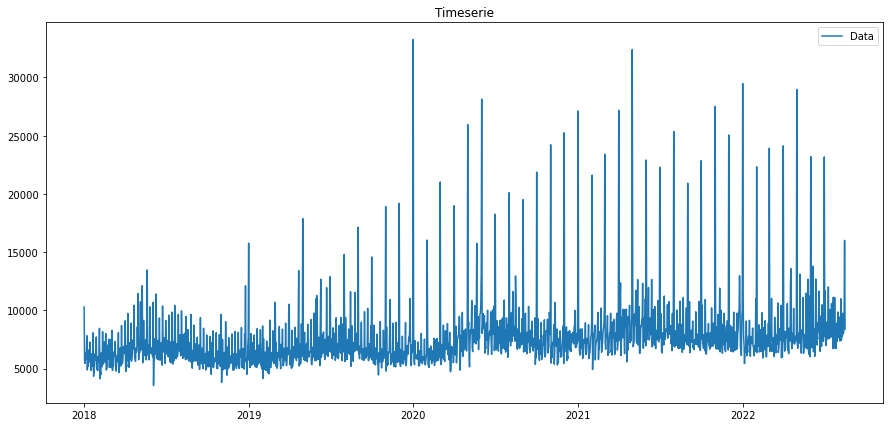

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


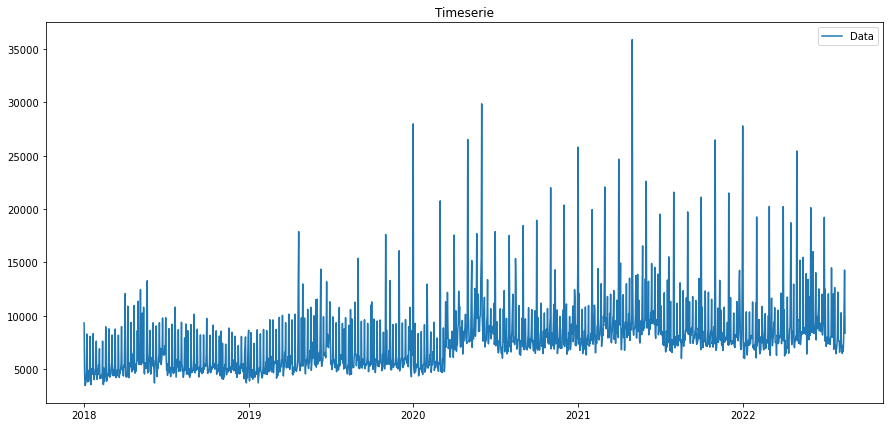

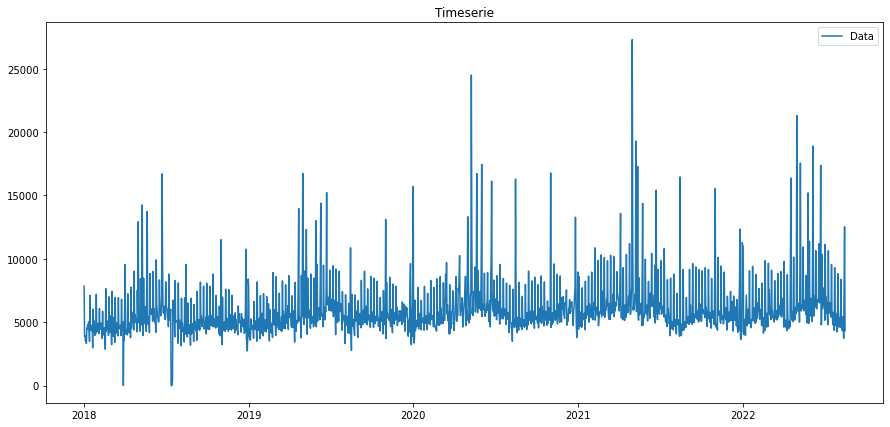

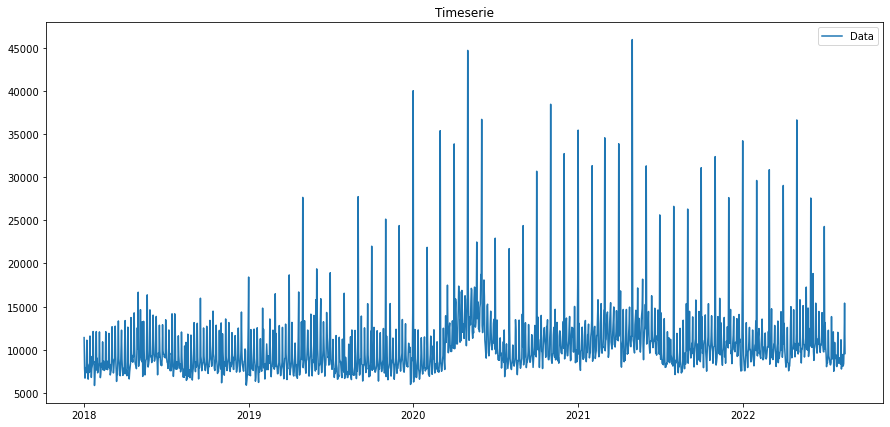

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


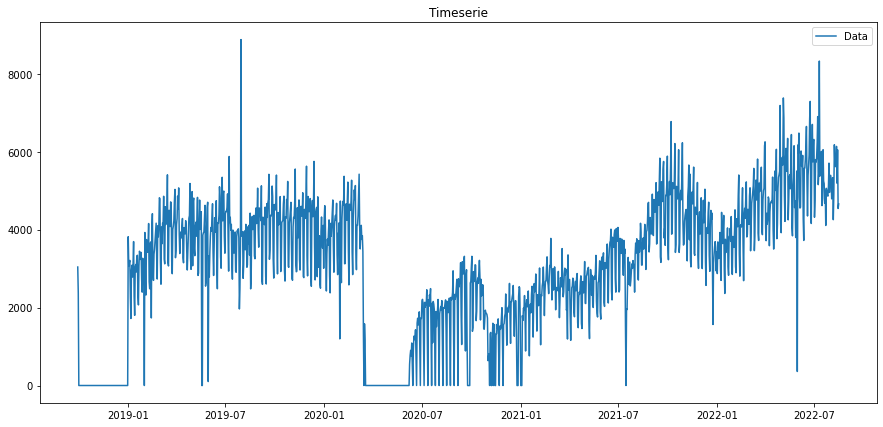

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


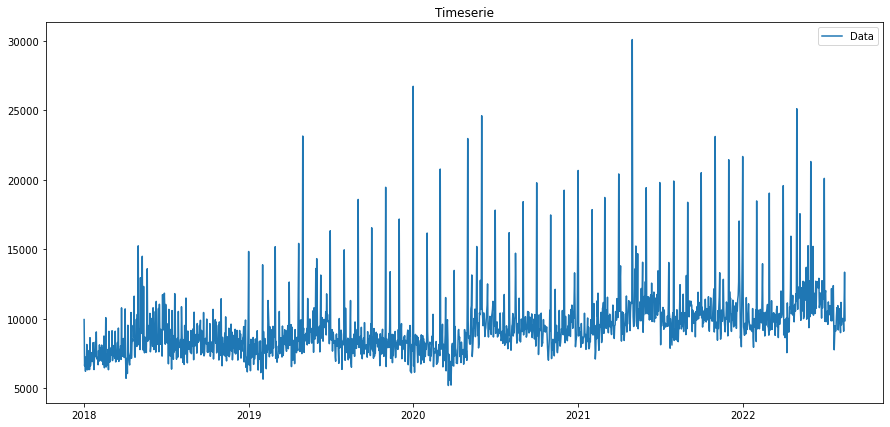

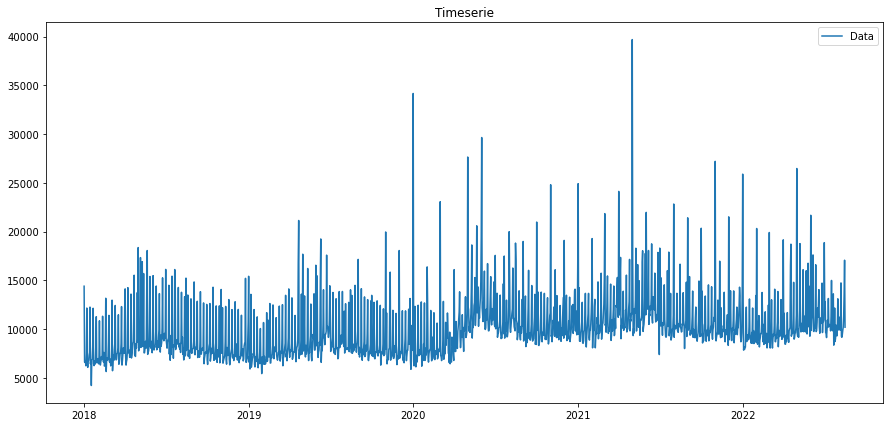

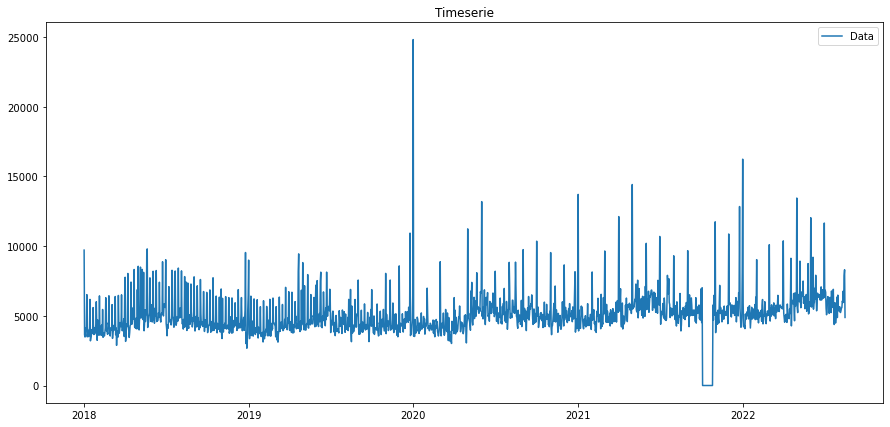

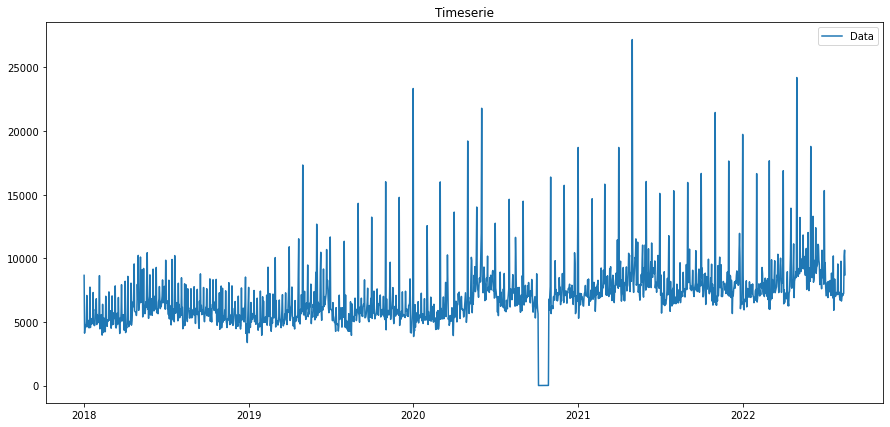

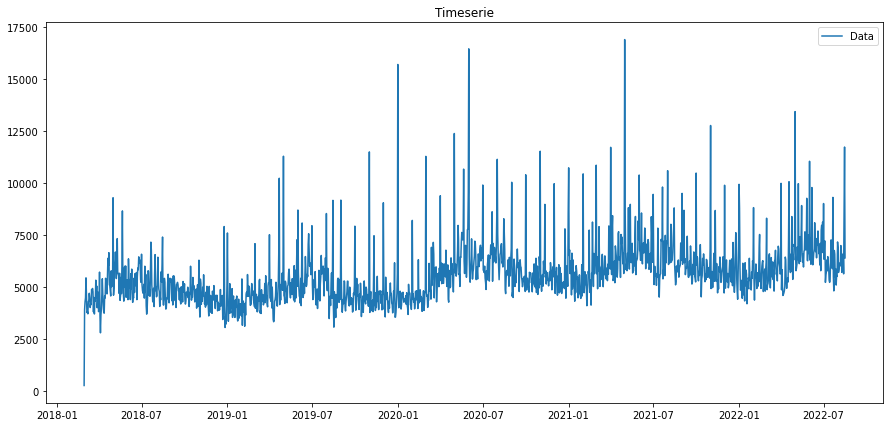

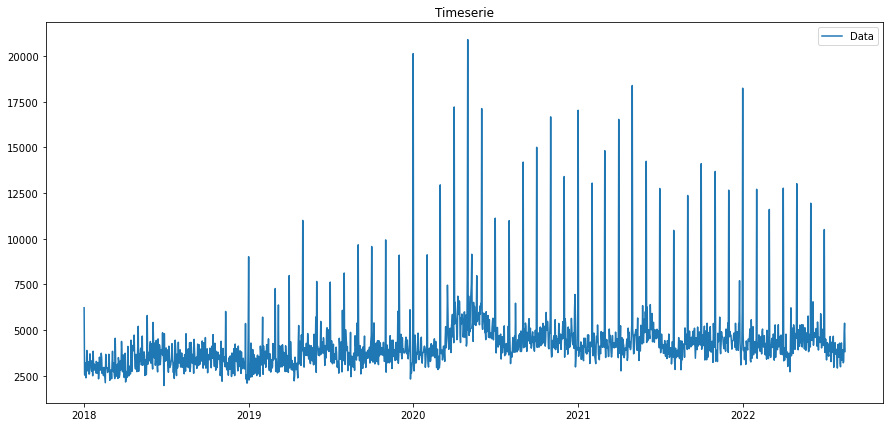

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


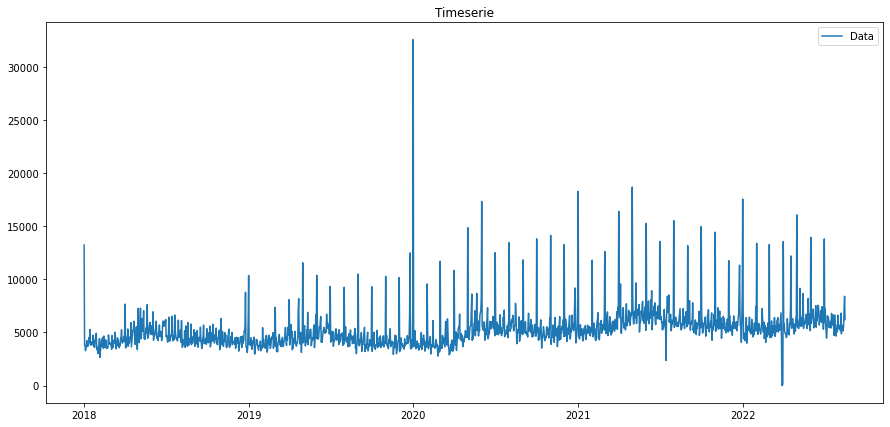

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


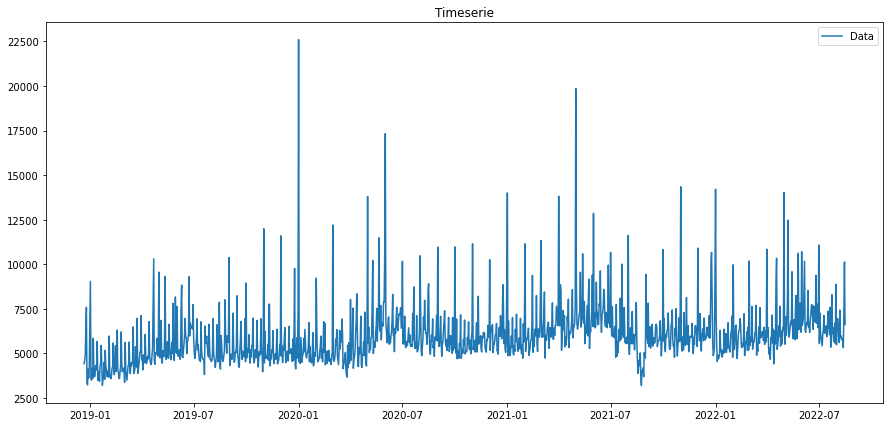

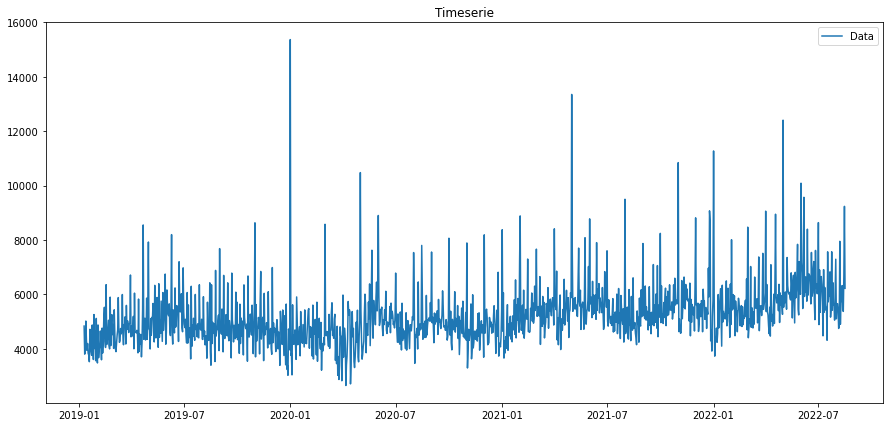

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


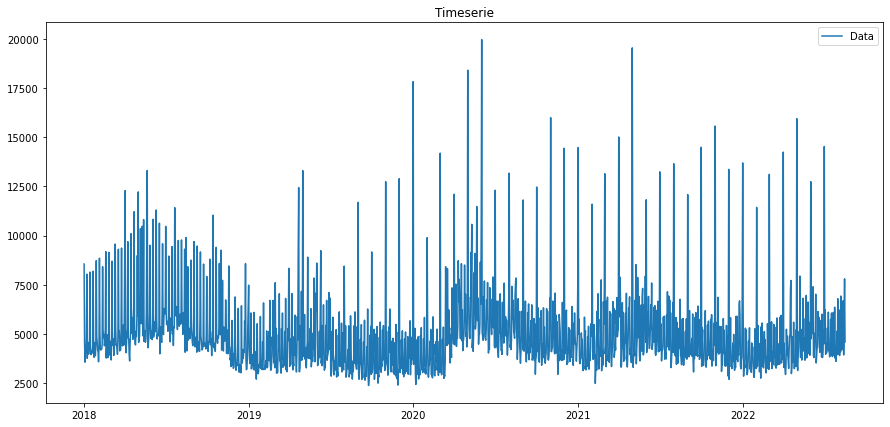

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()
C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


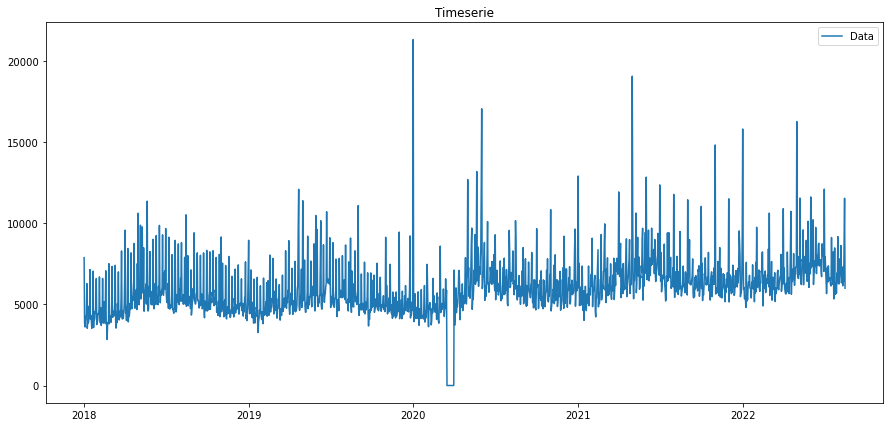

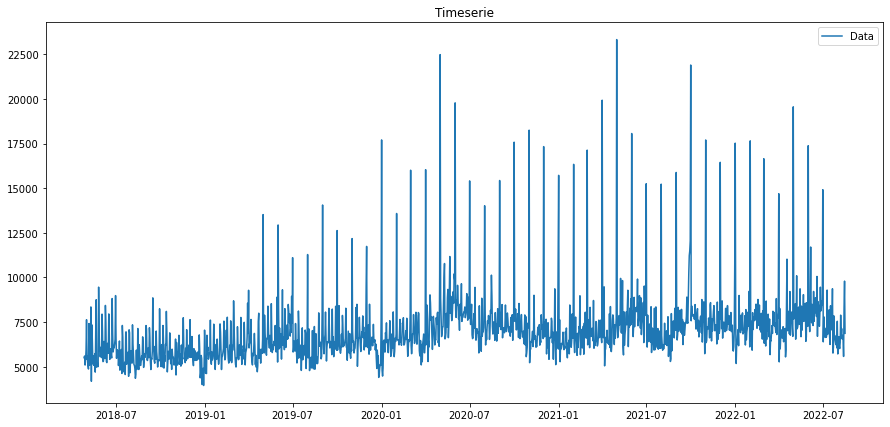

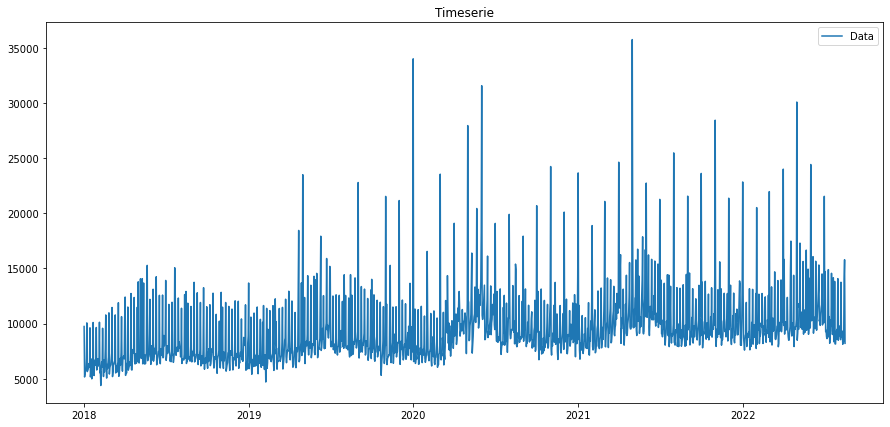

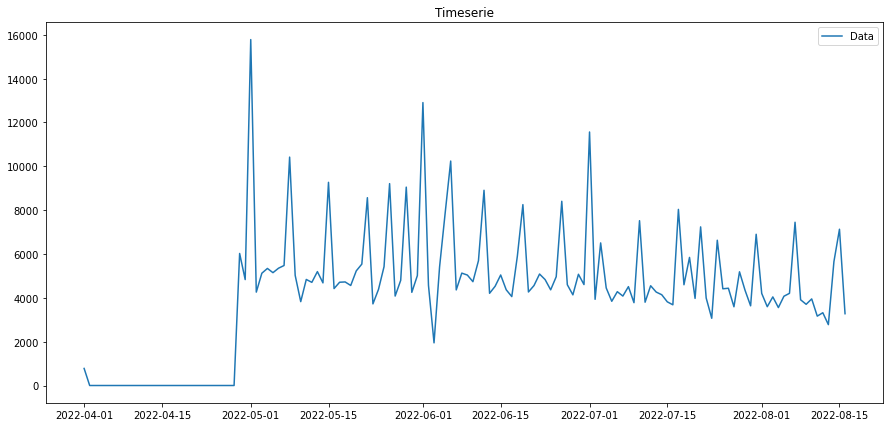

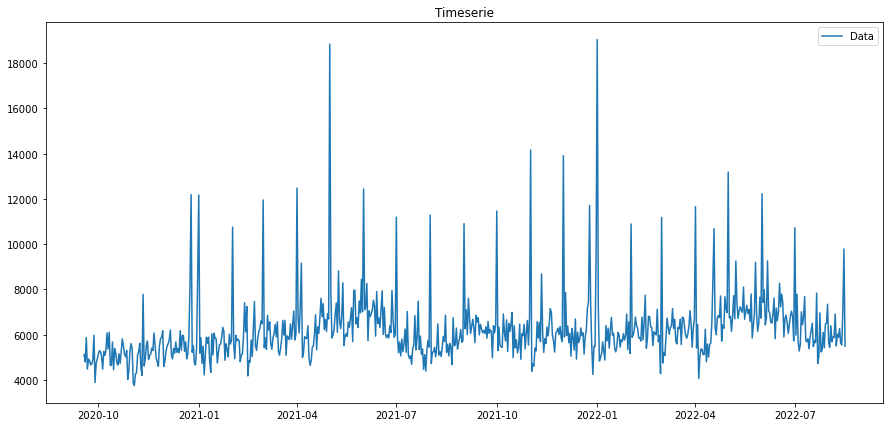

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


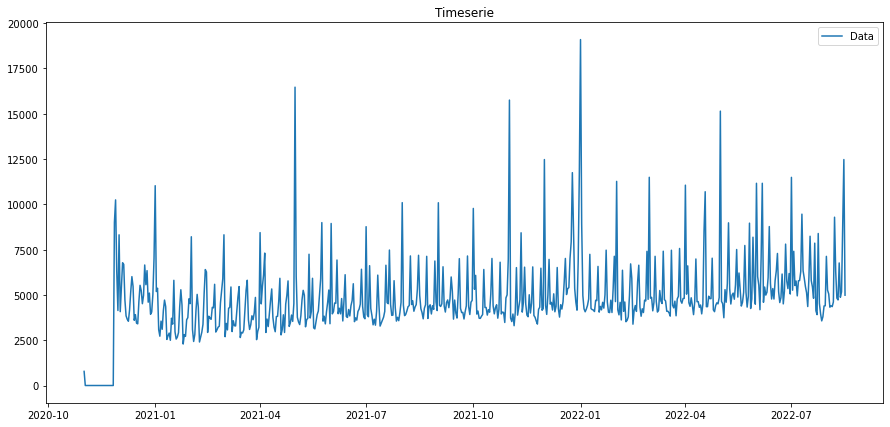

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:62: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series()


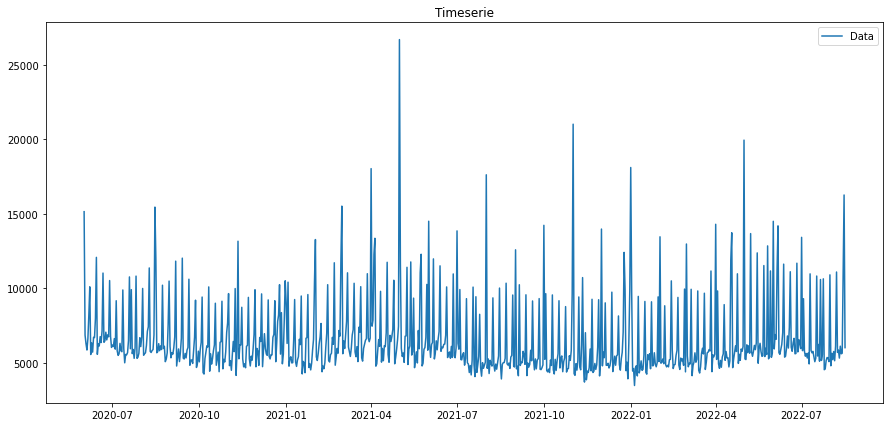

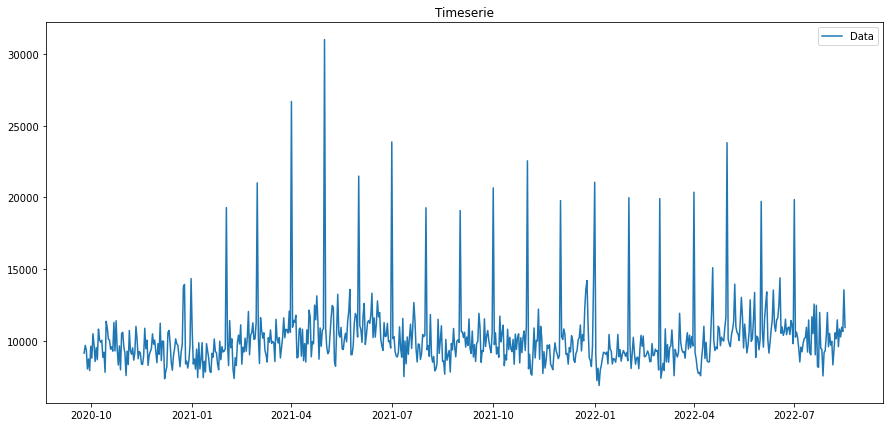

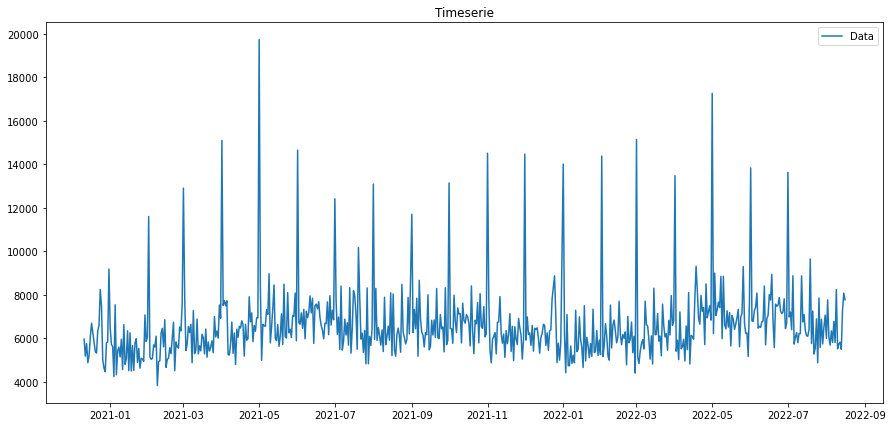

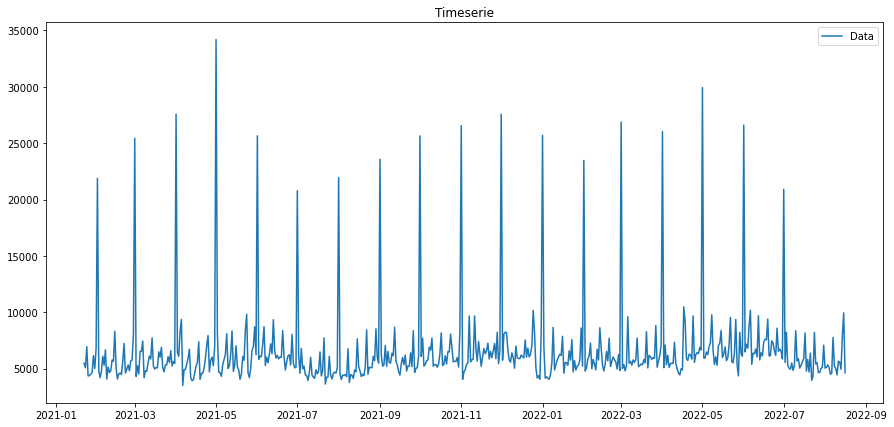

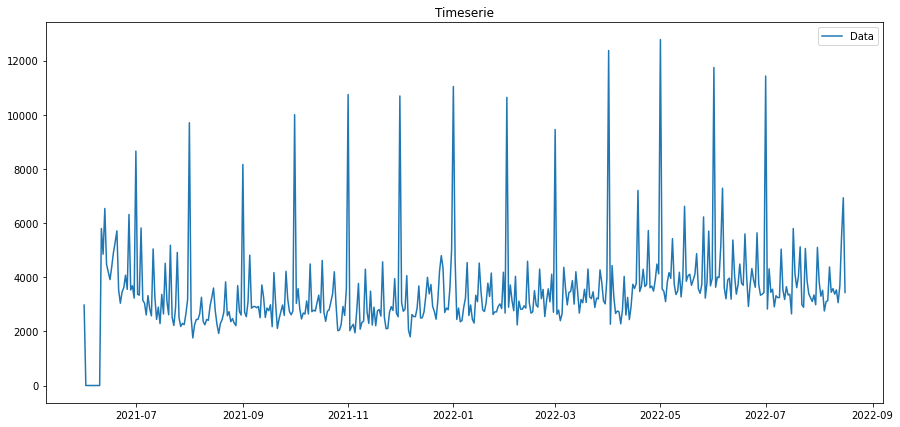

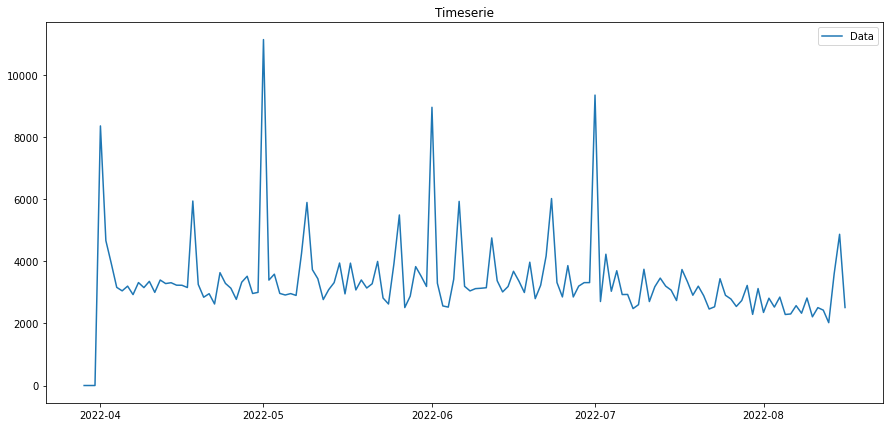

dict_keys([1, 2, 9, 15, 18, 21, 33, 34, 37, 38, 41, 51, 60, 74, 75, 83, 84, 95, 98, 105, 108, 120, 125, 129, 133, 147, 150, 152, 154, 162, 167, 168, 177, 188, 196, 211, 215, 219, 223, 224, 228, 236, 267, 268, 269, 270, 271, 272, 273, 277, 278, 279, 285, 287, 294, 299, 300, 301, 305, 313, 319, 325, 334, 339, 343, 344, 348, 362, 365, 369, 373, 383, 388, 389, 402, 431, 432, 435, 437, 438, 446, 447, 448, 452, 490, 492, 493, 495, 498, -1])
dict_keys([2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 59, 60, 61, 62, 64, 65, 68, 69, 73, 76, 77, 78, 81, 82, 84, 89, 93])
Time Taken to load (univers & mag)'s dataframes & timeseries: ~2721secondes


In [25]:
for k in all_univ_df.keys():
    all_univ_df[k] = pd.DataFrame(data = all_univ_df[k], columns = [COL_TEMPS, COL_RECETTE])
    all_univ_ts[k] = get_timeseries(all_univ_df[k], COL_TEMPS, COL_RECETTE, show_plot=True)
    
for k in all_mag_df.keys():
    all_mag_df[k] = pd.DataFrame(data = all_mag_df[k], columns = [COL_TEMPS, COL_RECETTE])
    all_mag_ts[k] = get_timeseries(all_mag_df[k], COL_TEMPS, COL_RECETTE, show_plot=True)

print(all_univ_ts.keys())
print(all_mag_ts .keys())
# environ 5 min 
print("Time Taken to load (univers & mag)'s dataframes & timeseries: ~" + str(int(time() - start)) + "secondes") 

### Sauvegarde des données sous formes de Timeserie

In [82]:
today_date = date.today() + timedelta(days = -1)
conn = engine_INSERT.connect()

for key, timeseries in all_univ_ts.items():
    if not len(timeseries): 
        continue
    counter = 0
    sql_cmd = '''INSERT INTO [DelitraiteurBI_ResultML].[PML].[UC1_Vrai_Timeseries] VALUES'''
    for day, rec in timeseries.items():
        if counter == 900:
            conn.execute(sql_cmd[:-1]+';')
            sql_cmd = '''INSERT INTO [DelitraiteurBI_ResultML].[PML].[UC1_Vrai_Timeseries] VALUES'''
            counter = 0
        sql_cmd += ''' 
           ('''+str(date_to_key(today_date))+'''
           ,'''+str(key)+'''
           ,NULL
           ,'''+str(date_to_key(day))+'''
           ,'''+str(rec)+'''
           ,'''+str(Univers_Depth)+'''
           ,NULL),'''
        counter += 1
    
    conn.execute(sql_cmd[:-1]+';')
conn.close()

In [84]:
today_date = date.today() + timedelta(days = -1)
conn = engine_INSERT.connect()

for key, timeseries in all_mag_ts.items():
    if not len(timeseries): 
        continue
    counter = 0
    sql_cmd = '''INSERT INTO [DelitraiteurBI_ResultML].[PML].[UC1_Vrai_Timeseries] VALUES'''
    for day, rec in timeseries.items():
        if counter == 900:
            conn.execute(sql_cmd[:-1]+';')
            sql_cmd = '''INSERT INTO [DelitraiteurBI_ResultML].[PML].[UC1_Vrai_Timeseries] VALUES'''
            counter = 0
        sql_cmd += ''' 
           ('''+str(date_to_key(today_date))+'''
           ,NULL
           ,'''+str(key)+'''
           ,'''+str(date_to_key(day))+'''
           ,'''+str(rec)+'''
           ,'''+str(Univers_Depth)+'''
           , NULL),'''
        counter += 1
    
    conn.execute(sql_cmd[:-1]+';')
conn.close()

### Select des données sous formes de Timeseries

In [36]:
start = time()

COL_UNIVERS = "UC1_Vrai_Timeseries.UNIVERS.KEY"
COL_MAGASIN = "UC1_Vrai_Timeseries.MAGASIN.KEY"
COL_TEMPS   = "UC1_Vrai_Timeseries.TEMPS.KEY_date_valeur"
COL_RECETTE = "UC1_Vrai_Timeseries.recette_ttc"

sql_cmd = '''SELECT ['''+COL_UNIVERS+''']
      ,['''+COL_MAGASIN+''']
      ,['''+COL_TEMPS+''']
      ,['''+COL_RECETTE+''']
  FROM [DelitraiteurBI_ResultML].[PML].[UC1_Vrai_Timeseries]
  WHERE [UC1_Vrai_Timeseries.Univers_Depth] = ''' + str(Univers_Depth)+'''
  AND ['''+COL_TEMPS+'''] < 20220813''' 


print(sql_cmd)

conn = engine.connect()
df_ts_all = pd.read_sql(sql_cmd, conn)
conn.close()

print(df_ts_all)

print("Time Taken to reload DB: ~" + str(int(time() - start)) + "secondes") 

SELECT [UC1_Vrai_Timeseries.UNIVERS.KEY]
      ,[UC1_Vrai_Timeseries.MAGASIN.KEY]
      ,[UC1_Vrai_Timeseries.TEMPS.KEY_date_valeur]
      ,[UC1_Vrai_Timeseries.recette_ttc]
  FROM [DelitraiteurBI_ResultML].[PML].[UC1_Vrai_Timeseries]
  WHERE [UC1_Vrai_Timeseries.Univers_Depth] = 1
  AND [UC1_Vrai_Timeseries.TEMPS.KEY_date_valeur] < 20220813
       UC1_Vrai_Timeseries.UNIVERS.KEY UC1_Vrai_Timeseries.MAGASIN.KEY  \
0                                    1                            None   
1                                    1                            None   
2                                    1                            None   
3                                    1                            None   
4                                    1                            None   
...                                ...                             ...   
24017                              447                            None   
24018                              447                          

Time Taken to load (univers & mag)'s dictionnary: ~0secondes


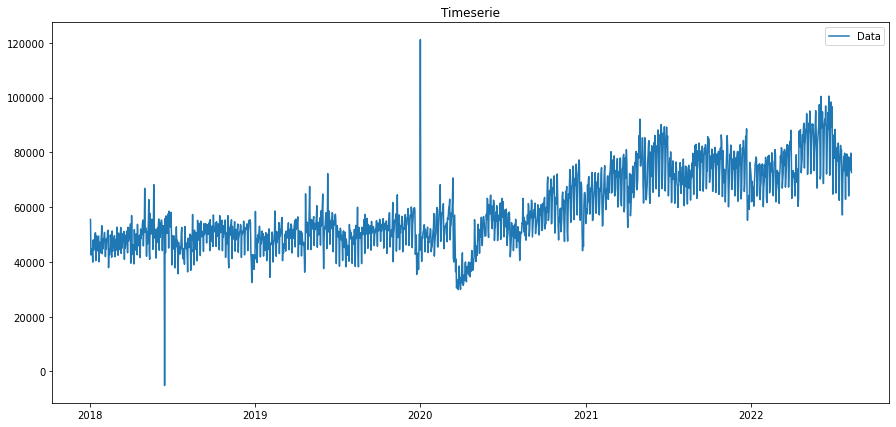

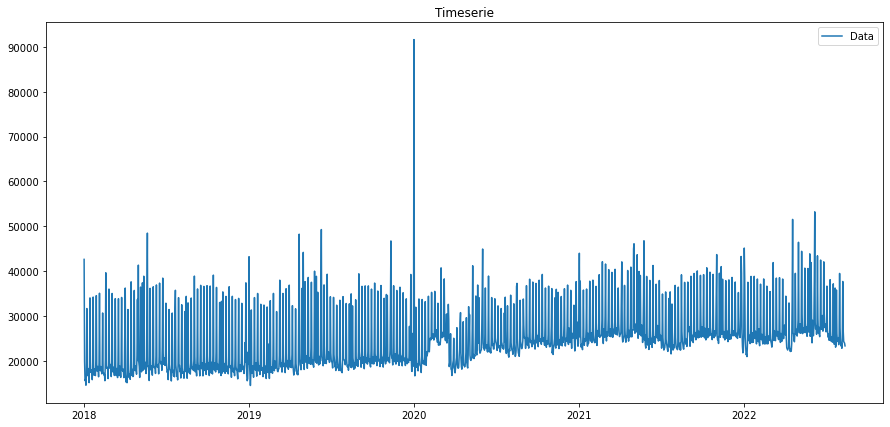

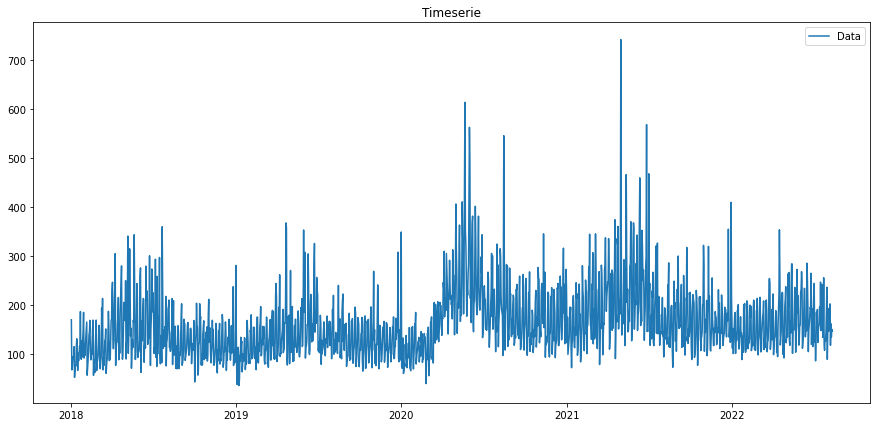

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:28: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series(data = [], index = [])


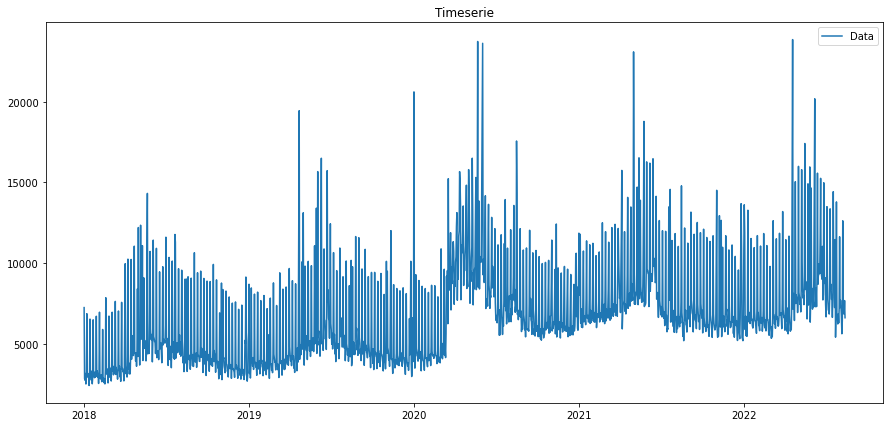

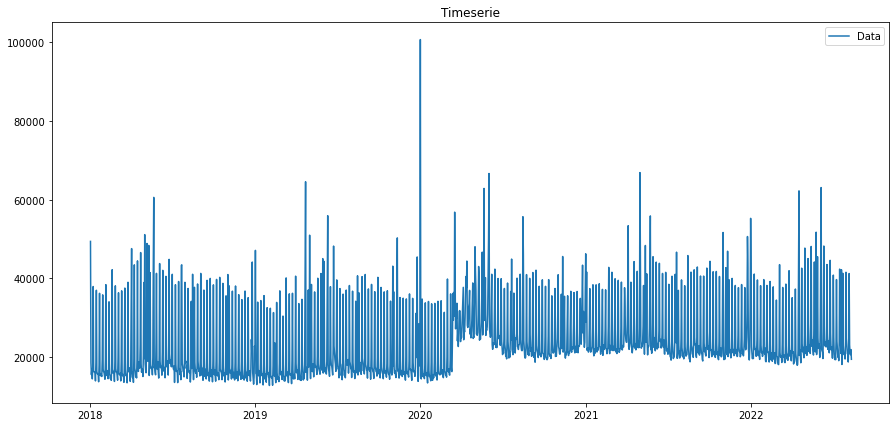

C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_10956\1252464179.py:28: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series(data = [], index = [])


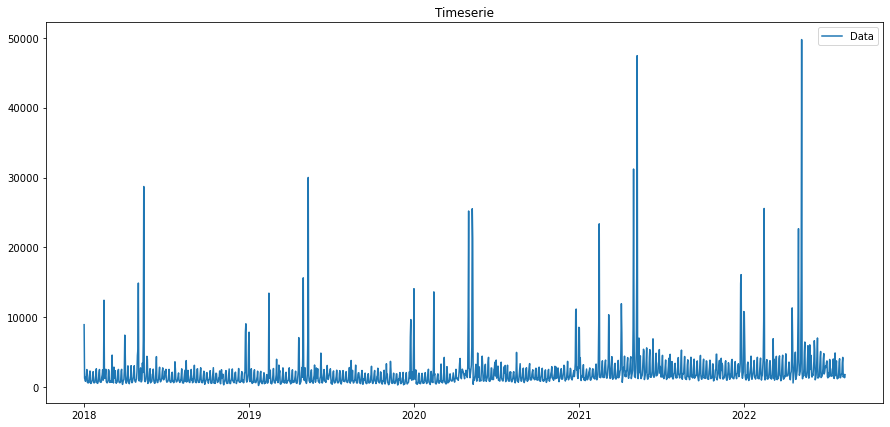

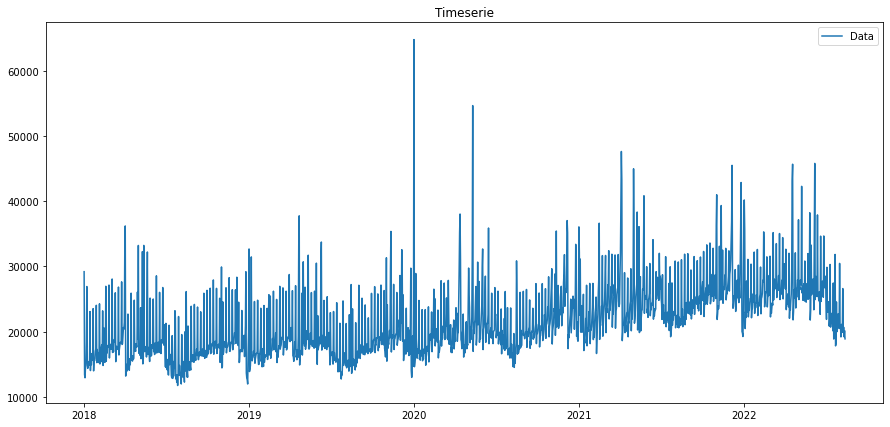

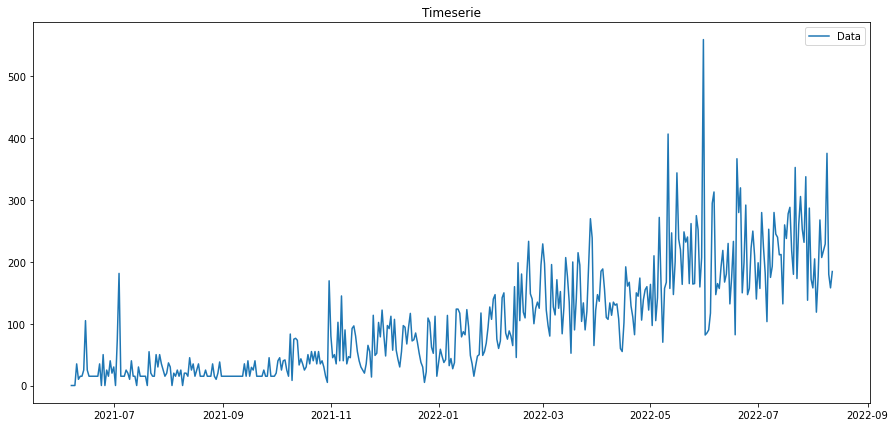

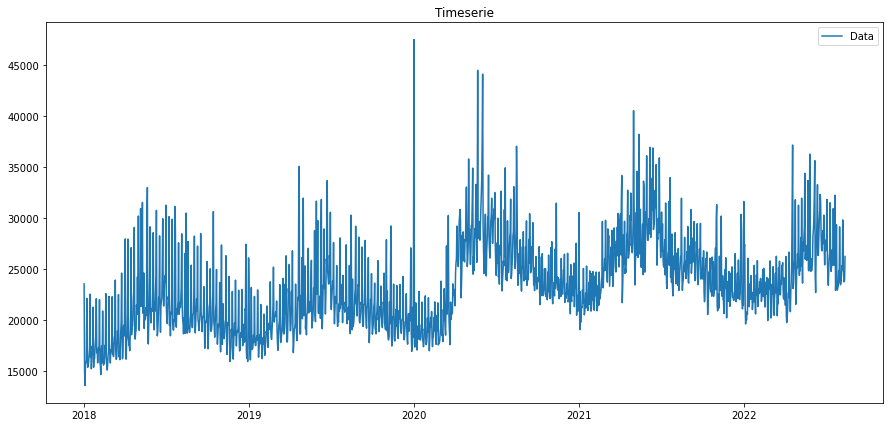

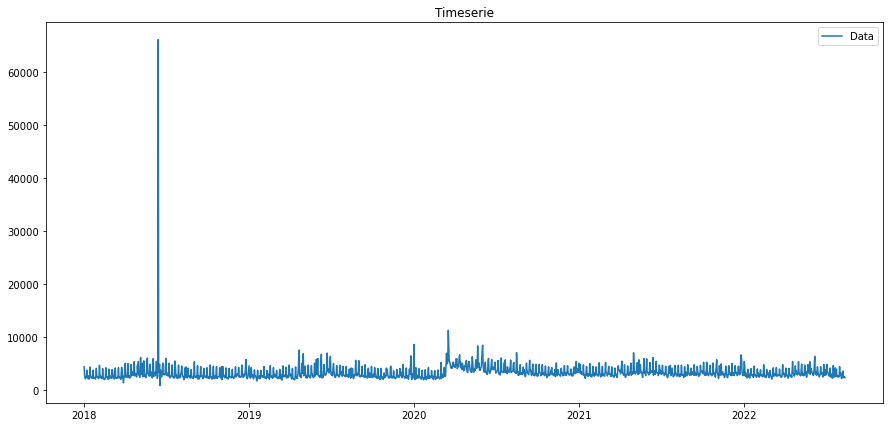

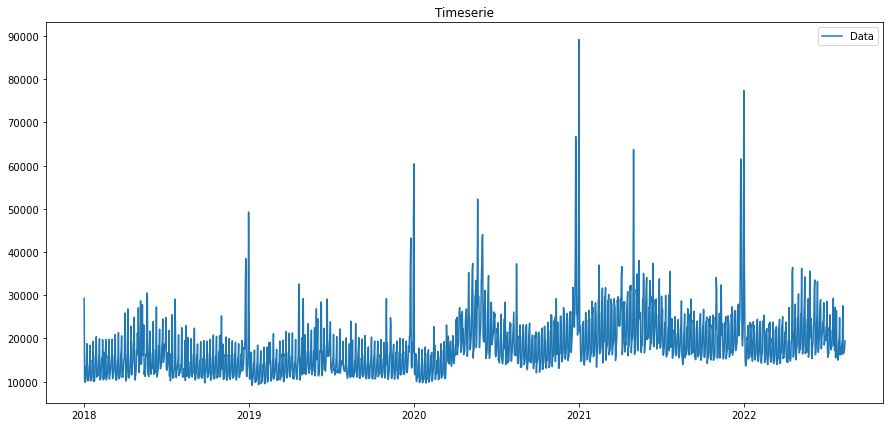

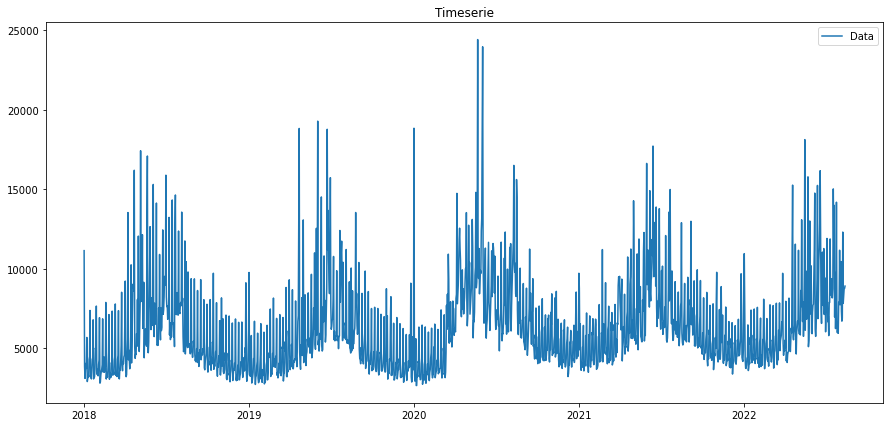

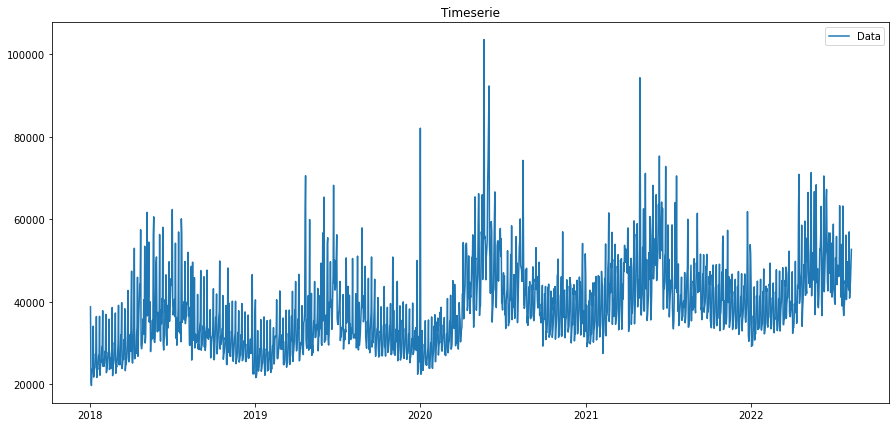

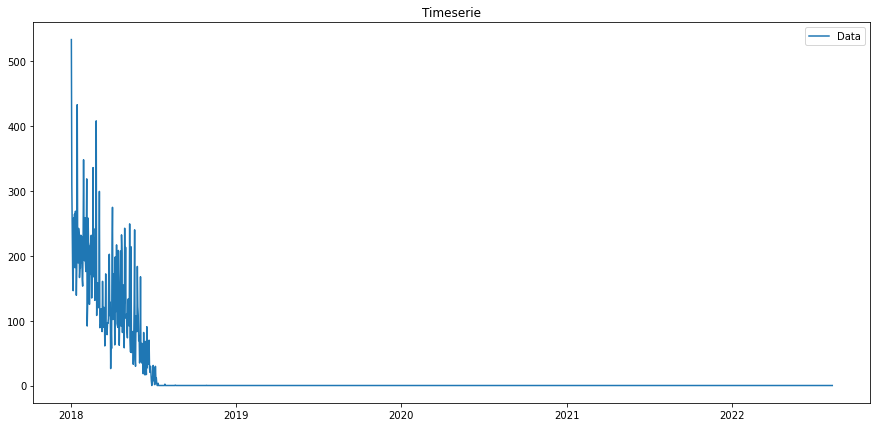

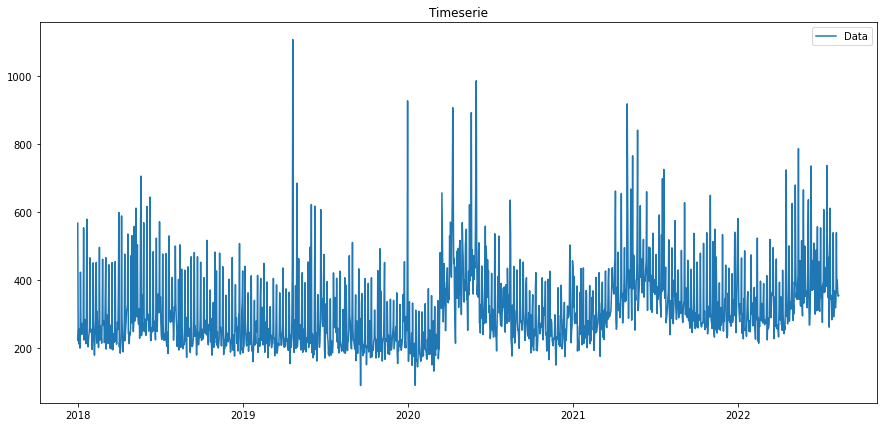

dict_keys([1, 196, 388, 389, 168, 9, 490, 267, 108, 492, 270, 273, 305, 152, 188, -1, 447])
dict_keys([])
Time Taken to load (univers & mag)'s dataframes & timeseries: ~3secondes


In [37]:
# Transforme les données en timeseries et les groupes par univers.
start = time()

all_univ_df = {k:[] for k in set(univers_correspondance.values())}
all_univ_ts = {}
all_mag_df  = {k:[] for k in set(df_ts_all[COL_MAGASIN].dropna())}
all_mag_ts  = {}

for i in range(len(df_ts_all.values)):
    temps   = int(df_ts_all[COL_TEMPS][i])
    recette = df_ts_all[COL_RECETTE][i]
    univers = df_ts_all[COL_UNIVERS][i]
    magasin = df_ts_all[COL_MAGASIN][i]

    if not univers is None:
        all_univ_df[univers_correspondance[univers]].append([temps,recette])
    if not magasin is None:
        all_mag_df[int(magasin)].append([temps,recette])
        
# environ 5 min 
print("Time Taken to load (univers & mag)'s dictionnary: ~" + str(int(time() - start)) + "secondes") 

for k in all_univ_df.keys():
    all_univ_df[k] = pd.DataFrame(data = all_univ_df[k], columns = [COL_TEMPS, COL_RECETTE])
    all_univ_ts[k] = get_timeseries(all_univ_df[k], COL_TEMPS, COL_RECETTE, show_plot = True)
    
for k in all_mag_df.keys():
    all_mag_df[k] = pd.DataFrame(data = all_mag_df[k], columns = [COL_TEMPS, COL_RECETTE])
    all_mag_ts[k] = get_timeseries(all_mag_df[k], COL_TEMPS, COL_RECETTE, show_plot = False)

print(all_univ_ts.keys())
print(all_mag_ts .keys())
# environ 5 min 
print("Time Taken to load (univers & mag)'s dataframes & timeseries: ~" + str(int(time() - start)) + "secondes") 

# GET BEST MODELS FOR TIMESERIES

In [96]:
# Test les modèles et récupère les meilleurs modèles pour chaque univers
best_models = {}

for key, timeseries in all_univ_ts.items():
    print("=====================\n         " + str(key) + "\n=====================")
    
    if len(timeseries) < 90:
        continue
    
    best_models[key] = get_best_model(timeseries, TEMPS_DETAIL, RECETTE_DETAIL,
                              alpha, season, method = METHOD, show_plot=True)
    
    print(best_models[key])
    

         1
         2
         4
         5
         6
         7
         8
         9
         10
         11
         12
         13
         14
         15
         16
         17
         18
         19
         20
         21
         22
         23
         24
         25
         26
         27
         28
         29
         30
         31
         32
         33
         34
         35
         36
         37
         38
         39
         40
         41
         42
         43
         44
         45
         46
         47
         48
         49
         50
         51
         52
         53
         54
         55
         56
         57
         58
         59
         60
         61
         62
         63
         64
         65
         66
         67
         68
         69
         70
         71
         72
         73
         74
         75
         76
         77
         78
         79
         80
         81
         82
         83
         84
         85


In [97]:
print(best_models)

{}


         2
Decomposition loaded ... 0 s


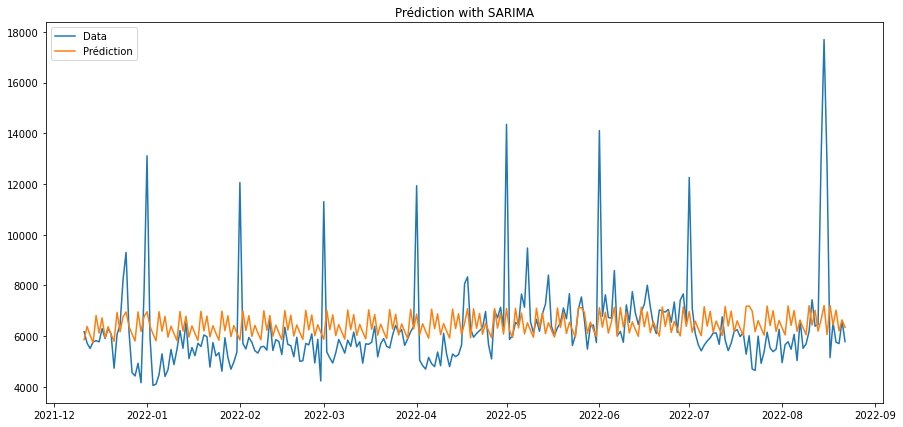

0.12006961430871144
Base Model loaded ... 43 s
Base Decomp Model loaded ... 0 s
Filtring time ... 0 s


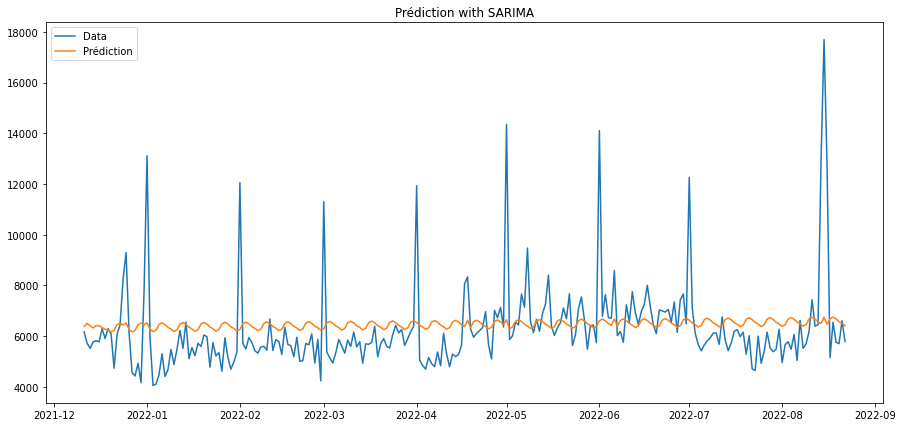

0.12255316588670094
Filtred Model loaded ... 51 s
Filtred Decomp Model loaded ... 0 s


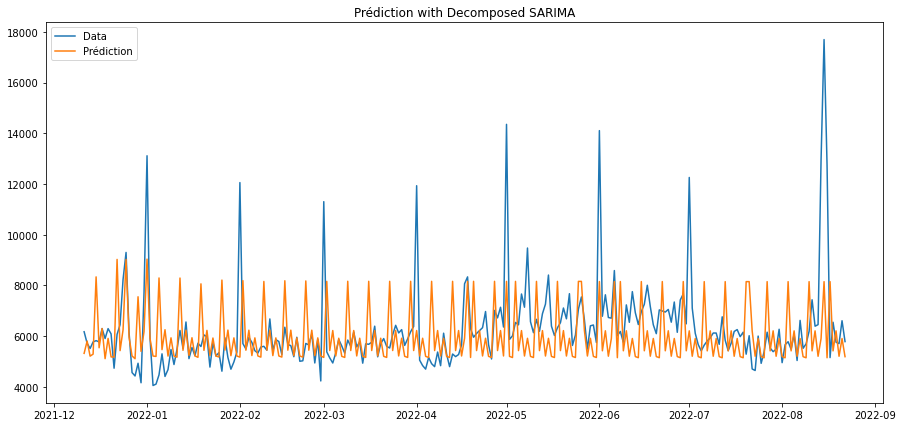

0.13087436555764945
Neural Decomp Model loaded ... 50 s
['base', 0.12006961430871144, 43.23283863067627]
         4
Decomposition loaded ... 0 s


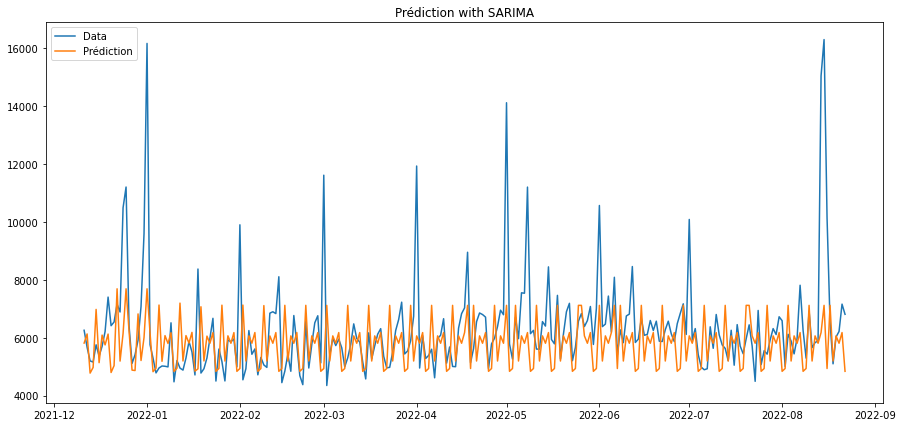

0.14333400637691798
Base Model loaded ... 36 s
Base Decomp Model loaded ... 0 s
Filtring time ... 0 s


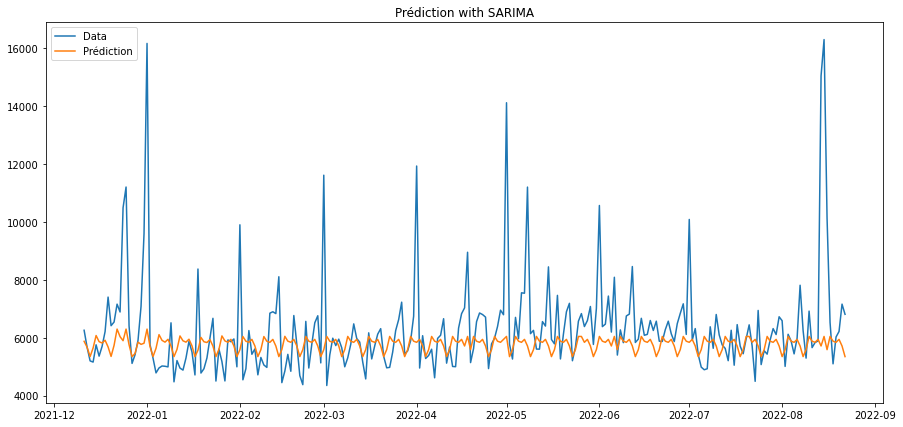

0.1452275924451526
Filtred Model loaded ... 95 s
Filtred Decomp Model loaded ... 0 s


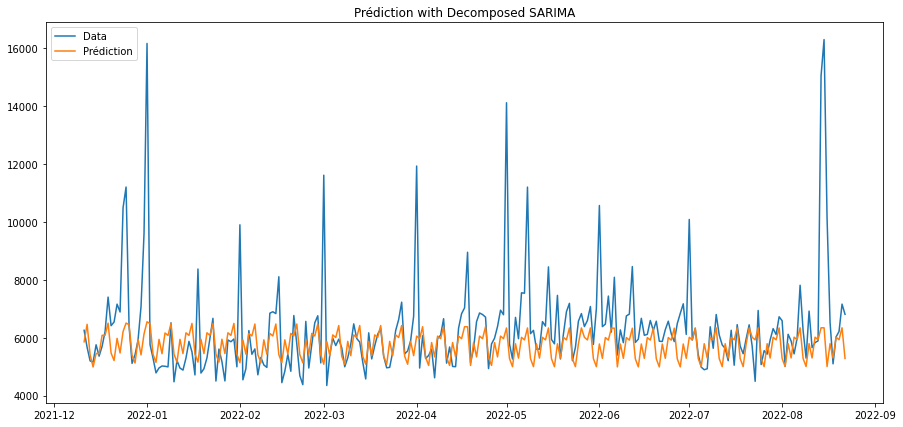

0.14096611311032195
Neural Decomp Model loaded ... 78 s
['neural', 0.14096611311032195, 78.6287944316864]
         9
Decomposition loaded ... 0 s


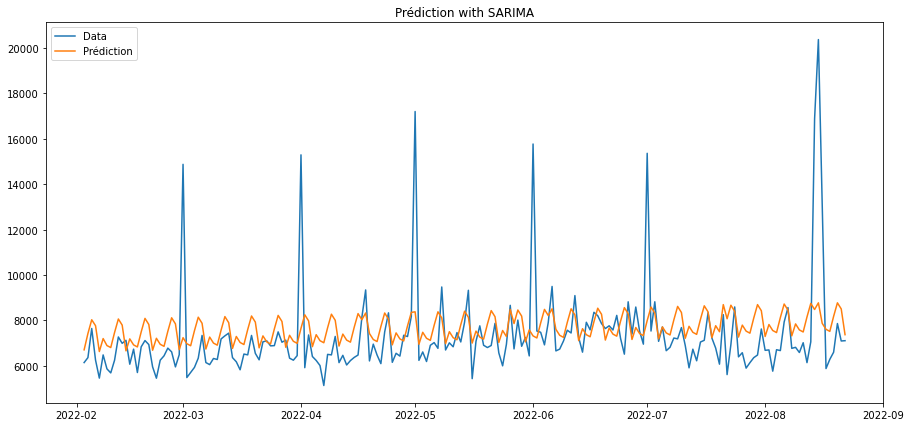

0.1265574596611564
Base Model loaded ... 33 s
Base Decomp Model loaded ... 0 s
Filtring time ... 0 s


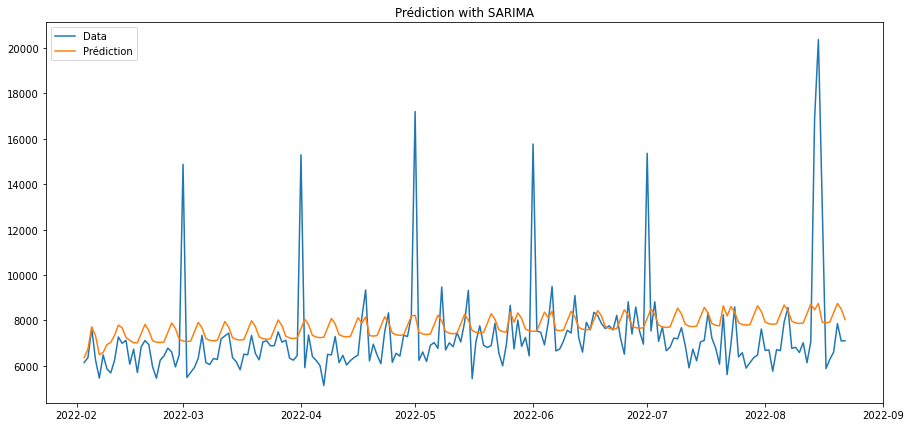

0.12839680149092497
Filtred Model loaded ... 85 s
Filtred Decomp Model loaded ... 0 s


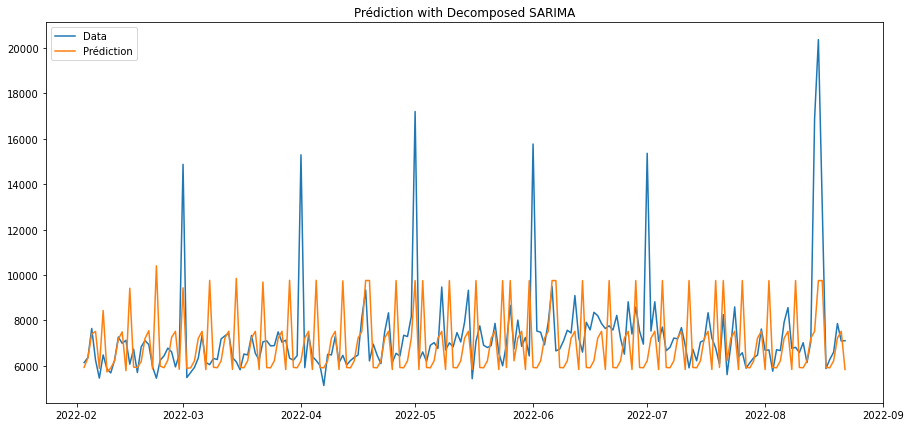

0.14241249471907352
Neural Decomp Model loaded ... 42 s
['base', 0.1265574596611564, 33.319934606552124]
         14
Decomposition loaded ... 0 s


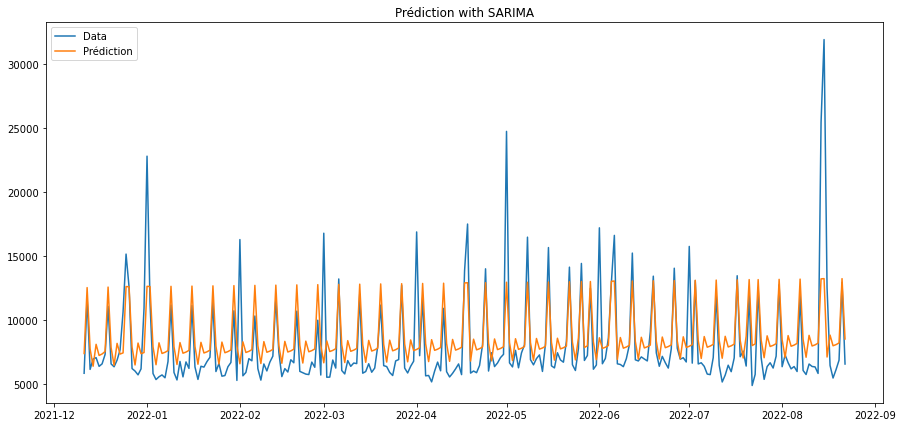

0.09869361160481185
Base Model loaded ... 40 s
Base Decomp Model loaded ... 0 s
Filtring time ... 0 s


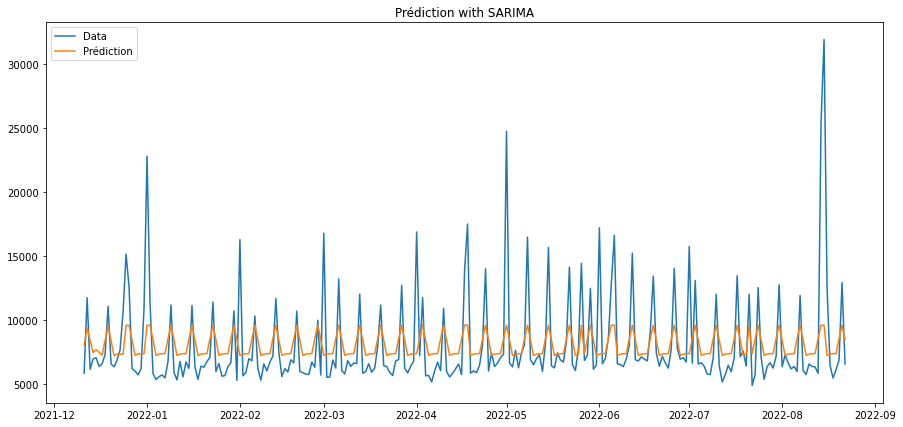

0.11841899713295215
Filtred Model loaded ... 110 s
Filtred Decomp Model loaded ... 0 s


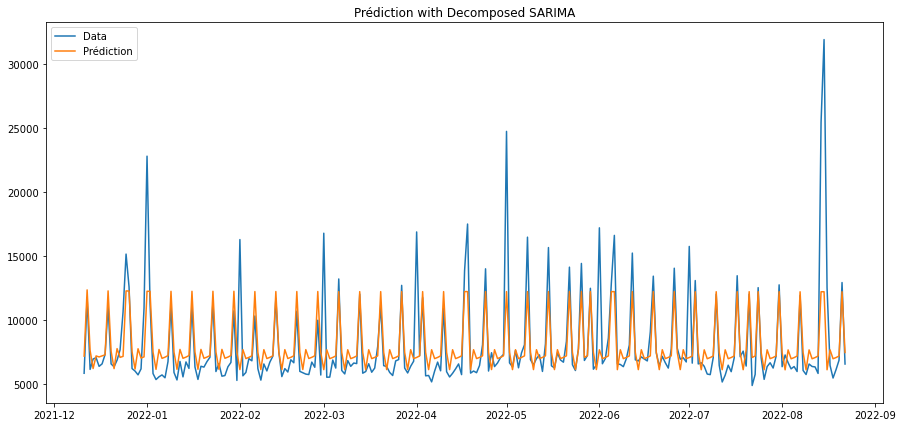

0.0962594775553091
Neural Decomp Model loaded ... 76 s
['neural', 0.0962594775553091, 76.32109928131104]
         15
Decomposition loaded ... 0 s


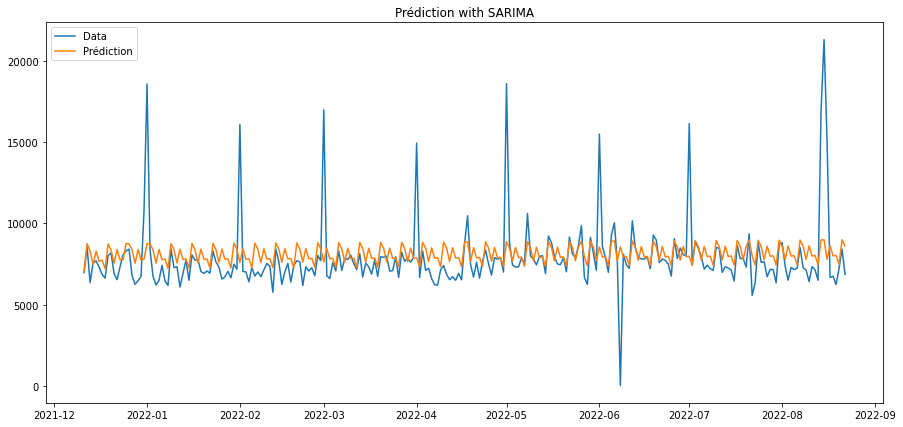

0.09645469339522013
Base Model loaded ... 65 s
Base Decomp Model loaded ... 0 s
Filtring time ... 0 s


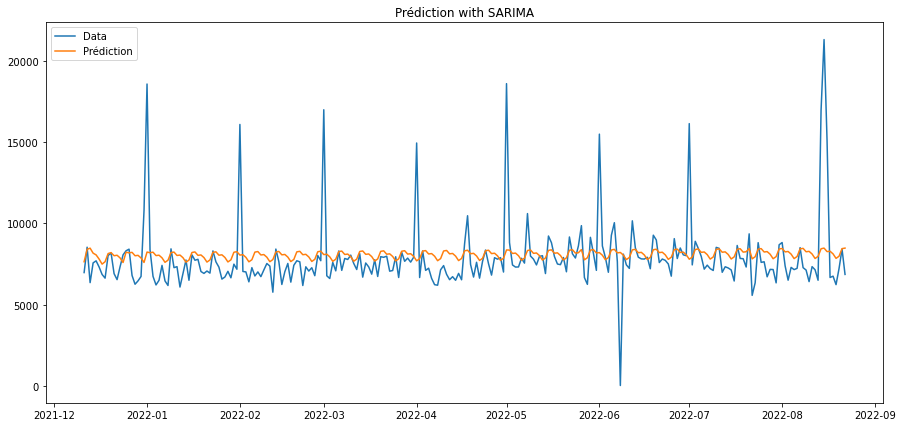

0.09798050034566048
Filtred Model loaded ... 75 s
Filtred Decomp Model loaded ... 0 s


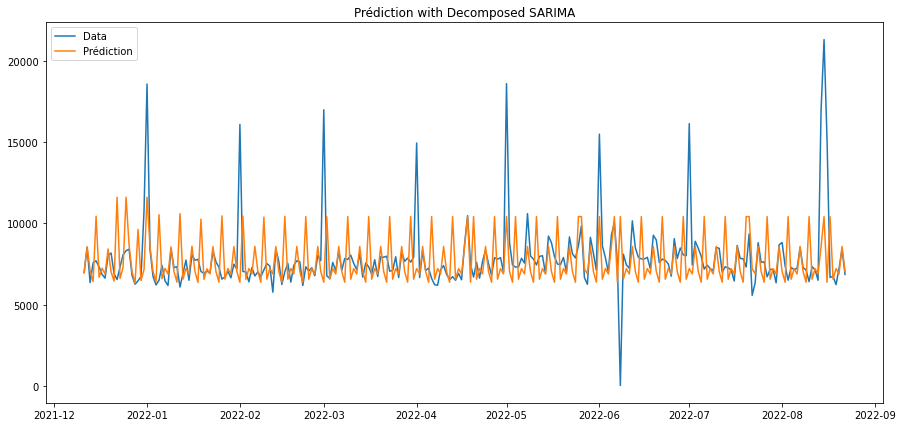

0.11040055892759987
Neural Decomp Model loaded ... 117 s
['base', 0.09645469339522013, 65.6696527004242]
         16
Decomposition loaded ... 0 s


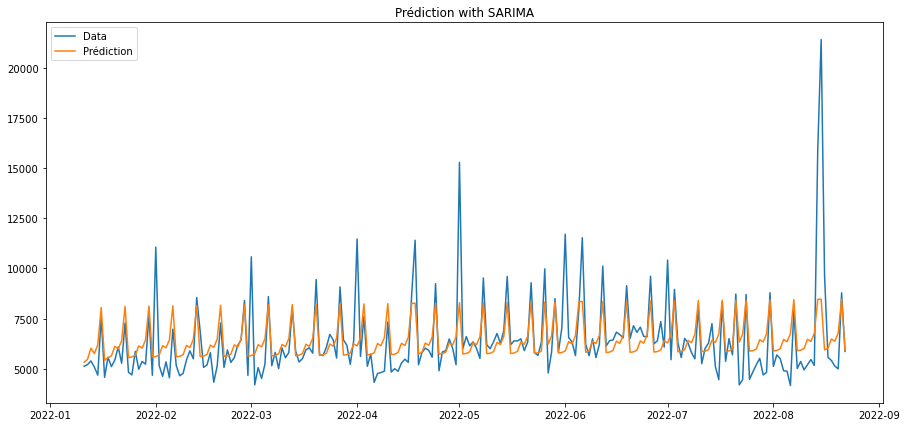

0.09485580056211738
Base Model loaded ... 93 s
Base Decomp Model loaded ... 0 s
Filtring time ... 0 s


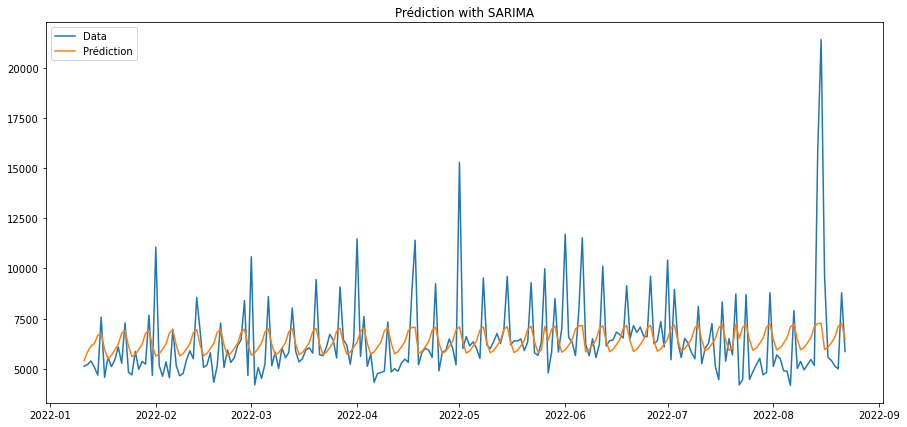

0.10971872102585997
Filtred Model loaded ... 121 s
Filtred Decomp Model loaded ... 0 s


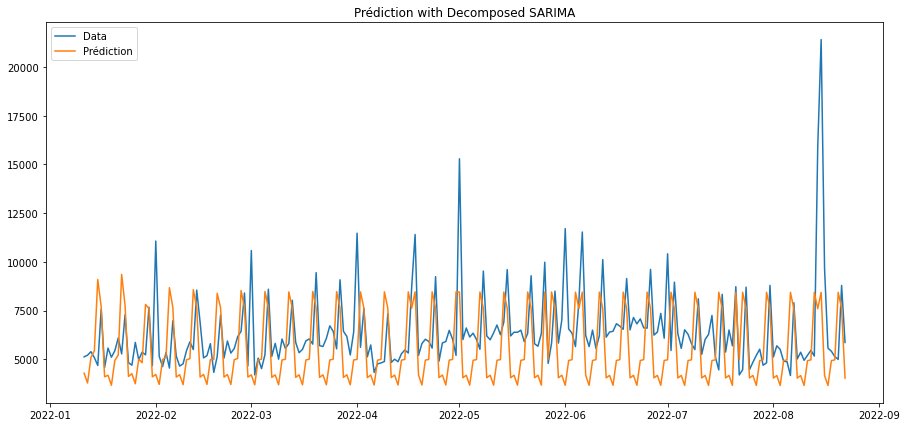

0.13835425050345176
Neural Decomp Model loaded ... 116 s
['base', 0.09485580056211738, 93.9317262172699]
         17
Decomposition loaded ... 0 s


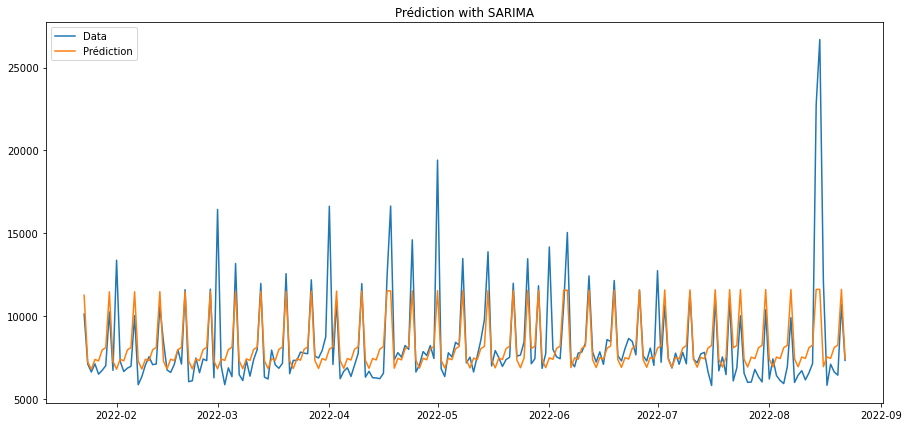

0.10015042624163085
Base Model loaded ... 98 s
Base Decomp Model loaded ... 0 s
Filtring time ... 0 s


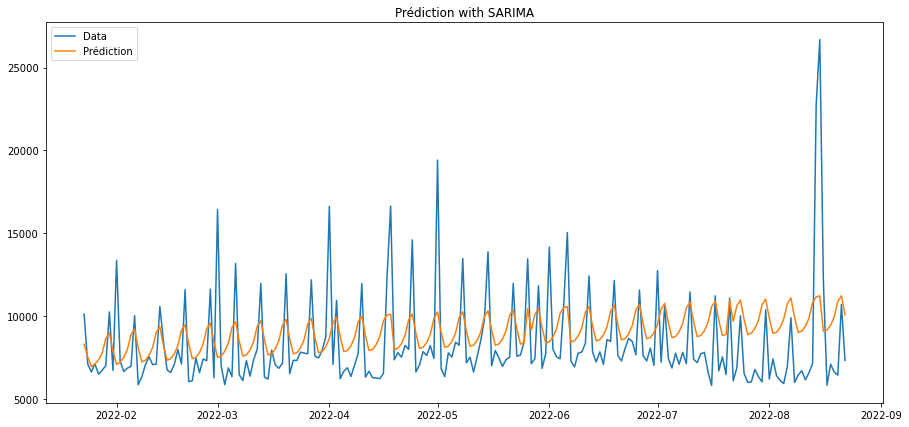

0.12908514180498037
Filtred Model loaded ... 315 s
Filtred Decomp Model loaded ... 0 s


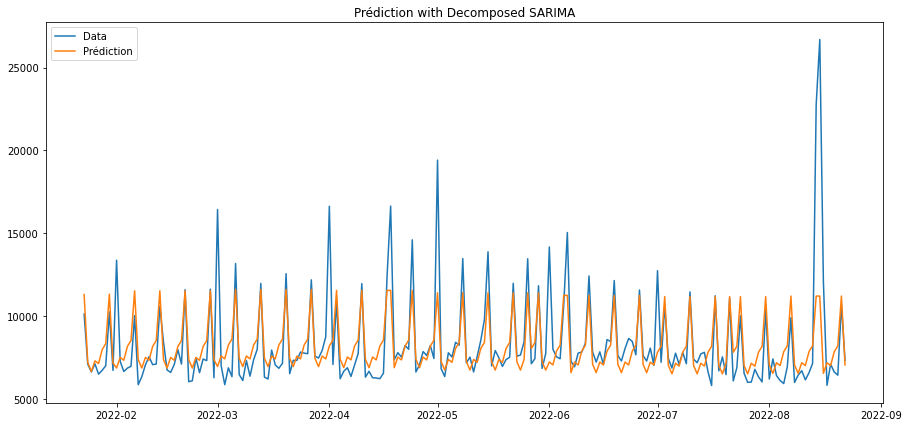

0.10222214149680095
Neural Decomp Model loaded ... 297 s
['base', 0.10015042624163085, 98.11367177963257]
         18
Decomposition loaded ... 0 s


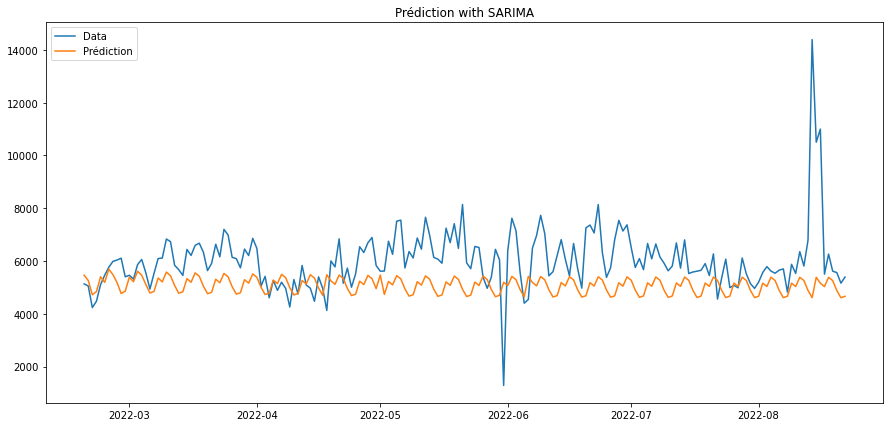

0.11365853218332564
Base Model loaded ... 349 s
Base Decomp Model loaded ... 0 s
Filtring time ... 0 s


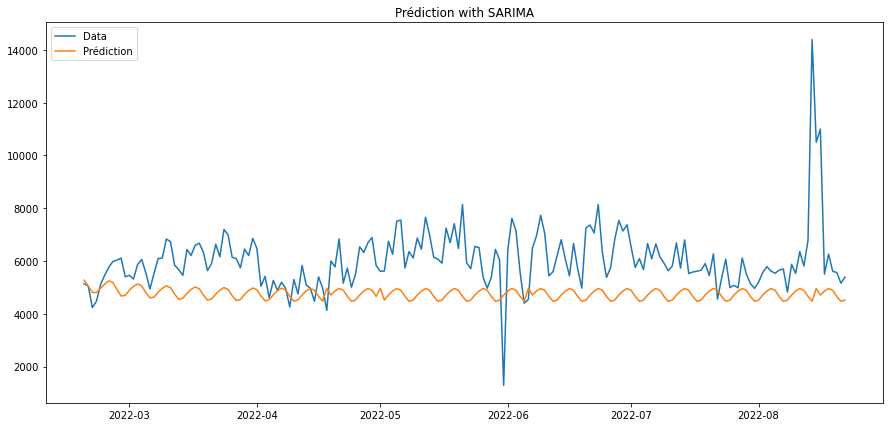

0.1309438189213342
Filtred Model loaded ... 343 s
Filtred Decomp Model loaded ... 0 s



KeyboardInterrupt



In [98]:
# Test les modèles et récupère les meilleurs modèles pour chaque magasins
best_models_mag = {}

for key, timeseries in all_mag_ts.items():
    print("=====================\n         " + str(key) + "\n=====================")
    
    if len(timeseries) < 90:
        continue
    
    best_models_mag[key] = get_best_model(timeseries, TEMPS_DETAIL, RECETTE_DETAIL,
                              alpha, season, method = METHOD, show_plot=True)
    
    print(best_models_mag[key])

In [43]:
print("Total Time Taken: ~" + str(int(time() - Very_Start)) + "secondes") 

Total Time Taken: ~10097secondes


### INSERT DATA


In [28]:
"""
    Définition de tous les paramètres, tables et engines permettant l'insert de données.
    Les table de la DB auront le format : [DB_INSERT].[schema_INSERT].[TABLE_NAME]
"""
driver   = '{ODBC Driver 17 for SQL Server}'
server   = 'E5591-9S6YMV2'
username = 'WVN\k.dubrulle'
login    = ('DRIVER=' + driver + 
         ';SERVER='   + server + 
         ';Trusted_Connection=yes;')

DB_INSERT     = "DelitraiteurBI_ResultML"

schema_INSERT = "PML"

TABLE_PARAMS  = "UC1_Caracteristique"    
TABLE_MODEL   = "UC1_Model"   
TABLE_B_MODEL = "UC1_Best_Model"  
TABLE_PRED    = "UC1_Recette_Prediction"

# CREATE Connexion
params        = urllib.parse.quote_plus(login)
engine_INSERT = create_engine("mssql+pyodbc:///?odbc_connect=%s" % params)

# TEST Connexion
conn = engine_INSERT.connect()

print(pd.read_sql("SELECT TOP(10) ["+TABLE_UNIVERS+".KEY] FROM ["+DB_INSERT+"].[DWH].[Dim_"+TABLE_UNIVERS+"]", conn))

conn.close()

   Univers.KEY
0           -1
1            1
2            2
3            3
4            4
5            5
6            6
7            7
8            8
9            9


### Insert a param object into table and get the param key

In [ ]:
# Recuperation of today's date
now = date.today()
# Definition of SQL query
sql_cmd = '''
INSERT INTO ['''+DB_INSERT+'''].['''+schema_INSERT+'''].['''+TABLE_PARAMS+''']
     VALUES
           ('''+str(date_to_key(now) )+'''
           ,'''+"'"+str(DB)+"'"+'''
           ,'''+str(Univers_Depth)+'''
           ,NULL
           ,'''+str(date_to_key(start_date))+''')
'''

# Run SQL query
conn = engine_INSERT.connect()
conn.execute(sql_cmd)

conn = engine_INSERT.connect()
# Recuperation of primary key of TABLE_PARAMS last elements 
params_key = pd.read_sql("SELECT ["+TABLE_PARAMS+".KEY] FROM ["
                         +DB_INSERT+"].["+schema_INSERT+"].["+TABLE_PARAMS+"] ORDER BY 1 DESC",
                             conn).values[0][0]
conn.close()

### Insert best models into table

In [36]:
conn = engine_INSERT.connect()

for key,val in best_models.items():
    if val[1]>.25:
        continue
        
    if val[0] == 'base':
        libelle = 1
    elif val[0] == 'baseD':
        libelle = 2
    elif val[0] == 'filtred':
        libelle = 3
    elif val[0] == 'filtredD':
        libelle = 4
    elif val[0] == 'neural':
        libelle = 5
    else:
        print('error for ', key, val)
        continue
    
    sql_cmd = '''INSERT INTO ['''+DB_INSERT+'''].['''+schema_INSERT+'''].['''+TABLE_B_MODEL+''']
        VALUES ('''+str(params_key)+'''
                ,'''+str(libelle)+'''
                , '''+str(key)+'''
                , NULL
                , '''+str(round(val[1],2))+'''
                , '''+str(round(val[2],2))+''')'''
    
#     print(sql_cmd)
    conn.execute(sql_cmd)
    
conn.close()

In [53]:
conn = engine_INSERT.connect()

for key,val in best_models_mag.items():
    if val[1]>.2:
        continue
        
    if val[0] == 'base':
        libelle = 1
    elif val[0] == 'baseD':
        libelle = 2
    elif val[0] == 'filtred':
        libelle = 3
    elif val[0] == 'filtredD':
        libelle = 4
    elif val[0] == 'neural':
        libelle = 5
    else:
        print('error for ', key, val)
        continue
    
    sql_cmd = '''INSERT INTO ['''+DB_INSERT+'''].['''+schema_INSERT+'''].['''+TABLE_B_MODEL+''']
        VALUES ('''+str(params_key)+'''
                ,'''+str(libelle)+'''
                , NULL
                , '''+str(key)+'''
                , '''+str(round(val[1],2))+'''
                , '''+str(round(val[2],2))+''')'''   
#     print(sql_cmd)
    conn.execute(sql_cmd)
    
conn.close()

### Calculate Prediction and insert prediction

In [29]:
params_key = 2

         1
Filtred Model loaded ... 132 s
2022-08-11    76233.872945
2022-08-12    72432.510619
2022-08-13    68308.967836
2022-08-14    70639.228169
2022-08-15    78782.018053
2022-08-16    77776.701148
2022-08-17    78147.591378
2022-08-18    77866.757881
2022-08-19    73464.666543
2022-08-20    68751.663598
dtype: float64


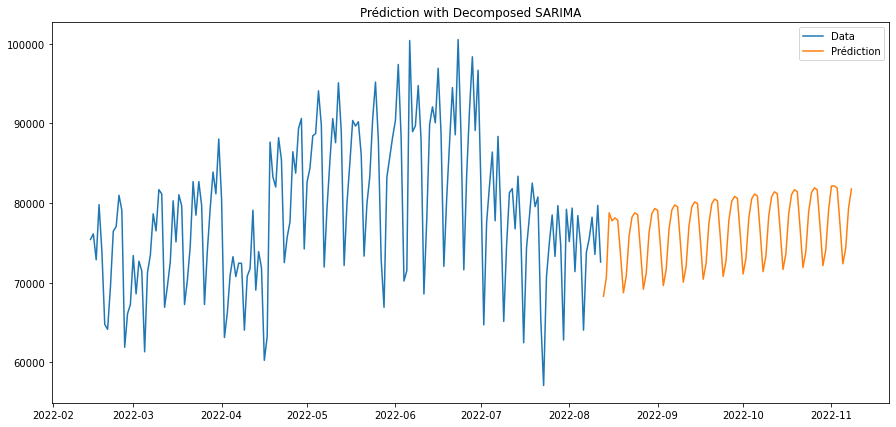

2022-08-13    68308.967836
2022-08-14    70639.228169
2022-08-15    78782.018053
2022-08-16    77776.701148
2022-08-17    78147.591378
2022-08-18    77866.757881
2022-08-19    73464.666543
2022-08-20    68751.663598
2022-08-21    70850.310560
2022-08-22    75892.518044
dtype: float64
Prediction loaded loaded ... 132 s
         9
Base Model loaded ... 65 s
2022-08-11    22981.967542
2022-08-12    19628.588364
2022-08-13    24260.270639
2022-08-14    41938.792572
2022-08-15    42049.052452
2022-08-16    21482.383545
2022-08-17    21324.424421
2022-08-18    23432.762461
2022-08-19    19788.996580
2022-08-20    24557.701147
dtype: float64


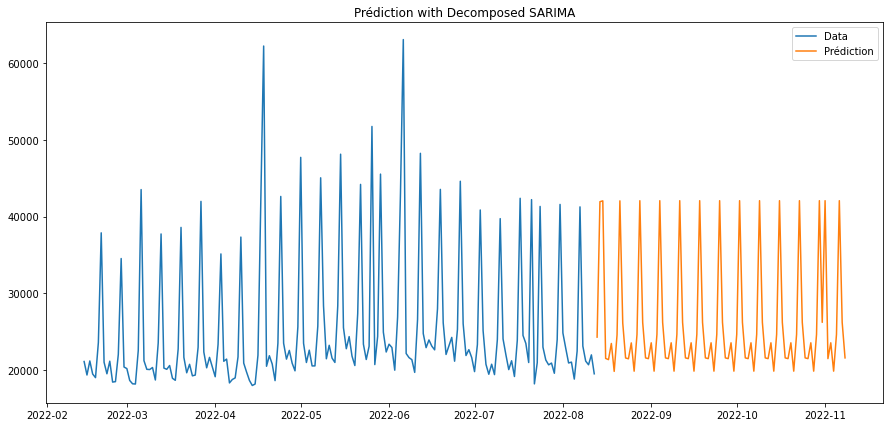

2022-08-13    24260.270639
2022-08-14    41938.792572
2022-08-15    42049.052452
2022-08-16    21482.383545
2022-08-17    21324.424421
2022-08-18    23432.762461
2022-08-19    19788.996580
2022-08-20    24557.701147
2022-08-21    42049.052452
2022-08-22    26105.233491
dtype: float64
Prediction loaded loaded ... 65 s
         -1
No Model loaded


In [38]:
day_predicted = 90
conn = engine_INSERT.connect()

for key, timeseries in all_univ_ts.items():
    if key > 10:
        continue
    start_pred=  time()
    print("=====================\n         " + str(key) + "\n=====================")

    sql_cmd = '''SELECT ['''+TABLE_MODEL+'''.Libelle], 
    ['''+TABLE_MODEL+'''.KEY],['''+TABLE_MODEL+'''.Method],['''+TABLE_MODEL+'''.Window]
    FROM  ['''+DB_INSERT+'''].['''+schema_INSERT+'''].['''+TABLE_B_MODEL+''']
    INNER JOIN  ['''+DB_INSERT+'''].['''+schema_INSERT+'''].['''+TABLE_MODEL+''']
    ON ['''+TABLE_MODEL+'''.KEY] = ['''+TABLE_B_MODEL+'''.'''+TABLE_MODEL+'''.KEY]
    WHERE ['''+TABLE_B_MODEL+'''.'''+TABLE_UNIVERS+'''.KEY] = ''' + str(key) + '''
    AND ['''+TABLE_B_MODEL+'''.'''+TABLE_PARAMS+'''.KEY] = ''' + str(params_key)

    model_df = pd.read_sql(sql_cmd, conn)
    if len(model_df.values) == 0:
        print("No Model loaded")
        continue
        
    model_lib = model_df.values[0][0].replace(" ", "")
    model_key = model_df.values[0][1]
    method    = model_df.values[0][2].replace(" ", "")
    WINDOW    = model_df.values[0][3]
    if not WINDOW is None:
        WINDOW = int(WINDOW)
    
    pred = get_prediction(timeseries, model_lib, day_predicted, TEMPS_DETAIL, RECETTE_DETAIL,
                          season = 7, method = method, WINDOW=WINDOW, show_plot=True)

    print(pred.head(10))
    
    for d in pred.index:
        sql_cmd = '''INSERT INTO ['''+DB_INSERT+'''].['''+schema_INSERT+'''].['''+TABLE_PRED+''']
        VALUES ('''  + str(params_key) + '''
                ,''' + str(model_key) + '''
                ,''' + str(date_to_key(d)) + '''
                ,''' + str(key) + '''
                ,NULL
                ,''' + str(round(pred[d],2)) + ''')'''

#         print(sql_cmd)
        conn.execute(sql_cmd)
    
    
    print("Prediction loaded loaded ...", int(time()-start_pred), "s")

conn.close()

         2
Base Model loaded ... 76 s
2022-08-21    7282.728955
2022-08-22    6964.991533
2022-08-23    6720.726171
2022-08-24    6413.796401
2022-08-25    6301.243431
2022-08-26    6693.658232
2022-08-27    6096.187242
2022-08-28    7413.352071
2022-08-29    7017.031522
2022-08-30    6743.842727
dtype: float64


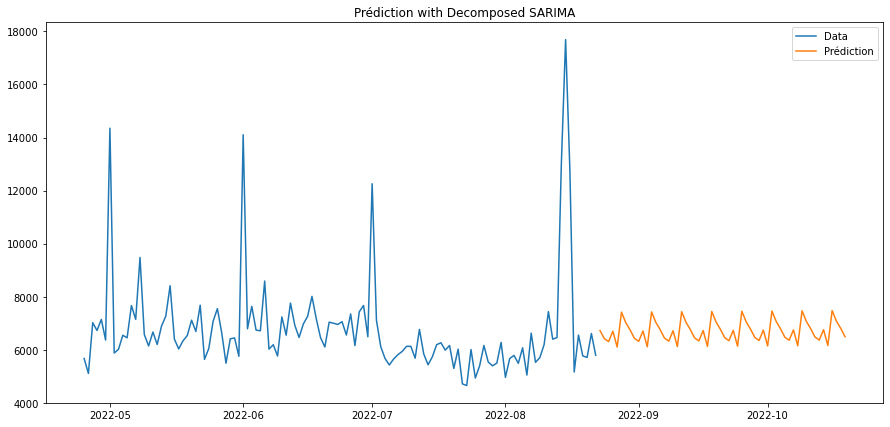

2022-08-23    6720.726171
2022-08-24    6413.796401
2022-08-25    6301.243431
2022-08-26    6693.658232
2022-08-27    6096.187242
2022-08-28    7413.352071
2022-08-29    7017.031522
2022-08-30    6743.842727
2022-08-31    6427.192799
2022-09-01    6311.237696
dtype: float64
Prediction loaded loaded ... 77 s
         4
Base Model loaded ... 49 s
2022-08-21    10628.067726
2022-08-22    10635.033096
2022-08-23     7276.292256
2022-08-24     6525.387982
2022-08-25     5483.602146
2022-08-26     5801.791689
2022-08-27     6054.461413
2022-08-28    11101.680631
2022-08-29    11019.683722
2022-08-30     7536.800734
dtype: float64


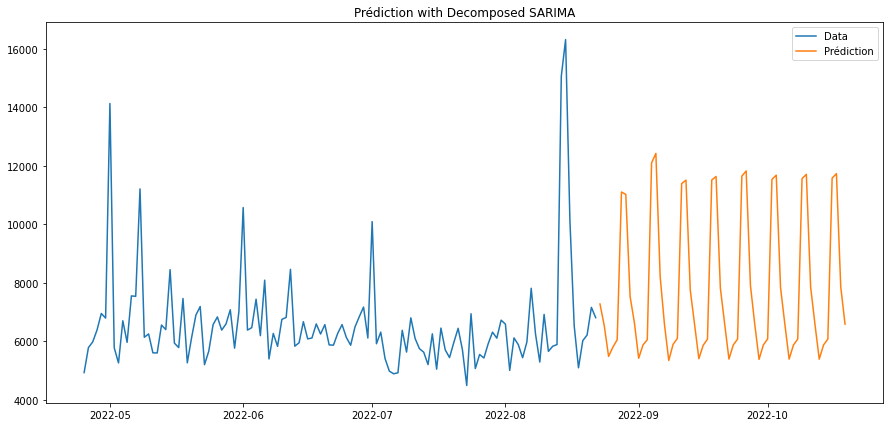

2022-08-23     7276.292256
2022-08-24     6525.387982
2022-08-25     5483.602146
2022-08-26     5801.791689
2022-08-27     6054.461413
2022-08-28    11101.680631
2022-08-29    11019.683722
2022-08-30     7536.800734
2022-08-31     6639.660076
2022-09-01     5421.095798
dtype: float64
Prediction loaded loaded ... 49 s
         9
Filtred Model loaded ... 48 s
2022-08-21    8575.788393
2022-08-22    8838.868740
2022-08-23    8007.846422
2022-08-24    7211.603425
2022-08-25    7064.101182
2022-08-26    7355.762650
2022-08-27    7909.081560
2022-08-28    8702.876050
2022-08-29    8695.538207
2022-08-30    7993.428217
dtype: float64


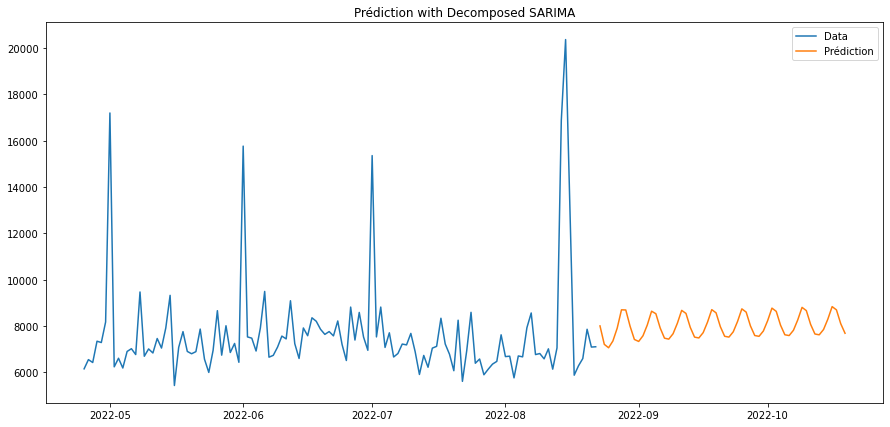

2022-08-23    8007.846422
2022-08-24    7211.603425
2022-08-25    7064.101182
2022-08-26    7355.762650
2022-08-27    7909.081560
2022-08-28    8702.876050
2022-08-29    8695.538207
2022-08-30    7993.428217
2022-08-31    7422.610061
2022-09-01    7337.109628
dtype: float64
Prediction loaded loaded ... 48 s
         14
Base Model loaded ... 53 s
2022-08-21    15465.764890
2022-08-22    11722.815583
2022-08-23     7774.717199
2022-08-24     7115.796574
2022-08-25     6965.365517
2022-08-26     7154.557630
2022-08-27     7371.274140
2022-08-28    14519.369863
2022-08-29     9717.929509
2022-08-30     7310.951306
dtype: float64


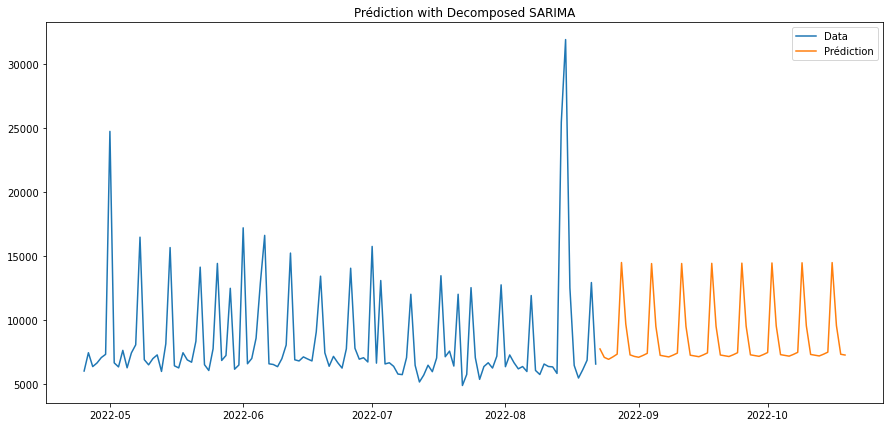

2022-08-23     7774.717199
2022-08-24     7115.796574
2022-08-25     6965.365517
2022-08-26     7154.557630
2022-08-27     7371.274140
2022-08-28    14519.369863
2022-08-29     9717.929509
2022-08-30     7310.951306
2022-08-31     7191.511042
2022-09-01     7124.293506
dtype: float64
Prediction loaded loaded ... 53 s
         15
Neural Decomp Model loaded ... 56 s
2022-08-21    10415.816355
2022-08-22    11254.187916
2022-08-23     8610.591749
2022-08-24     5207.585263
2022-08-25     5798.947607
2022-08-26     5512.222186
2022-08-27     5662.445563
2022-08-28    11087.646481
2022-08-29    12414.273158
2022-08-30     9403.841467
dtype: float64


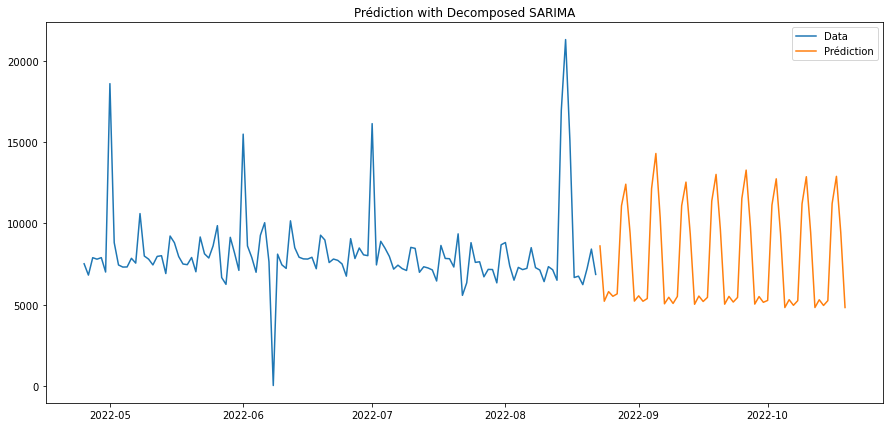

2022-08-23     8610.591749
2022-08-24     5207.585263
2022-08-25     5798.947607
2022-08-26     5512.222186
2022-08-27     5662.445563
2022-08-28    11087.646481
2022-08-29    12414.273158
2022-08-30     9403.841467
2022-08-31     5215.609097
2022-09-01     5539.453196
dtype: float64
Prediction loaded loaded ... 57 s
         16
Base Model loaded ... 42 s
2022-08-21    10046.598143
2022-08-22     8705.672197
2022-08-23     6760.558077
2022-08-24     6077.750597
2022-08-25     6318.254322
2022-08-26     5908.915523
2022-08-27     5568.299285
2022-08-28     9456.773791
2022-08-29     7244.805353
2022-08-30     6430.174089
dtype: float64


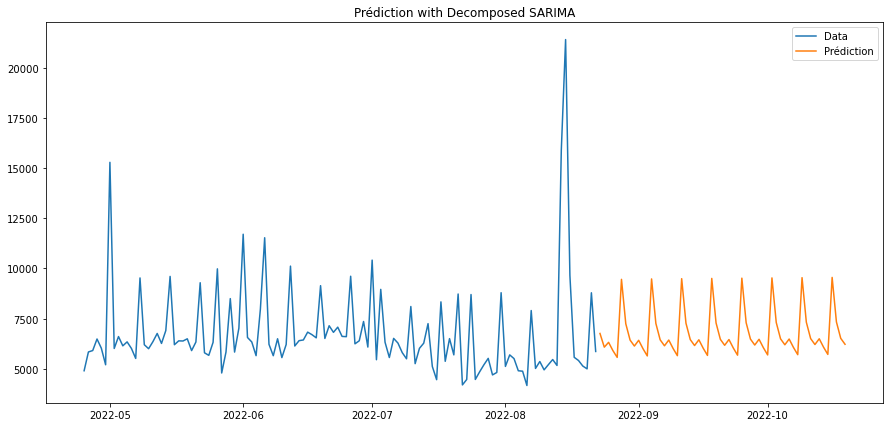

2022-08-23    6760.558077
2022-08-24    6077.750597
2022-08-25    6318.254322
2022-08-26    5908.915523
2022-08-27    5568.299285
2022-08-28    9456.773791
2022-08-29    7244.805353
2022-08-30    6430.174089
2022-08-31    6133.758061
2022-09-01    6420.425995
dtype: float64
Prediction loaded loaded ... 43 s
         17
Base Model loaded ... 45 s
2022-08-21    15220.280439
2022-08-22    14441.030070
2022-08-23     9028.646237
2022-08-24     6273.031101
2022-08-25     6536.894554
2022-08-26     6418.178887
2022-08-27     6811.787621
2022-08-28    15867.809888
2022-08-29    15545.667181
2022-08-30     9165.254096
dtype: float64


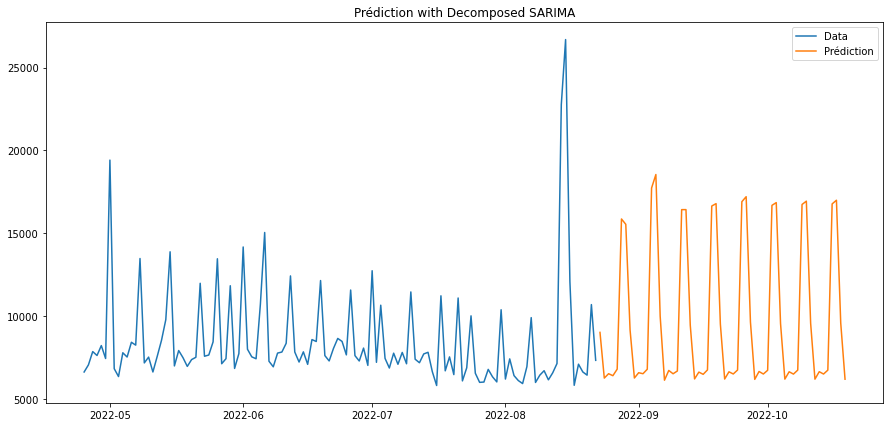

2022-08-23     9028.646237
2022-08-24     6273.031101
2022-08-25     6536.894554
2022-08-26     6418.178887
2022-08-27     6811.787621
2022-08-28    15867.809888
2022-08-29    15545.667181
2022-08-30     9165.254096
2022-08-31     6277.288030
2022-09-01     6596.585850
dtype: float64
Prediction loaded loaded ... 45 s
         18
Base Model loaded ... 214 s
2022-08-21    8332.227612
2022-08-22    7588.961667
2022-08-23    8184.870980
2022-08-24    6624.353561
2022-08-25    7220.548047
2022-08-26    6608.163084
2022-08-27    6400.537114
2022-08-28    7417.363478
2022-08-29    7011.741264
2022-08-30    7545.968375
dtype: float64


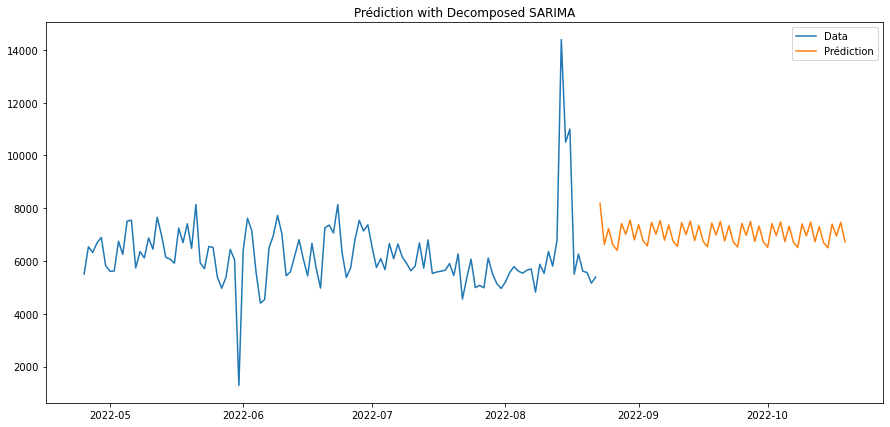

2022-08-23    8184.870980
2022-08-24    6624.353561
2022-08-25    7220.548047
2022-08-26    6608.163084
2022-08-27    6400.537114
2022-08-28    7417.363478
2022-08-29    7011.741264
2022-08-30    7545.968375
2022-08-31    6798.706909
2022-09-01    7374.932348
dtype: float64
Prediction loaded loaded ... 214 s
         19
Neural Decomp Model loaded ... 67 s
2022-08-21     9280.688955
2022-08-22    10515.900584
2022-08-23     8630.673596
2022-08-24     5665.993104
2022-08-25     5661.653985
2022-08-26     5697.312971
2022-08-27     5220.134916
2022-08-28    10011.567759
2022-08-29    11988.633220
2022-08-30     9511.437340
dtype: float64


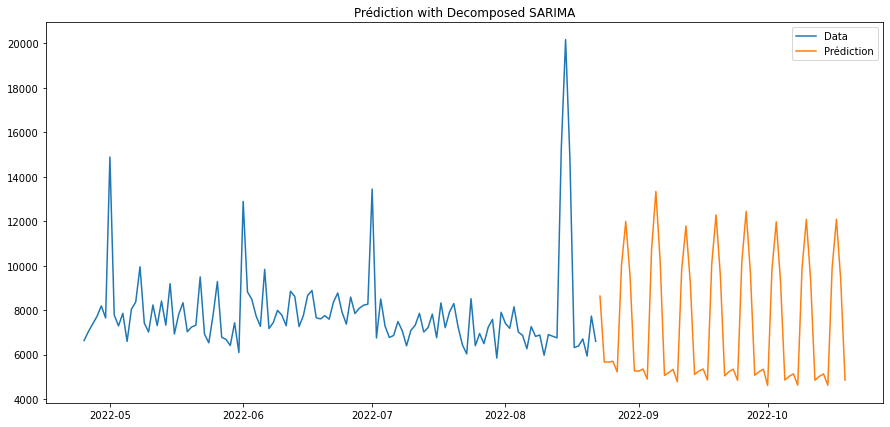

2022-08-23     8630.673596
2022-08-24     5665.993104
2022-08-25     5661.653985
2022-08-26     5697.312971
2022-08-27     5220.134916
2022-08-28    10011.567759
2022-08-29    11988.633220
2022-08-30     9511.437340
2022-08-31     5268.470100
2022-09-01     5251.442889
dtype: float64
Prediction loaded loaded ... 67 s
         21
Base Model loaded ... 110 s
2022-08-21    12029.389399
2022-08-22    12360.170192
2022-08-23    10855.175210
2022-08-24     8771.873080
2022-08-25     9029.804486
2022-08-26     9282.458847
2022-08-27     8771.364953
2022-08-28    11025.472331
2022-08-29    10663.675352
2022-08-30     9679.599481
dtype: float64


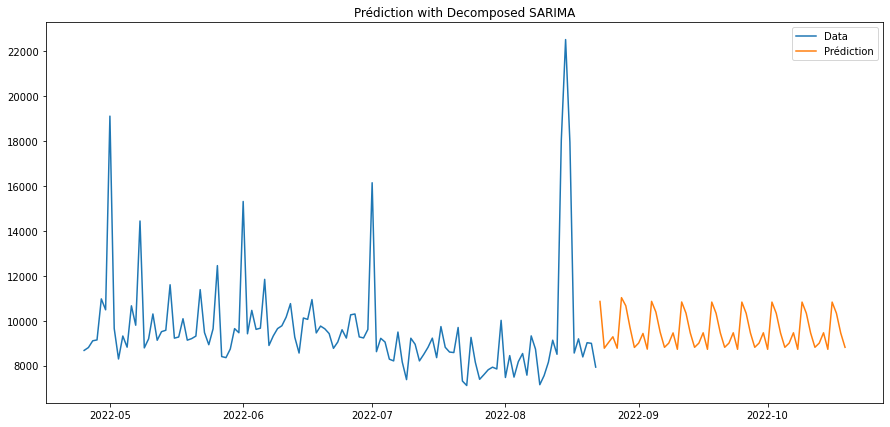

2022-08-23    10855.175210
2022-08-24     8771.873080
2022-08-25     9029.804486
2022-08-26     9282.458847
2022-08-27     8771.364953
2022-08-28    11025.472331
2022-08-29    10663.675352
2022-08-30     9679.599481
2022-08-31     8805.391579
2022-09-01     9002.864191
dtype: float64
Prediction loaded loaded ... 111 s
         22
Neural Decomp Model loaded ... 46 s
2022-08-21    5914.398372
2022-08-22    6430.974986
2022-08-23    5684.314041
2022-08-24    3029.313544
2022-08-25    3403.442429
2022-08-26    3191.240385
2022-08-27    3252.003891
2022-08-28    5789.758882
2022-08-29    6303.239976
2022-08-30    5624.341381
dtype: float64


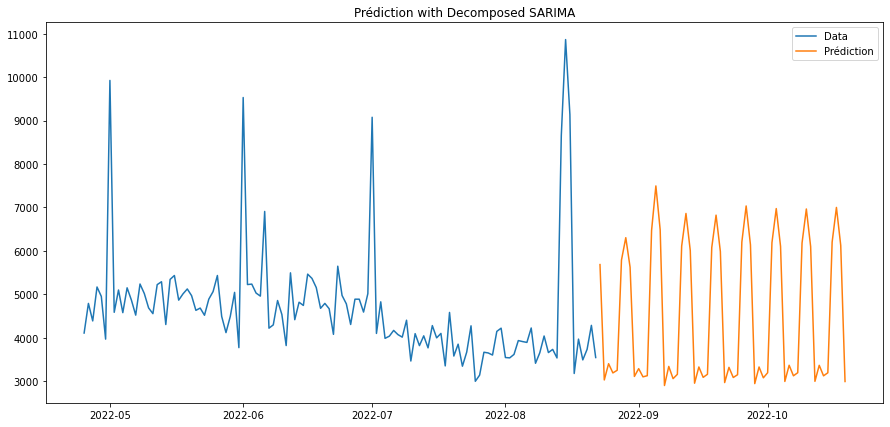

2022-08-23    5684.314041
2022-08-24    3029.313544
2022-08-25    3403.442429
2022-08-26    3191.240385
2022-08-27    3252.003891
2022-08-28    5789.758882
2022-08-29    6303.239976
2022-08-30    5624.341381
2022-08-31    3109.924208
2022-09-01    3289.749508
dtype: float64
Prediction loaded loaded ... 46 s
         25
Filtred Model loaded ... 74 s
2022-08-21    12151.979975
2022-08-22    12428.907334
2022-08-23    11492.961907
2022-08-24    10985.575266
2022-08-25    11042.942228
2022-08-26    11251.153066
2022-08-27    11897.447580
2022-08-28    12651.317765
2022-08-29    12076.321165
2022-08-30    10973.417918
dtype: float64


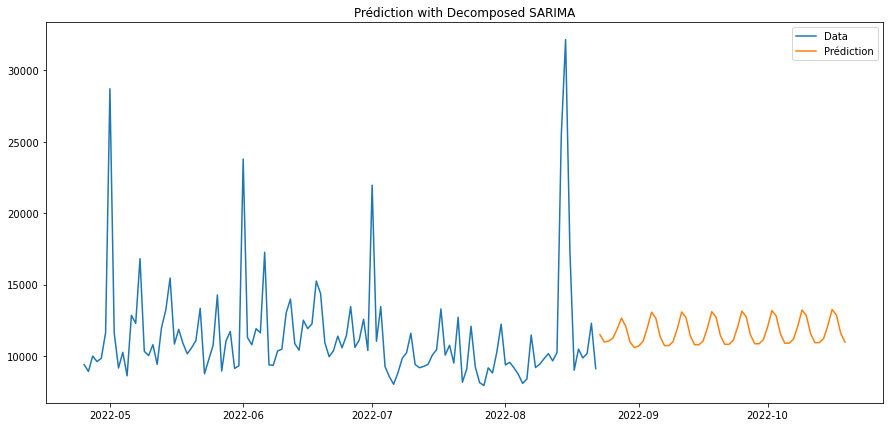

2022-08-23    11492.961907
2022-08-24    10985.575266
2022-08-25    11042.942228
2022-08-26    11251.153066
2022-08-27    11897.447580
2022-08-28    12651.317765
2022-08-29    12076.321165
2022-08-30    10973.417918
2022-08-31    10591.802578
2022-09-01    10698.427897
dtype: float64
Prediction loaded loaded ... 74 s
         29
Base Model loaded ... 57 s
2022-08-21    9357.701063
2022-08-22    7856.764720
2022-08-23    6660.337691
2022-08-24    5882.107730
2022-08-25    5828.643649
2022-08-26    5996.960910
2022-08-27    5939.522478
2022-08-28    8920.301361
2022-08-29    7009.376429
2022-08-30    6377.985185
dtype: float64


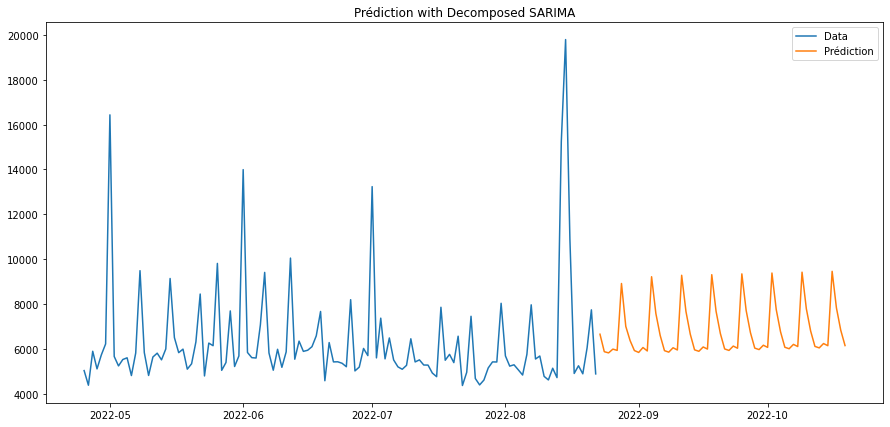

2022-08-23    6660.337691
2022-08-24    5882.107730
2022-08-25    5828.643649
2022-08-26    5996.960910
2022-08-27    5939.522478
2022-08-28    8920.301361
2022-08-29    7009.376429
2022-08-30    6377.985185
2022-08-31    5933.096259
2022-09-01    5849.075939
dtype: float64
Prediction loaded loaded ... 58 s
         30
Filtred Model loaded ... 105 s
2022-08-21     9494.192569
2022-08-22     9759.661193
2022-08-23     9110.499732
2022-08-24     9042.020137
2022-08-25     9345.786987
2022-08-26     9166.463248
2022-08-27     9673.116502
2022-08-28    11013.266162
2022-08-29    10908.255316
2022-08-30     9536.411297
dtype: float64


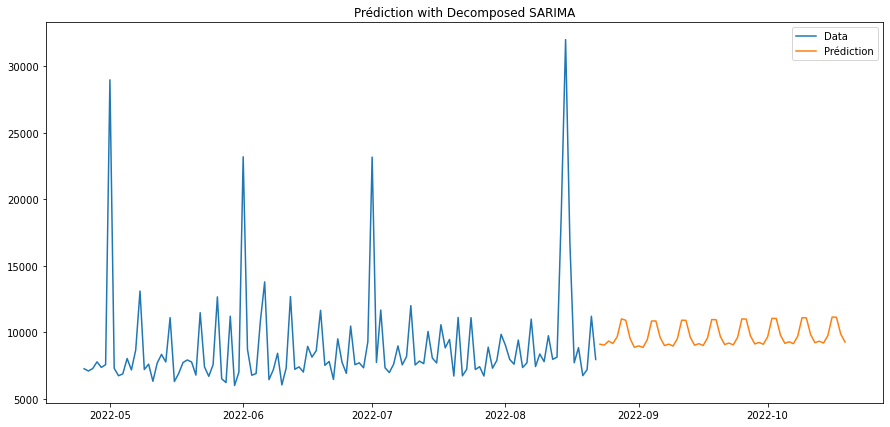

2022-08-23     9110.499732
2022-08-24     9042.020137
2022-08-25     9345.786987
2022-08-26     9166.463248
2022-08-27     9673.116502
2022-08-28    11013.266162
2022-08-29    10908.255316
2022-08-30     9536.411297
2022-08-31     8872.945923
2022-09-01     8985.395787
dtype: float64
Prediction loaded loaded ... 106 s
         32
Base Model loaded ... 66 s
2022-08-21    13520.976076
2022-08-22    10559.069663
2022-08-23     9010.089477
2022-08-24     8011.350488
2022-08-25     8174.289558
2022-08-26     8370.860588
2022-08-27     7940.485815
2022-08-28    13894.695305
2022-08-29    10962.354860
2022-08-30     9190.595500
dtype: float64


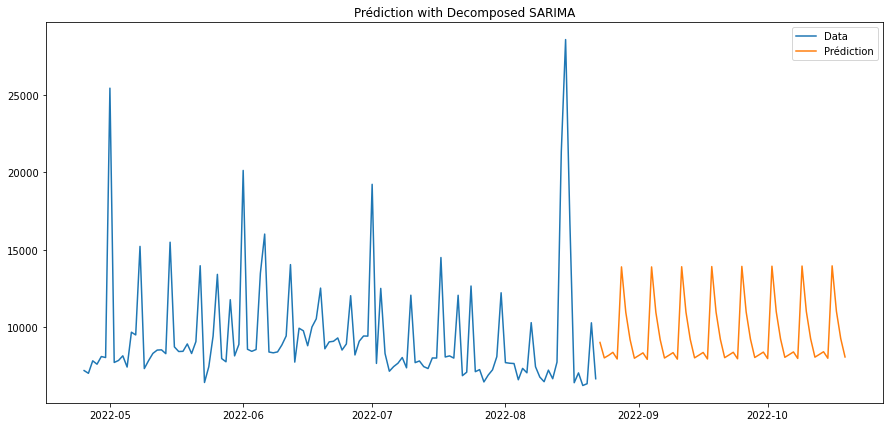

2022-08-23     9010.089477
2022-08-24     8011.350488
2022-08-25     8174.289558
2022-08-26     8370.860588
2022-08-27     7940.485815
2022-08-28    13894.695305
2022-08-29    10962.354860
2022-08-30     9190.595500
2022-08-31     7989.646392
2022-09-01     8162.238084
dtype: float64
Prediction loaded loaded ... 66 s
         33
Base Model loaded ... 57 s
2022-08-21    11161.555455
2022-08-22    10140.559211
2022-08-23     6316.415686
2022-08-24     5435.655731
2022-08-25     6579.017811
2022-08-26     5208.735696
2022-08-27     4830.722234
2022-08-28    10645.328587
2022-08-29     8641.784490
2022-08-30     6057.807686
dtype: float64


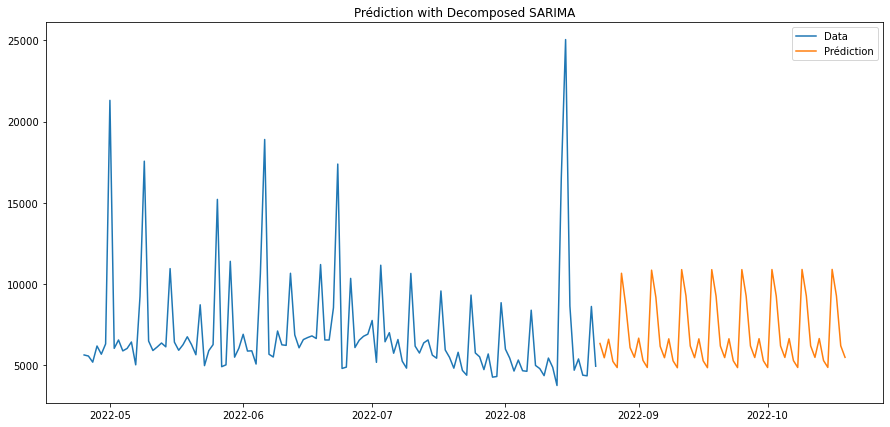

2022-08-23     6316.415686
2022-08-24     5435.655731
2022-08-25     6579.017811
2022-08-26     5208.735696
2022-08-27     4830.722234
2022-08-28    10645.328587
2022-08-29     8641.784490
2022-08-30     6057.807686
2022-08-31     5463.635560
2022-09-01     6643.871463
dtype: float64
Prediction loaded loaded ... 57 s
         34
Neural Decomp Model loaded ... 32 s
2022-08-21    14836.388129
2022-08-22    15678.590157
2022-08-23    11842.939858
2022-08-24     8182.199008
2022-08-25     9147.665394
2022-08-26     8343.811448
2022-08-27     8273.894055
2022-08-28    15510.878722
2022-08-29    17943.588908
2022-08-30    12999.392903
dtype: float64


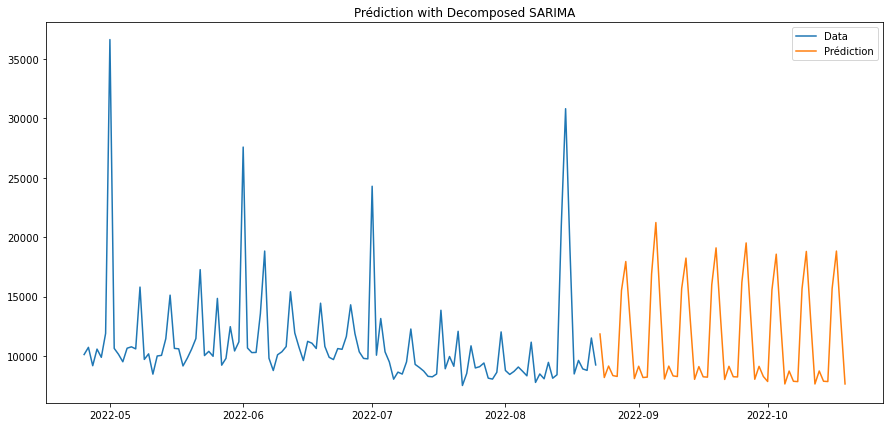

2022-08-23    11842.939858
2022-08-24     8182.199008
2022-08-25     9147.665394
2022-08-26     8343.811448
2022-08-27     8273.894055
2022-08-28    15510.878722
2022-08-29    17943.588908
2022-08-30    12999.392903
2022-08-31     8090.846553
2022-09-01     9132.115164
dtype: float64
Prediction loaded loaded ... 33 s
         36
Base Model loaded ... 214 s
2022-08-21    7186.335491
2022-08-22    7270.995519
2022-08-23    7140.574827
2022-08-24    6195.998324
2022-08-25    6494.395886
2022-08-26    6625.590885
2022-08-27    5418.034227
2022-08-28    6719.434921
2022-08-29    7191.326180
2022-08-30    6953.453251
dtype: float64


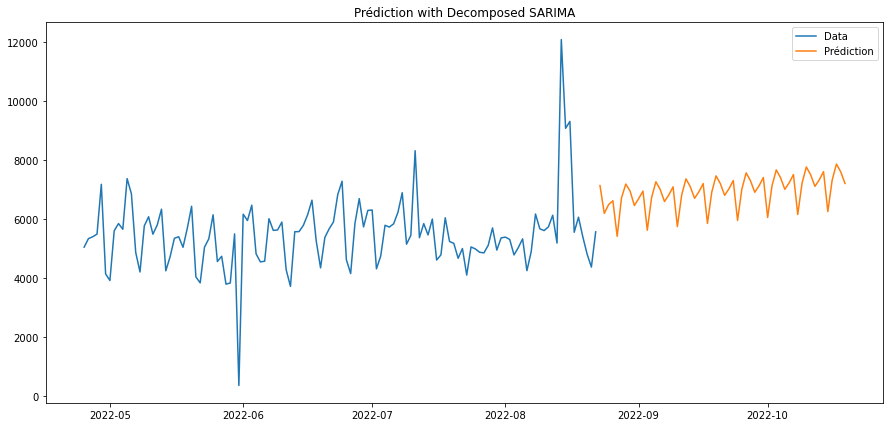

2022-08-23    7140.574827
2022-08-24    6195.998324
2022-08-25    6494.395886
2022-08-26    6625.590885
2022-08-27    5418.034227
2022-08-28    6719.434921
2022-08-29    7191.326180
2022-08-30    6953.453251
2022-08-31    6463.503037
2022-09-01    6697.848930
dtype: float64
Prediction loaded loaded ... 215 s
         39
Base Model loaded ... 86 s
2022-08-21    13518.353650
2022-08-22    13326.056844
2022-08-23    12384.996414
2022-08-24    11095.109023
2022-08-25    11193.964712
2022-08-26    11282.811187
2022-08-27     9990.013262
2022-08-28    13393.170496
2022-08-29    12950.155537
2022-08-30    12205.313506
dtype: float64


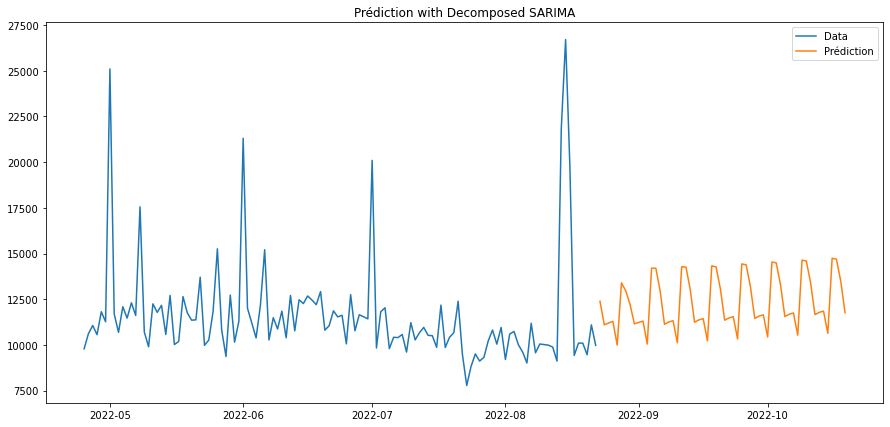

2022-08-23    12384.996414
2022-08-24    11095.109023
2022-08-25    11193.964712
2022-08-26    11282.811187
2022-08-27     9990.013262
2022-08-28    13393.170496
2022-08-29    12950.155537
2022-08-30    12205.313506
2022-08-31    11148.060495
2022-09-01    11227.748549
dtype: float64
Prediction loaded loaded ... 86 s
         40
Neural Decomp Model loaded ... 53 s
2022-08-21    16810.532288
2022-08-22    16434.236165
2022-08-23    11295.470048
2022-08-24     6859.553257
2022-08-25     7819.111581
2022-08-26     7172.008302
2022-08-27     7923.976043
2022-08-28    17949.535500
2022-08-29    18393.605370
2022-08-30    12027.157514
dtype: float64


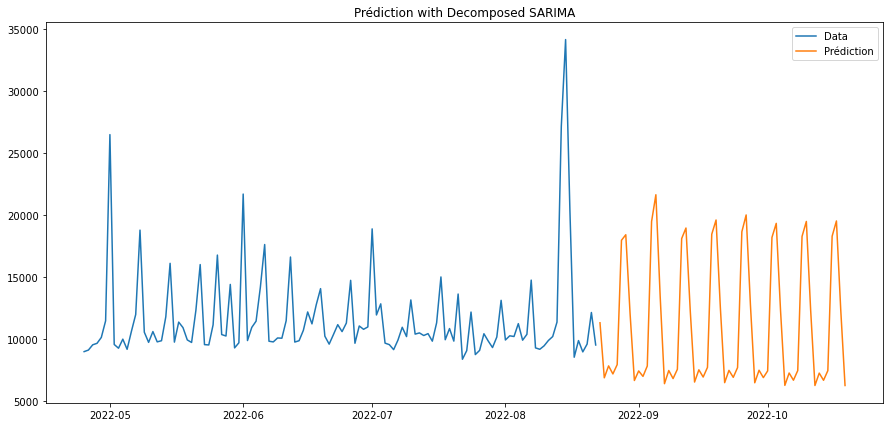

2022-08-23    11295.470048
2022-08-24     6859.553257
2022-08-25     7819.111581
2022-08-26     7172.008302
2022-08-27     7923.976043
2022-08-28    17949.535500
2022-08-29    18393.605370
2022-08-30    12027.157514
2022-08-31     6642.908366
2022-09-01     7413.753123
dtype: float64
Prediction loaded loaded ... 54 s
         41
Filtred Model loaded ... 129 s
2022-08-21    8104.731328
2022-08-22    9473.381814
2022-08-23    8648.617807
2022-08-24    6977.569721
2022-08-25    6233.753931
2022-08-26    6321.050374
2022-08-27    7093.464141
2022-08-28    8958.725051
2022-08-29    9872.283962
2022-08-30    8592.820792
dtype: float64


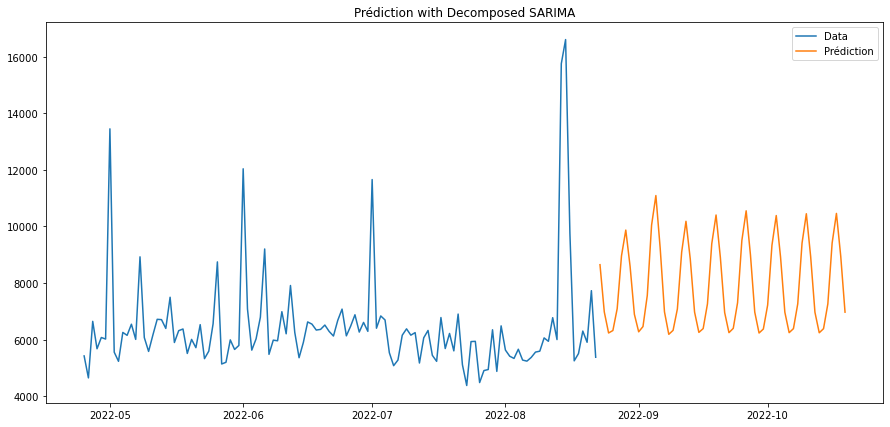

2022-08-23    8648.617807
2022-08-24    6977.569721
2022-08-25    6233.753931
2022-08-26    6321.050374
2022-08-27    7093.464141
2022-08-28    8958.725051
2022-08-29    9872.283962
2022-08-30    8592.820792
2022-08-31    6893.331694
2022-09-01    6275.210390
dtype: float64
Prediction loaded loaded ... 130 s
         42
Base Model loaded ... 57 s
2022-08-21    12608.887957
2022-08-22    11491.918862
2022-08-23    10558.643624
2022-08-24     8194.702287
2022-08-25     8170.771605
2022-08-26     8318.195034
2022-08-27     8165.261317
2022-08-28    11207.795076
2022-08-29     9524.762807
2022-08-30     9168.917384
dtype: float64


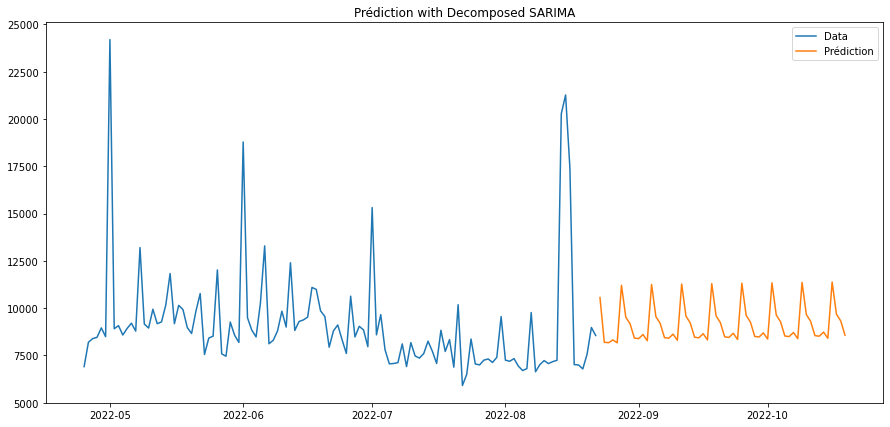

2022-08-23    10558.643624
2022-08-24     8194.702287
2022-08-25     8170.771605
2022-08-26     8318.195034
2022-08-27     8165.261317
2022-08-28    11207.795076
2022-08-29     9524.762807
2022-08-30     9168.917384
2022-08-31     8416.079960
2022-09-01     8386.412917
dtype: float64
Prediction loaded loaded ... 58 s
         43
Base Model loaded ... 55 s
2022-08-21     9336.957346
2022-08-22    10063.028968
2022-08-23     7262.384481
2022-08-24     6154.389427
2022-08-25     6047.719348
2022-08-26     6381.421648
2022-08-27     6002.840350
2022-08-28     8553.548222
2022-08-29     8751.859588
2022-08-30     6725.168065
dtype: float64


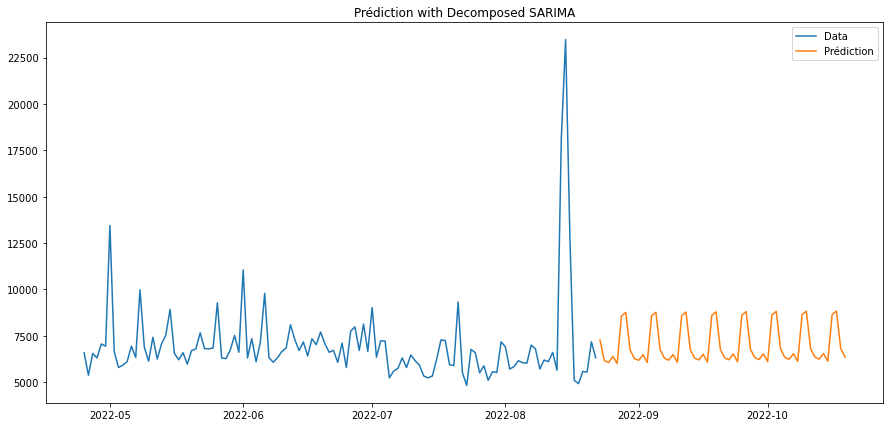

2022-08-23    7262.384481
2022-08-24    6154.389427
2022-08-25    6047.719348
2022-08-26    6381.421648
2022-08-27    6002.840350
2022-08-28    8553.548222
2022-08-29    8751.859588
2022-08-30    6725.168065
2022-08-31    6268.346604
2022-09-01    6168.180734
dtype: float64
Prediction loaded loaded ... 56 s
         44
Base Model loaded ... 61 s
2022-08-21    6128.920207
2022-08-22    6767.205712
2022-08-23    5065.729568
2022-08-24    3720.206860
2022-08-25    3928.391822
2022-08-26    3179.560472
2022-08-27    3192.005125
2022-08-28    6405.878886
2022-08-29    7197.184309
2022-08-30    5309.504235
dtype: float64


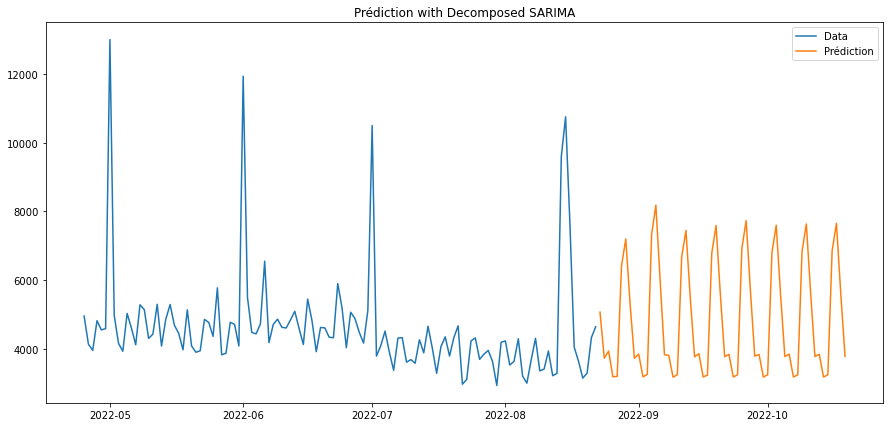

2022-08-23    5065.729568
2022-08-24    3720.206860
2022-08-25    3928.391822
2022-08-26    3179.560472
2022-08-27    3192.005125
2022-08-28    6405.878886
2022-08-29    7197.184309
2022-08-30    5309.504235
2022-08-31    3718.652711
2022-09-01    3841.024882
dtype: float64
Prediction loaded loaded ... 62 s
         46
Neural Decomp Model loaded ... 92 s
2022-08-21    9297.199067
2022-08-22    8973.791354
2022-08-23    7373.784993
2022-08-24    4696.422164
2022-08-25    4660.426680
2022-08-26    4353.348820
2022-08-27    4646.217873
2022-08-28    9414.418056
2022-08-29    9269.613800
2022-08-30    7608.934818
dtype: float64


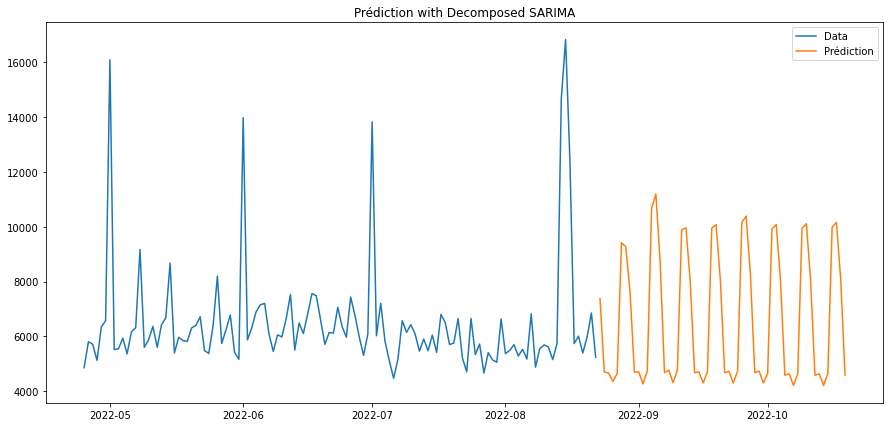

2022-08-23    7373.784993
2022-08-24    4696.422164
2022-08-25    4660.426680
2022-08-26    4353.348820
2022-08-27    4646.217873
2022-08-28    9414.418056
2022-08-29    9269.613800
2022-08-30    7608.934818
2022-08-31    4696.065798
2022-09-01    4706.121670
dtype: float64
Prediction loaded loaded ... 93 s
         49
Base Model loaded ... 76 s
2022-08-21    8794.533431
2022-08-22    7527.419834
2022-08-23    6910.380802
2022-08-24    6422.515890
2022-08-25    6493.335602
2022-08-26    6696.334351
2022-08-27    6377.478056
2022-08-28    8800.698012
2022-08-29    7541.531408
2022-08-30    6924.492376
dtype: float64


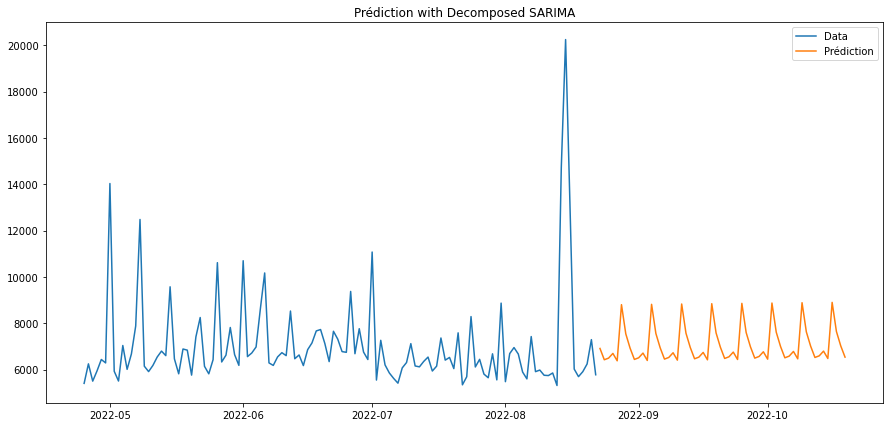

2022-08-23    6910.380802
2022-08-24    6422.515890
2022-08-25    6493.335602
2022-08-26    6696.334351
2022-08-27    6377.478056
2022-08-28    8800.698012
2022-08-29    7541.531408
2022-08-30    6924.492376
2022-08-31    6436.627464
2022-09-01    6507.447176
dtype: float64
Prediction loaded loaded ... 77 s
         50
Base Model loaded ... 125 s
2022-08-21    8394.952484
2022-08-22    7969.096952
2022-08-23    7196.988478
2022-08-24    5986.078418
2022-08-25    6139.749527
2022-08-26    5782.191628
2022-08-27    5348.042309
2022-08-28    8202.051622
2022-08-29    7508.253502
2022-08-30    6961.504920
dtype: float64


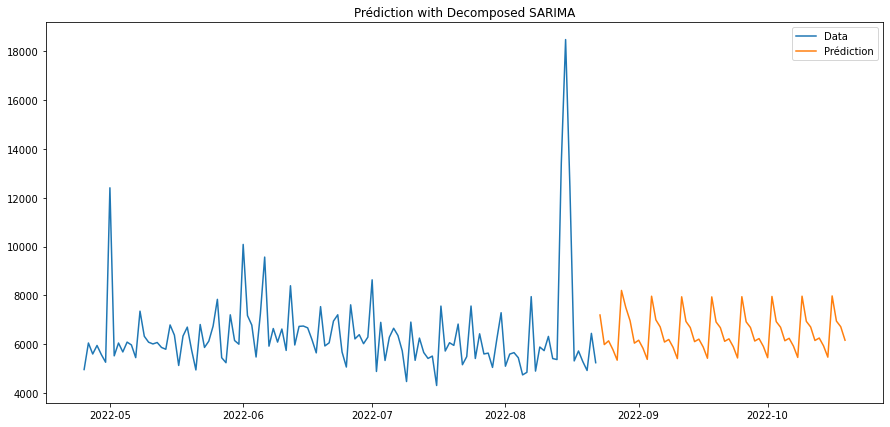

2022-08-23    7196.988478
2022-08-24    5986.078418
2022-08-25    6139.749527
2022-08-26    5782.191628
2022-08-27    5348.042309
2022-08-28    8202.051622
2022-08-29    7508.253502
2022-08-30    6961.504920
2022-08-31    6045.245344
2022-09-01    6164.939975
dtype: float64
Prediction loaded loaded ... 126 s
         59
Neural Decomp Model loaded ... 177 s
2022-08-21    7685.062716
2022-08-22    7157.936248
2022-08-23    4900.670169
2022-08-24    2732.970286
2022-08-25    2872.380324
2022-08-26    4988.223516
2022-08-27    2435.186264
2022-08-28    8155.860518
2022-08-29    8399.310144
2022-08-30    5295.289914
dtype: float64


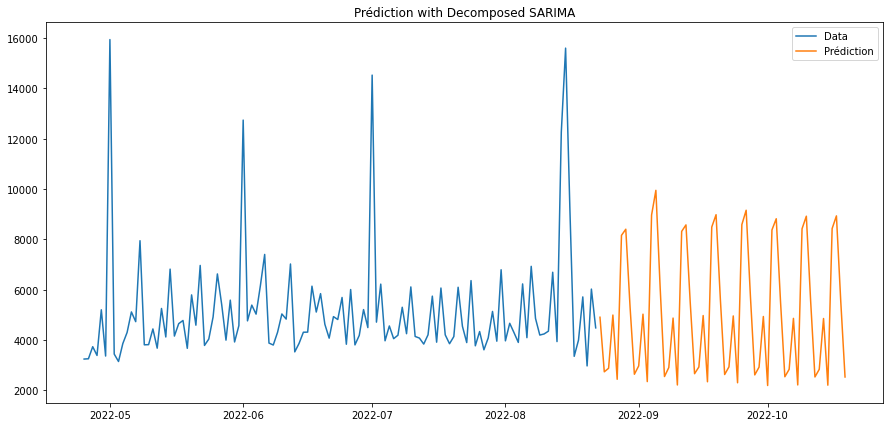

2022-08-23    4900.670169
2022-08-24    2732.970286
2022-08-25    2872.380324
2022-08-26    4988.223516
2022-08-27    2435.186264
2022-08-28    8155.860518
2022-08-29    8399.310144
2022-08-30    5295.289914
2022-08-31    2634.980947
2022-09-01    2965.069934
dtype: float64
Prediction loaded loaded ... 178 s
         62
Base Model loaded ... 242 s
2022-08-21    10832.788121
2022-08-22    10479.545328
2022-08-23     7941.367260
2022-08-24     6758.634219
2022-08-25     6868.740641
2022-08-26     7180.926175
2022-08-27     6930.123043
2022-08-28     9710.930673
2022-08-29     8552.972242
2022-08-30     7269.746608
dtype: float64


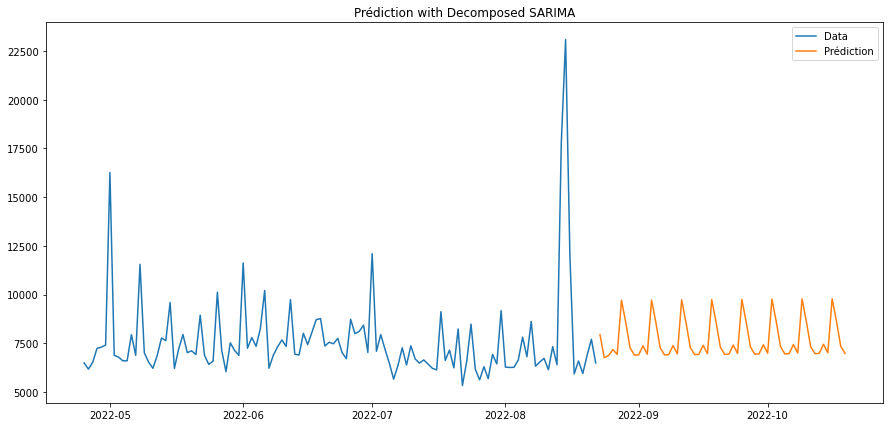

2022-08-23    7941.367260
2022-08-24    6758.634219
2022-08-25    6868.740641
2022-08-26    7180.926175
2022-08-27    6930.123043
2022-08-28    9710.930673
2022-08-29    8552.972242
2022-08-30    7269.746608
2022-08-31    6891.682470
2022-09-01    6906.746876
dtype: float64
Prediction loaded loaded ... 242 s
         64
Base Model loaded ... 86 s
2022-08-21    9664.939401
2022-08-22    8597.477487
2022-08-23    8232.713201
2022-08-24    7645.409598
2022-08-25    7754.897765
2022-08-26    7403.014764
2022-08-27    6730.300277
2022-08-28    9510.773798
2022-08-29    8313.325079
2022-08-30    8092.261234
dtype: float64


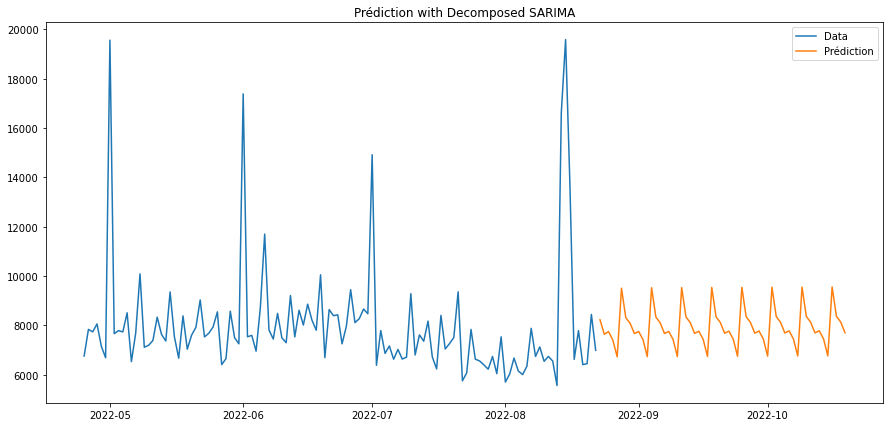

2022-08-23    8232.713201
2022-08-24    7645.409598
2022-08-25    7754.897765
2022-08-26    7403.014764
2022-08-27    6730.300277
2022-08-28    9510.773798
2022-08-29    8313.325079
2022-08-30    8092.261234
2022-08-31    7673.634573
2022-09-01    7756.178863
dtype: float64
Prediction loaded loaded ... 86 s
         65
Neural Decomp Model loaded ... 100 s
2022-08-21    17992.626109
2022-08-22    15753.909141
2022-08-23    10432.172722
2022-08-24     7509.315362
2022-08-25     7280.604920
2022-08-26     7767.273239
2022-08-27     7062.864499
2022-08-28    18825.281826
2022-08-29    17610.377044
2022-08-30    10837.271429
dtype: float64


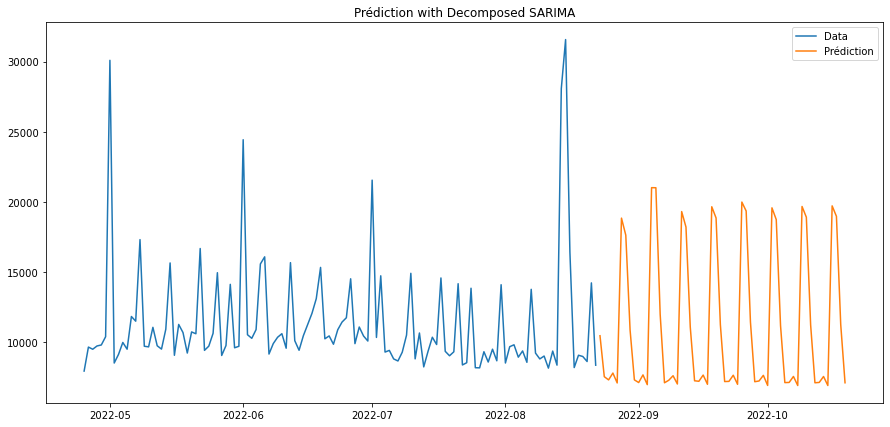

2022-08-23    10432.172722
2022-08-24     7509.315362
2022-08-25     7280.604920
2022-08-26     7767.273239
2022-08-27     7062.864499
2022-08-28    18825.281826
2022-08-29    17610.377044
2022-08-30    10837.271429
2022-08-31     7282.038311
2022-09-01     7092.154535
dtype: float64
Prediction loaded loaded ... 101 s
         68
No Model loaded
         69


C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_17956\3907629704.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  NRMSD = RMSE/(max(validation)-min(validation))


Base Model loaded ... 42 s
2022-08-22    8202.530715
2022-08-23    6841.316924
2022-08-24    6211.252777
2022-08-25    6358.433189
2022-08-26    6584.737453
2022-08-27    6248.759157
2022-08-28    7565.098601
2022-08-29    7161.959264
2022-08-30    6492.772411
2022-08-31    6313.693533
dtype: float64


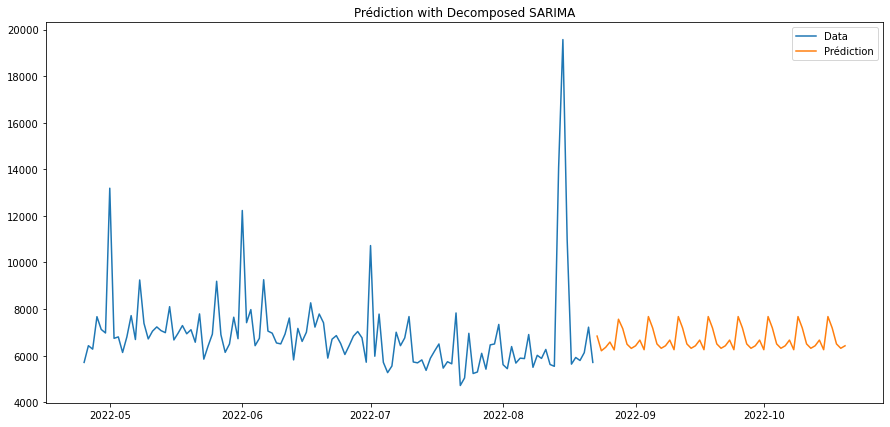

2022-08-23    6841.316924
2022-08-24    6211.252777
2022-08-25    6358.433189
2022-08-26    6584.737453
2022-08-27    6248.759157
2022-08-28    7565.098601
2022-08-29    7161.959264
2022-08-30    6492.772411
2022-08-31    6313.693533
2022-09-01    6423.160421
dtype: float64
Prediction loaded loaded ... 42 s
         76


C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_17956\3907629704.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  NRMSD = RMSE/(max(validation)-min(validation))


Base Model loaded ... 27 s
2022-08-22    7026.233672
2022-08-23    5478.014917
2022-08-24    5222.973332
2022-08-25    5673.716154
2022-08-26    5464.449556
2022-08-27    5550.443267
2022-08-28    9173.304048
2022-08-29    7607.753266
2022-08-30    5815.583359
2022-08-31    5426.356909
dtype: float64


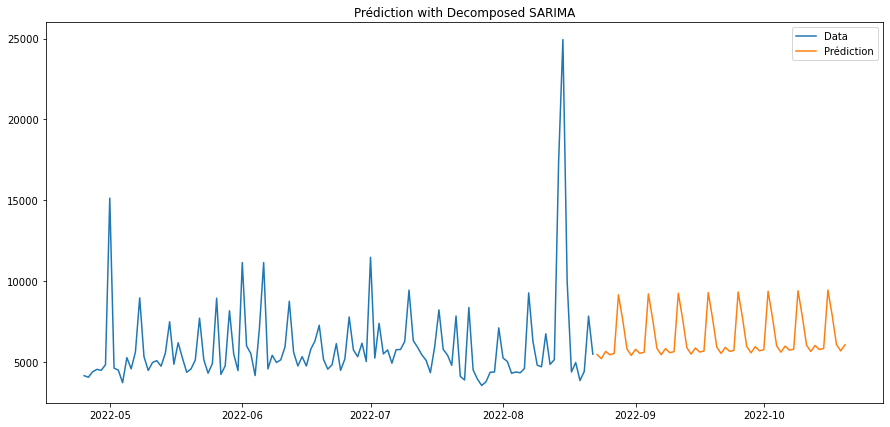

2022-08-23    5478.014917
2022-08-24    5222.973332
2022-08-25    5673.716154
2022-08-26    5464.449556
2022-08-27    5550.443267
2022-08-28    9173.304048
2022-08-29    7607.753266
2022-08-30    5815.583359
2022-08-31    5426.356909
2022-09-01    5803.291602
dtype: float64
Prediction loaded loaded ... 27 s
         78


C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_17956\3907629704.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  NRMSD = RMSE/(max(validation)-min(validation))


Base Model loaded ... 23 s
2022-08-22    14823.488999
2022-08-23     8020.329578
2022-08-24     4937.021665
2022-08-25     5778.852563
2022-08-26     5413.283994
2022-08-27     5655.685541
2022-08-28    14591.354229
2022-08-29    17719.514603
2022-08-30     8658.211904
2022-08-31     4891.840484
dtype: float64


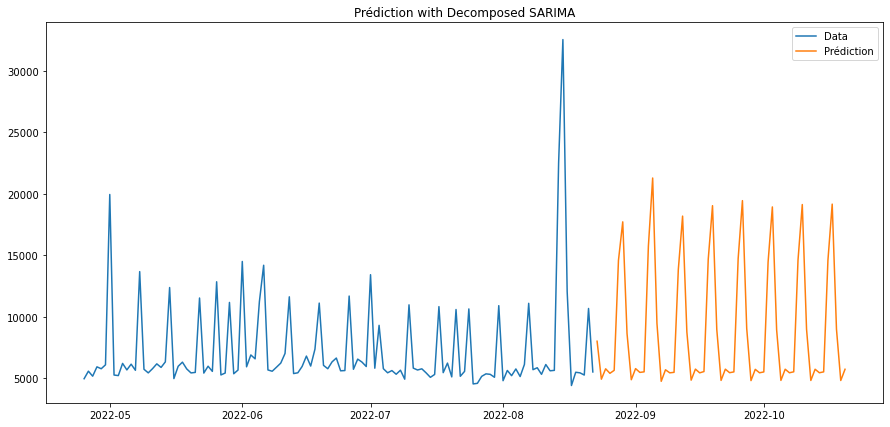

2022-08-23     8020.329578
2022-08-24     4937.021665
2022-08-25     5778.852563
2022-08-26     5413.283994
2022-08-27     5655.685541
2022-08-28    14591.354229
2022-08-29    17719.514603
2022-08-30     8658.211904
2022-08-31     4891.840484
2022-09-01     5795.368290
dtype: float64
Prediction loaded loaded ... 24 s
         81


C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_17956\3907629704.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  NRMSD = RMSE/(max(validation)-min(validation))


Base Model loaded ... 27 s
2022-08-22    11423.378720
2022-08-23    11670.460912
2022-08-24    10091.807778
2022-08-25    10489.786257
2022-08-26    10524.287334
2022-08-27    10725.519677
2022-08-28    12429.896377
2022-08-29    11942.135876
2022-08-30    11870.117199
2022-08-31    10118.339003
dtype: float64


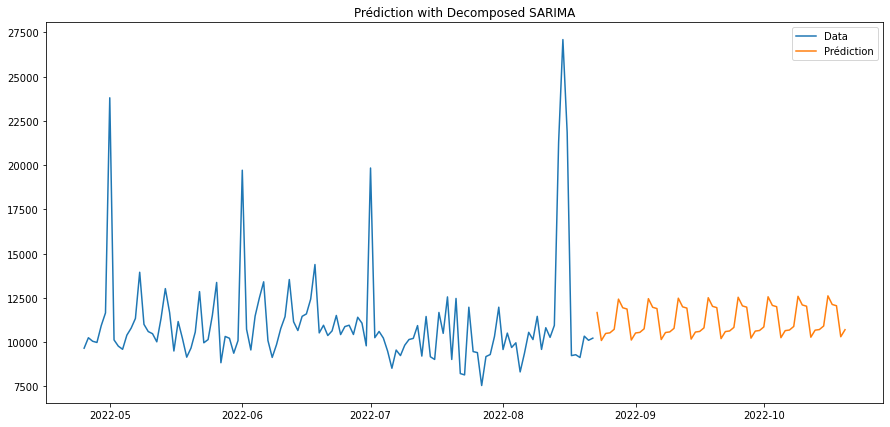

2022-08-23    11670.460912
2022-08-24    10091.807778
2022-08-25    10489.786257
2022-08-26    10524.287334
2022-08-27    10725.519677
2022-08-28    12429.896377
2022-08-29    11942.135876
2022-08-30    11870.117199
2022-08-31    10118.339003
2022-09-01    10516.317482
dtype: float64
Prediction loaded loaded ... 27 s
         82


C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_17956\3907629704.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  NRMSD = RMSE/(max(validation)-min(validation))


Base Model loaded ... 23 s
2022-08-22    6868.960550
2022-08-23    8919.870783
2022-08-24    6667.265474
2022-08-25    6770.252079
2022-08-26    7130.173655
2022-08-27    6515.298650
2022-08-28    7933.875308
2022-08-29    7078.003587
2022-08-30    8986.995910
2022-08-31    6687.878327
dtype: float64


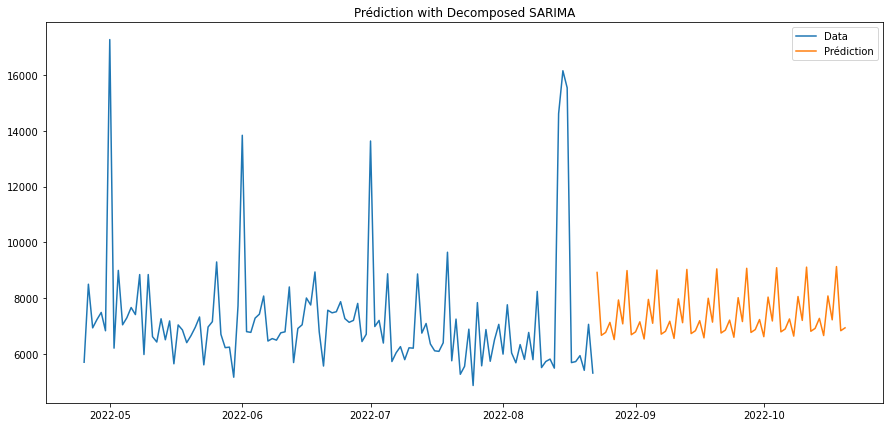

2022-08-23    8919.870783
2022-08-24    6667.265474
2022-08-25    6770.252079
2022-08-26    7130.173655
2022-08-27    6515.298650
2022-08-28    7933.875308
2022-08-29    7078.003587
2022-08-30    8986.995910
2022-08-31    6687.878327
2022-09-01    6790.864933
dtype: float64
Prediction loaded loaded ... 24 s
         84
Filtred Model loaded ... 42 s
2022-08-22    5842.042720
2022-08-23    5233.895239
2022-08-24    5141.162053
2022-08-25    5194.635486
2022-08-26    5262.822261
2022-08-27    5812.985079
2022-08-28    6564.646257
2022-08-29    6266.999255
2022-08-30    5597.784511
2022-08-31    5393.631916
dtype: float64


C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_17956\3907629704.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  NRMSD = RMSE/(max(validation)-min(validation))


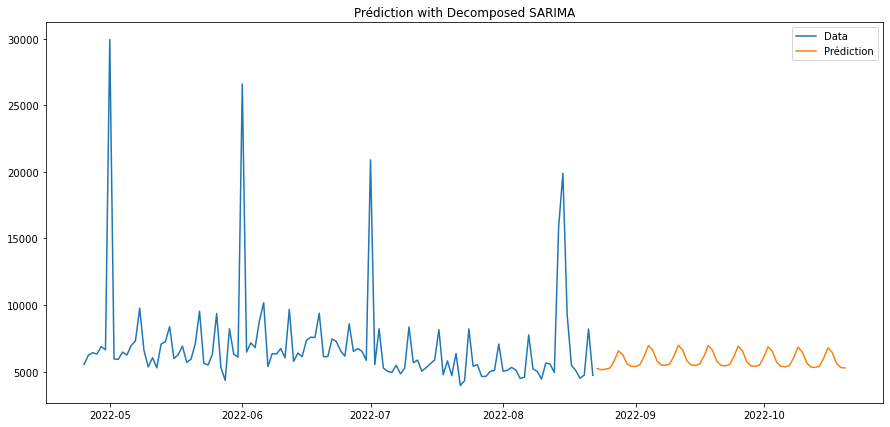

2022-08-23    5233.895239
2022-08-24    5141.162053
2022-08-25    5194.635486
2022-08-26    5262.822261
2022-08-27    5812.985079
2022-08-28    6564.646257
2022-08-29    6266.999255
2022-08-30    5597.784511
2022-08-31    5393.631916
2022-09-01    5394.988607
dtype: float64
Prediction loaded loaded ... 43 s
         89


C:\Users\k.dubrulle\AppData\Local\Temp\ipykernel_17956\3907629704.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  NRMSD = RMSE/(max(validation)-min(validation))


Filtred Model loaded ... 42 s
2022-08-22    3589.223862
2022-08-23    3559.056343
2022-08-24    3799.136070
2022-08-25    3985.025900
2022-08-26    4098.058374
2022-08-27    4639.565629
2022-08-28    5401.462309
2022-08-29    5288.057250
2022-08-30    4603.481347
2022-08-31    4281.057226
dtype: float64


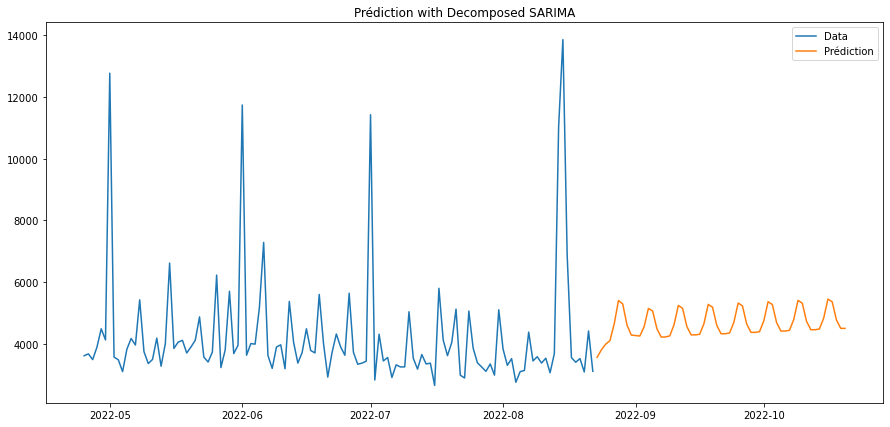

2022-08-23    3559.056343
2022-08-24    3799.136070
2022-08-25    3985.025900
2022-08-26    4098.058374
2022-08-27    4639.565629
2022-08-28    5401.462309
2022-08-29    5288.057250
2022-08-30    4603.481347
2022-08-31    4281.057226
2022-09-01    4264.444550
dtype: float64
Prediction loaded loaded ... 42 s
         93
No Model loaded


In [105]:
day_predicted = 60
conn = engine_INSERT.connect()

for key, timeseries in all_mag_ts.items():
    start_pred=  time()
    print("=====================\n         " + str(key) + "\n=====================")

    sql_cmd = '''SELECT ['''+TABLE_MODEL+'''.Libelle], 
    ['''+TABLE_MODEL+'''.KEY],['''+TABLE_MODEL+'''.Method],['''+TABLE_MODEL+'''.Window]
    FROM  ['''+DB_INSERT+'''].['''+schema_INSERT+'''].['''+TABLE_B_MODEL+''']
    INNER JOIN  ['''+DB_INSERT+'''].['''+schema_INSERT+'''].['''+TABLE_MODEL+''']
    ON ['''+TABLE_MODEL+'''.KEY] = ['''+TABLE_B_MODEL+'''.'''+TABLE_MODEL+'''.KEY]
    WHERE ['''+TABLE_B_MODEL+'''.'''+MAGASIN+'''.KEY] = ''' + str(int(key)) + '''
    AND  ['''+TABLE_B_MODEL+'''.'''+TABLE_PARAMS+'''.KEY] = ''' + str(params_key)

    model_df = pd.read_sql(sql_cmd, conn)
    if len(model_df.values) == 0:
        print("No Model loaded")
        continue
        
    model_lib = model_df.values[0][0].replace(" ", "")
    model_key = model_df.values[0][1]
    method    = model_df.values[0][2].replace(" ", "")
    WINDOW    = model_df.values[0][3]
    if not WINDOW is None:
        WINDOW = int(WINDOW)
    
    pred = get_prediction(timeseries, model_lib, day_predicted, TEMPS_DETAIL, RECETTE_DETAIL,
                              season = 7, method = method, WINDOW=WINDOW, show_plot=True)
    print(pred.head(10))
    
    for d in pred.index:
        sql_cmd = '''INSERT INTO ['''+DB_INSERT+'''].['''+schema_INSERT+'''].['''+TABLE_PRED+''']
        VALUES ('''  + str(params_key) + '''
                ,''' + str(model_key) + '''
                ,''' + str(date_to_key(d)) + '''
                ,NULL
                ,''' + str(key) + '''
                ,''' + str(round(pred[d],2)) + ''')'''                                                                               
#         print(sql_cmd)
        conn.execute(sql_cmd)
    
    
    print("Prediction loaded loaded ...", int(time()-start_pred), "s")

conn.close()

In [ ]:
print("Total Time Taken: ~" + str(int(time() - Very_Start)) + "secondes") 